# Sales Forecasting

The objective of the current problem is to analyze the sales of a given set of stores at various locations in Europe and build models so as to forecast for future dates. 

We shall build models for each store separately. For the current analysis, we limit our model building process only for the stores labelled 1, 3, 8, 9, 13, 25, 29, 31 and 46.

The goal of the current project is to use Time Series Analysis based methods to build the machine learning models for the purpose of forecasting. 

In [1]:
# import basic packages
import numpy as np;
import pandas as pd;
import matplotlib.pyplot as plt;
import seaborn as sb;

In [2]:
# Read the datasets
sales = pd.read_csv("train.csv");
stores = pd.read_csv("store.csv");

C:\Users\syadati\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
sales.Date = pd.to_datetime(sales.Date)
sales.head(5)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


July 31st, 2015 is a Friday, hence, DayOfWeek = 5 corresponds to Friday. DayOfWeek =1 is Monday and Sunday corresponds to 7, by this logic.

In [4]:
stores.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


Merge the two datasets, stores and train on the column "Store", which is common to both of them.

In [5]:
df = sales.merge(stores, how="inner", on="Store"); 

df.sample(5)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
562613,617,1,2014-01-20,9677,760,1,1,0,0,a,c,8940.0,NaN,NaN,1,9.0,2011.0,"Jan,Apr,Jul,Oct"
819733,899,1,2013-03-18,9634,914,1,1,0,0,d,a,2590.0,NaN,NaN,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
183413,203,6,2014-03-29,5772,816,1,0,0,0,c,c,490.0,11.0,2002.0,0,NaN,NaN,NaN
287078,316,4,2013-10-17,7930,830,1,0,0,0,d,a,9000.0,8.0,2001.0,0,NaN,NaN,NaN
809065,888,3,2015-01-21,6255,653,1,0,0,0,d,a,4450.0,6.0,2012.0,1,35.0,2012.0,"Mar,Jun,Sept,Dec"


Let us only focus on those 9 stores, specified in the problem statement, labelled 1, 3, 8, 9, 13, 25, 29, 31 and 46.

In [6]:
store_ids = [1, 3, 8, 9, 13, 25, 29, 31, 46]

df = df[df.Store.isin(store_ids)]
df.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
count,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,6410.000000,6410.000000,8110.000000,2458.000000,2458.000000
mean,17.826634,3.998520,5394.031566,590.330210,0.823798,0.381258,0.177435,4479.442663,8.412168,2006.910452,0.303083,23.559805,2010.383238
std,13.989612,1.997532,3455.976814,421.269874,0.381016,0.485726,0.382060,4714.857046,2.352367,4.603190,0.459619,14.319480,0.923837
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,310.000000,4.000000,2000.000000,0.000000,14.000000,2009.000000
25%,8.000000,2.000000,3792.250000,421.000000,1.000000,0.000000,0.000000,1200.000000,7.000000,2003.000000,0.000000,14.000000,2009.000000
50%,13.000000,4.000000,5406.000000,573.000000,1.000000,0.000000,0.000000,2030.000000,9.000000,2006.000000,0.000000,14.000000,2011.000000
75%,29.000000,6.000000,7252.500000,720.000000,1.000000,1.000000,0.000000,7520.000000,10.000000,2012.000000,1.000000,45.000000,2011.000000
max,46.000000,7.000000,24882.000000,2835.000000,1.000000,1.000000,1.000000,14130.000000,12.000000,2014.000000,1.000000,45.000000,2011.000000


## Exploratory Data Analysis

Let us check the distribution of our stores over "StoreType" and "Assortment"

In [7]:
df.groupby("StoreType").Store.unique()

StoreType
a       [3, 8, 9]
c     [1, 25, 46]
d    [13, 29, 31]
Name: Store, dtype: object

In [8]:
df.groupby("Assortment").Store.unique()

Assortment
a    [1, 3, 8, 13, 25, 46]
c              [9, 29, 31]
Name: Store, dtype: object

So, the stores given in the problem statement correspond to almost all the Store types and a couple of assortments.

Let us check for missing values in our dataset.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 42043
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Store                      8110 non-null   int64         
 1   DayOfWeek                  8110 non-null   int64         
 2   Date                       8110 non-null   datetime64[ns]
 3   Sales                      8110 non-null   int64         
 4   Customers                  8110 non-null   int64         
 5   Open                       8110 non-null   int64         
 6   Promo                      8110 non-null   int64         
 7   StateHoliday               8110 non-null   object        
 8   SchoolHoliday              8110 non-null   int64         
 9   StoreType                  8110 non-null   object        
 10  Assortment                 8110 non-null   object        
 11  CompetitionDistance        8110 non-null   float64       
 12  Compe

In [10]:
df.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
count,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,8110.000000,6410.000000,6410.000000,8110.000000,2458.000000,2458.000000
mean,17.826634,3.998520,5394.031566,590.330210,0.823798,0.381258,0.177435,4479.442663,8.412168,2006.910452,0.303083,23.559805,2010.383238
std,13.989612,1.997532,3455.976814,421.269874,0.381016,0.485726,0.382060,4714.857046,2.352367,4.603190,0.459619,14.319480,0.923837
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,310.000000,4.000000,2000.000000,0.000000,14.000000,2009.000000
25%,8.000000,2.000000,3792.250000,421.000000,1.000000,0.000000,0.000000,1200.000000,7.000000,2003.000000,0.000000,14.000000,2009.000000
50%,13.000000,4.000000,5406.000000,573.000000,1.000000,0.000000,0.000000,2030.000000,9.000000,2006.000000,0.000000,14.000000,2011.000000
75%,29.000000,6.000000,7252.500000,720.000000,1.000000,1.000000,0.000000,7520.000000,10.000000,2012.000000,1.000000,45.000000,2011.000000
max,46.000000,7.000000,24882.000000,2835.000000,1.000000,1.000000,1.000000,14130.000000,12.000000,2014.000000,1.000000,45.000000,2011.000000


In [11]:
df.groupby("Store").describe(percentiles=[]).transpose()

Store                          1            3           8           9   \
DayOfWeek       count  942.000000   942.000000  942.000000  942.000000   
                mean     3.997877     3.997877    3.997877    3.997877   
                std      1.998404     1.998404    1.998404    1.998404   
                min      1.000000     1.000000    1.000000    1.000000   
                50%      4.000000     4.000000    4.000000    4.000000   
...                           ...          ...         ...         ...   
Promo2SinceYear mean          NaN  2011.000000         NaN         NaN   
                std           NaN     0.000000         NaN         NaN   
                min           NaN  2011.000000         NaN         NaN   
                50%           NaN  2011.000000         NaN         NaN   
                max           NaN  2011.000000         NaN         NaN   

Store                           13          25          29          31  \
DayOfWeek       count   758.000000  942.000000  942.000000  942.000000   
                mean      4.001319    3.997877    3.997877    3.997877   
                std       1.999009    1.998404    1.998404    1.998404   
                min       1.000000    1.000000    1.000000    1.000000   
                50%       4.000000    4.000000    4.000000    4.000000   
...                            ...         ...         ...         ...   
Promo2SinceYear mean   2009.000000         NaN         NaN         NaN   
                std       0.000000         NaN         NaN         NaN   
                min    2009.000000         NaN         NaN         NaN   
                50%    2009.000000         NaN         NaN         NaN   
                max    2009.000000         NaN         NaN         NaN   

Store                           46  
DayOfWeek       count   758.000000  
                mean      4.001319  
                std       1.999009  
                min       1.000000  
                50%       4.000000  
...                            ...  
Promo2SinceYear mean   2011.000000  
                std       0.000000  
                min    2011.000000  
                50%    2011.000000  
                max    2011.000000  

[72 rows x 9 columns]

## Domain based feature engineering

For the sales forecasting, since we are going to perform time series analysis, it makes sense to get rid of the parameters which are going to remain constant across time or irrelavent to our analysis. Also, they have many missing entries. These parameters are:

1. Store Type
2. Assortment
3. Competition Distance
4. Competition Open since month/year
5. Promo since week/year

In [12]:
df.drop(["StoreType", "Assortment", "CompetitionDistance", "CompetitionOpenSinceMonth", "CompetitionOpenSinceYear",
         "Promo2SinceWeek", "Promo2SinceYear"], axis=1, inplace=True)

Although from df.info() it appears that we do not have any missing data, let us check if we have expected number of entries per store for the date range of start to end dates in the dataset.

In [13]:
period = pd.date_range(df.Date.min(), df.Date.max());
print("Number of entries expected per store = ", len(period));
print("Hence, total number of entries expected for 9 stores = ", 9 *len(period));
print("Length of available data = ", len(df))
print("Missing data length = ", (9*len(period) - len(df)))

Number of entries expected per store =  942
Hence, total number of entries expected for 9 stores =  8478
Length of available data =  8110
Missing data length =  368


Let us visualize the data

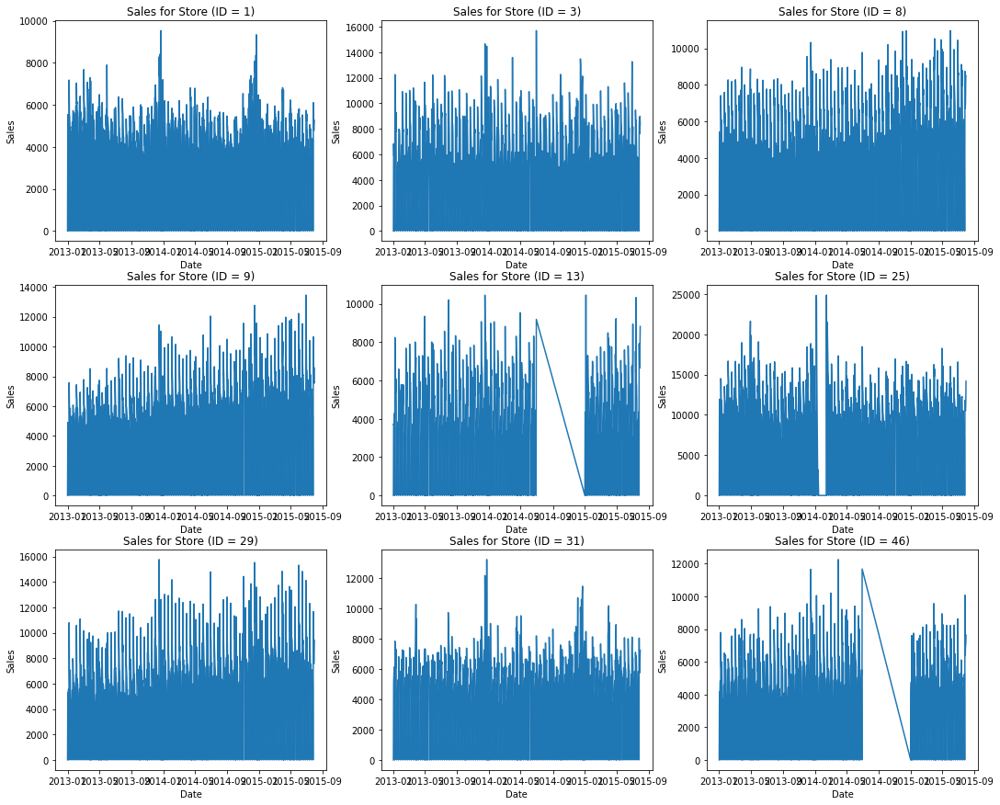

In [14]:
fig, axs = plt.subplots(3, 3, figsize=(18, 15))

for i,store_id in enumerate(store_ids):
    df_store = df[df.Store == store_id];
    plt.subplot(3,3,i+1)
    sb.lineplot(data=df_store, x="Date", y="Sales", ax=plt.gca());
    plt.title("Sales for Store (ID = " + str(store_id) + ")")
plt.show()

For the aboveplots, we see that <b>store 13</b>, <b>store 25</b> and <b>store 46</b> missing data, we have 3 options:
1. Just assume that the store was not open, hence, sales, customers etc are 0s OR
2. Interpolate data during the missing periods, based on DayOfWeek
3. Use machine learning models to predict the missing data

Let us go with an <b>assumption that the three stores are closed during period where do not have data</b>.


In order to impute the missing data, it also makes sense to understand the available data.

<AxesSubplot:xlabel='DayOfWeek', ylabel='count'>

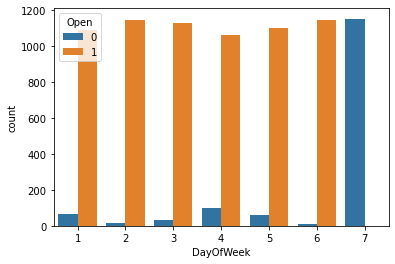

In [15]:
sb.countplot(data=df, x="DayOfWeek", hue="Open")

From the above plot, we can see that the store was never open on DayOfWeek=7, which is Sunday. The rest of the days could be a holiday (such as Christmas, etc).

### Sales Promo Analysis

In our dataset, we have two types of promotions, "Promo" and "Promo2". However, "Promo2" seems to be present during some specified months.

In [16]:
import calendar;

df.PromoInterval.fillna("", inplace=True);

def get_months(promo_interval):
    months = [];
    if promo_interval:    
        months = [list(calendar.month_abbr).index(mnth) for mnth in promo_interval.split(",")]
    return months;

def promo_avail(promo_subscribed, date, promo_interval):
    if (promo_subscribed == 0):
        return 0;    
    if (date.month in get_months(promo_interval)):
        return 1;
    else:
        return 0;
    
df["Promo2_Subscribed"] = df.apply(lambda x: promo_avail(x.Promo2, x.Date, x.PromoInterval), axis=1)

In [17]:
df.drop(["Promo2", "PromoInterval"], axis=1, inplace=True);
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2_Subscribed
0,1,5,2015-07-31,5263,555,1,1,0,1,0
1,1,4,2015-07-30,5020,546,1,1,0,1,0
2,1,3,2015-07-29,4782,523,1,1,0,1,0
3,1,2,2015-07-28,5011,560,1,1,0,1,0
4,1,1,2015-07-27,6102,612,1,1,0,1,0


In [18]:
df.StateHoliday.unique()

array(['0', 'a', 'b', 'c', 0], dtype=object)

There are 5 different entries, and 3 types of holidays. For the sake of convenience, let us group all holidays together. This way, we only deal with a bool value, 0 or 1 for State Holiday. We could also have tried creating dummy vairables, but, for the sake of simplicity, we plan to use 0 or 1 for this State Holiday.

In [19]:
df.StateHoliday = df.StateHoliday.apply(lambda x : 0 if (x == '0') else 1)
df.StateHoliday.unique()

array([0, 1], dtype=int64)

In [20]:
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2_Subscribed
0,1,5,2015-07-31,5263,555,1,1,0,1,0
1,1,4,2015-07-30,5020,546,1,1,0,1,0
2,1,3,2015-07-29,4782,523,1,1,0,1,0
3,1,2,2015-07-28,5011,560,1,1,0,1,0
4,1,1,2015-07-27,6102,612,1,1,0,1,0


### Data Visualization and EDA

#### Outliers in Sales and Customers

<AxesSubplot:xlabel='Store', ylabel='Sales'>

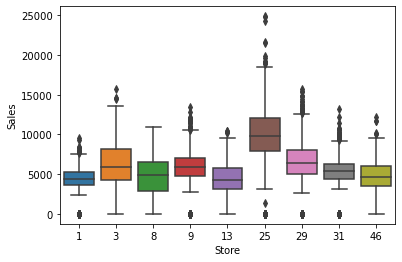

In [21]:
sb.boxplot(data=df, y="Sales", x="Store")

<AxesSubplot:xlabel='Store', ylabel='Customers'>

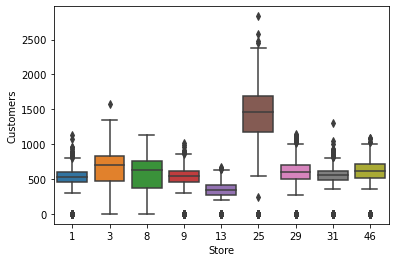

In [22]:
sb.boxplot(data=df, y="Customers", x="Store")

#### Effect of holidays on Sales

<AxesSubplot:xlabel='Store', ylabel='Sales'>

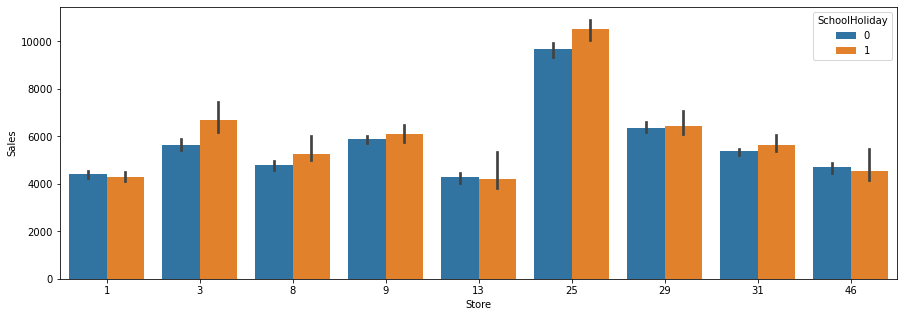

In [23]:
plt.figure(figsize=(15, 5))
sb.barplot(data=df, x="Store", y="Sales", hue="SchoolHoliday", estimator=np.median)

<AxesSubplot:xlabel='Store', ylabel='Sales'>

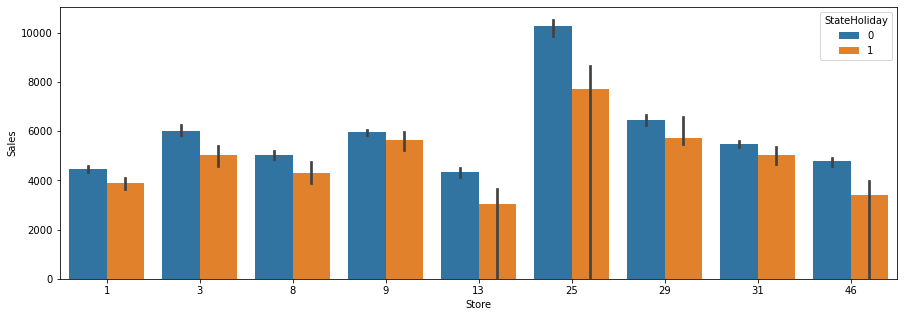

In [24]:
plt.figure(figsize=(15, 5))
sb.barplot(data=df, x="Store", y="Sales", hue="StateHoliday", estimator=np.median)

It looks like there is a slight impact on the holidays, but not very much. On school holidays, sales were slightly higher, while on State Hoidays it is slightly lower. Is this because we have the stores closed on State Holidays too and the sales are zeros? Let us check.

In [25]:
df[["StateHoliday", "Open"]].corr()

,StateHoliday,Open
StateHoliday,1.000000,-0.175635
Open,-0.175635,1.000000


In [26]:
df.groupby("StateHoliday").Open.value_counts(normalize=True)

StateHoliday  Open
0             1       0.852632
              0       0.147368
1             1       0.668504
              0       0.331496
Name: Open, dtype: float64

Hence, we have 85% of the times the stores are open on StateHolidays. The rest 15% might be causing the impact.

##### Effect of Promo on Sales

<AxesSubplot:xlabel='Store', ylabel='Sales'>

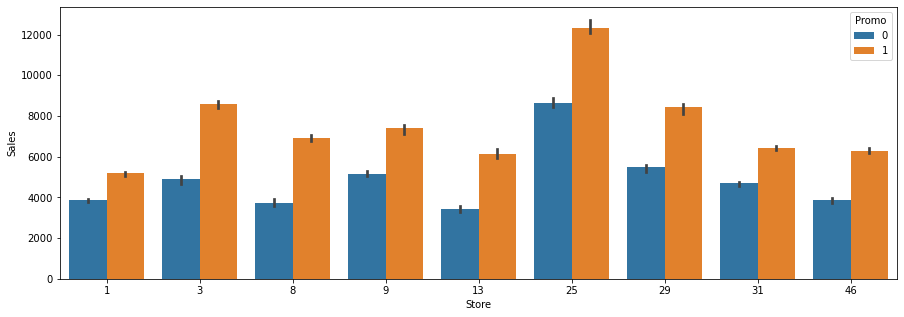

In [27]:
plt.figure(figsize=(15, 5))
sb.barplot(data=df, x="Store", y="Sales", hue="Promo", estimator=np.median)

It looks like, when the Promo is enabled, we have a rise in sales.

#### Effect of sales on open/close

<AxesSubplot:xlabel='Store', ylabel='Sales'>

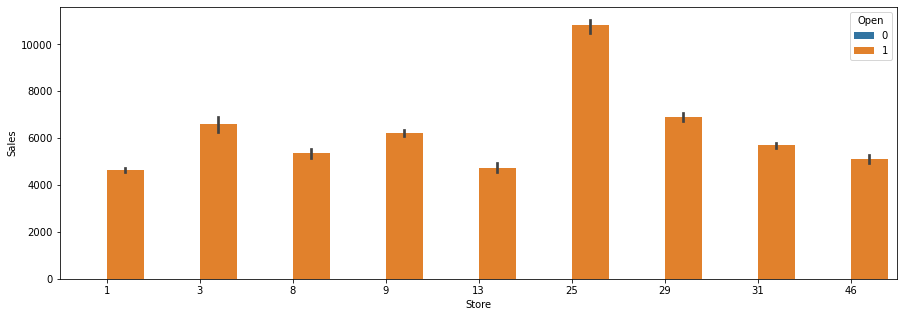

In [28]:
plt.figure(figsize=(15, 5))
sb.barplot(data=df, x="Store", y="Sales", hue="Open", estimator=np.median)

In [29]:
len(df[(df.StateHoliday==1) & (df.Open==0)])/len(df[df.StateHoliday==1])

0.331496062992126

In [30]:
len(df[(df.SchoolHoliday==1) & (df.Open==0)])/len(df[df.SchoolHoliday==1])

0.10284920083391244

<AxesSubplot:xlabel='DayOfWeek', ylabel='Open'>

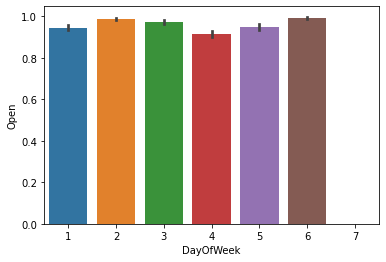

In [31]:
sb.barplot(data=df, x="DayOfWeek", y="Open")

#### Effect of saes on DayOfWeek

<AxesSubplot:xlabel='Store', ylabel='Sales'>

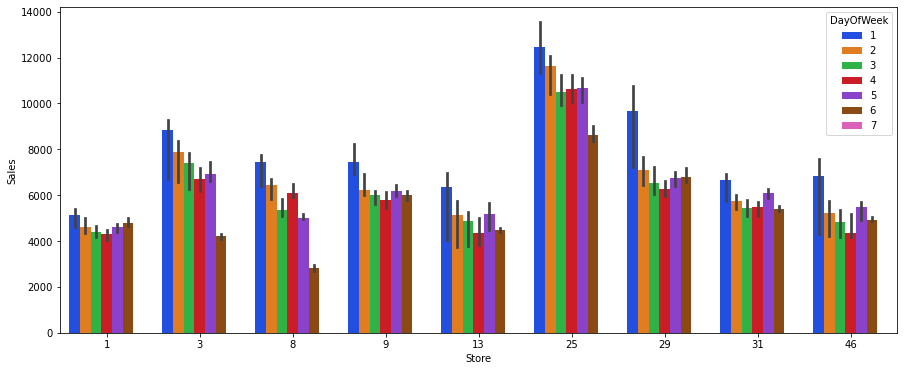

In [32]:
plt.figure(figsize=(15, 6))
sb.barplot(data=df, x="Store", y="Sales", hue="DayOfWeek", estimator = np.median, palette="bright")

On Day 7 (Sundays), sales are always 0. Sales are highest on Mondays (Day 1) and gradually reduces, picks up over Fridays and Saturdays (days 5 and 6, respectively)

<AxesSubplot:xlabel='Store', ylabel='Sales'>

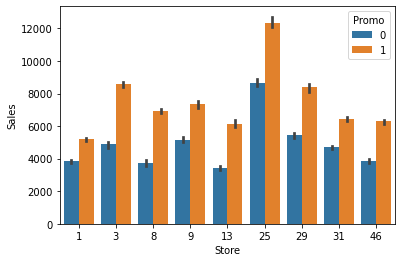

In [33]:
sb.barplot(data=df, x="Store", y="Sales", hue="Promo", estimator=np.median)

<AxesSubplot:xlabel='Store', ylabel='Sales'>

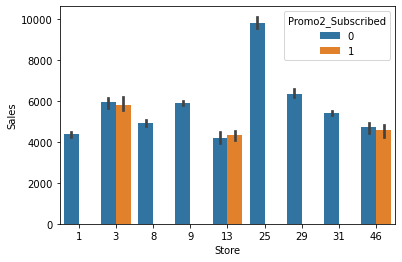

In [34]:
sb.barplot(data=df, x="Store", y="Sales", hue="Promo2_Subscribed", estimator = np.median)

Only 3 stores have Promo2 subscription enabled and it did not have major impact on sales.

Finally, let us look at the correlation matrix (via heatmaps) for each store across all parameters

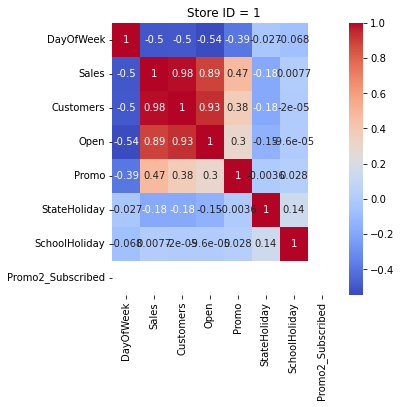

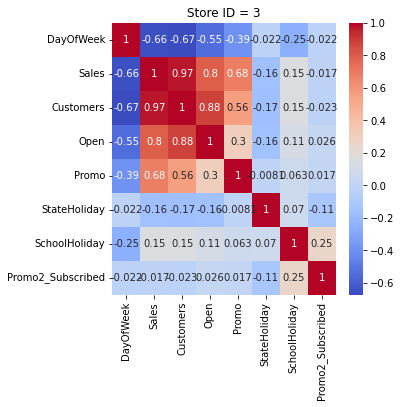

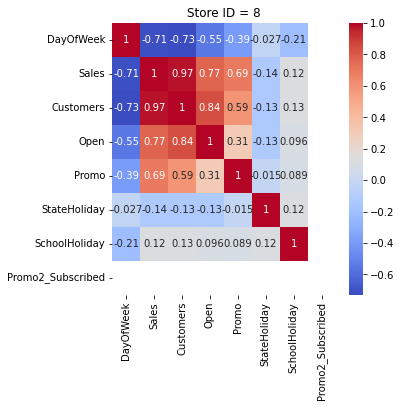

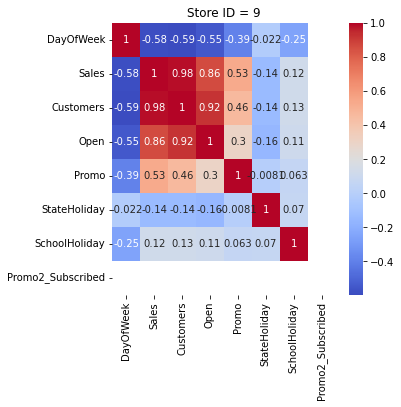

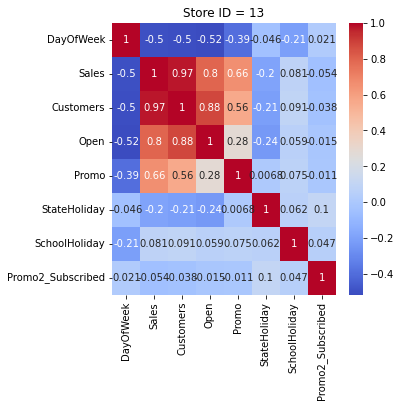

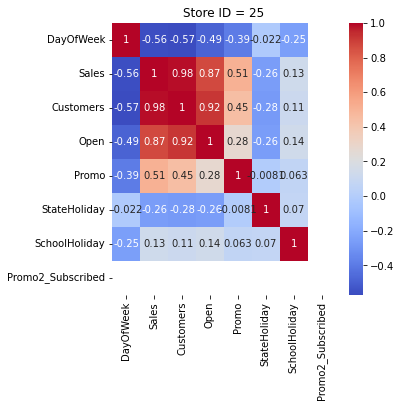

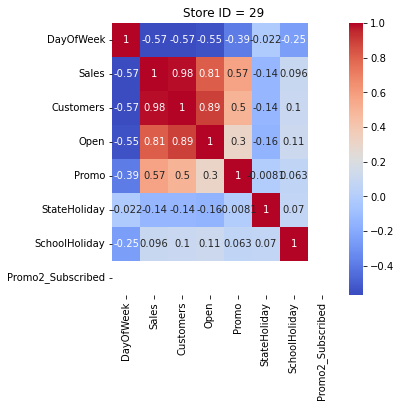

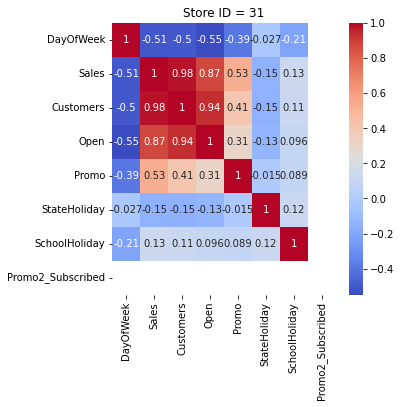

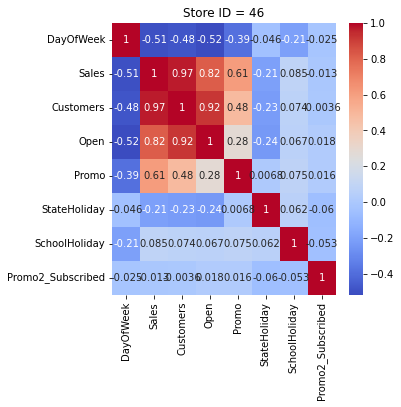

In [35]:
for store_id in store_ids:
    df_store = df[df.Store == store_id];
    plt.figure(figsize=(5,5))
    sb.heatmap(df_store.drop(["Date", "Store"], axis=1).corr(), cmap='coolwarm', annot=True);
    plt.title("Store ID = " + str(store_id))
    plt.show()

From the above correlation maps, we see that Sales and Customers have the highest correlation and both are time-series. Let us check if the two time series are co-integrated or not using Johansen Cointegration test.

## Johansen Cointegration test

Let us go ahead and conduct the co-integration test between the Sales and Customers.

In [36]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen;

def johansen_test(data, cols=["Sales", "Customers"]):
    test_out = coint_johansen(data[cols], -1, 1);
    
    trace = test_out.lr1;
    crit_vals = test_out.cvt;
    
    rank = 0;
    for i in range(len(cols)):
        if (trace[i] > crit_vals[i, 1]):
            rank = rank + 1;
    
    if rank == 0:
        return False;
    else:
        return True;

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [37]:
try_varmax = pd.DataFrame(columns = ["Store", "VarMaxPossible"])

for store_id in store_ids:
    df_store = df[df.Store == store_id];
    result = johansen_test(df_store);
    
    try_varmax = try_varmax.append({"Store":store_id, "VarMaxPossible":result}, ignore_index = True)

try_varmax

,Store,VarMaxPossible
0,1,True
1,3,True
2,8,True
3,9,True
4,13,True
5,25,True
6,29,True
7,31,True
8,46,True


So, it looks like we can try VAR and VARMAX models for all the 9 stores.

# Modeling Time Series Data

Let us try 5 different models for each of the store:
1. ARIMA
2. ARIMAX
3. SARIMA
4. SARIMAX
5. VARMAX

In order to evaluate easily, we shall store the RMSE and MAPE values in a DataFrame.

### Stationarity check

We can perform stationarity check in two ways:
1. Time series check : Mean, Variance and Covariance should not change for a stationary time series
2. ADF test / KPSS test : Based on the test statistic and p-values we can determine if it is stationary or not

From the additive seasonal decomposition, we see that those stores without missing data are almost stationary (mean, variance and covariance are constant). Let us verify this using the ADF test.

In [38]:
from statsmodels.tsa.stattools import adfuller;

adf_test_df = pd.DataFrame();

for store_id in store_ids:
    df_store = df[df.Store == store_id];
    adf_test = adfuller(df_store['Sales'])
    
    data = {"Store" : store_id,
            "ADF Statistic" : adf_test[0],
            "pValue" : adf_test[1],
            "pctCrit_1" : adf_test[4]['1%'],
            "pctCrit_5" : adf_test[4]['5%'],
            "pctCrit_10" : adf_test[4]['10%']};
    adf_test_df = adf_test_df.append(data, ignore_index=True)
    
adf_test_df["IsStationary"] = adf_test_df.pValue < 0.05;
adf_test_df.Store = adf_test_df.Store.astype(int)
adf_test_df

,Store,ADF Statistic,pValue,pctCrit_1,pctCrit_5,pctCrit_10,IsStationary
0,1,-4.374784,3.288655e-04,-3.437478,-2.864687,-2.568445,True
1,3,-5.852255,3.566643e-07,-3.437478,-2.864687,-2.568445,True
2,8,-3.625652,5.289136e-03,-3.437470,-2.864683,-2.568444,True
3,9,-2.544088,1.051123e-01,-3.437470,-2.864683,-2.568444,False
4,13,-6.237461,4.786763e-08,-3.439254,-2.865470,-2.568863,True
5,25,-4.767315,6.278112e-05,-3.437478,-2.864687,-2.568445,True
6,29,-3.032433,3.197461e-02,-3.437470,-2.864683,-2.568444,True
7,31,-4.709951,8.060416e-05,-3.437470,-2.864683,-2.568444,True
8,46,-5.343117,4.455036e-06,-3.439254,-2.865470,-2.568863,True


In [39]:
stationary_ids = adf_test_df[adf_test_df.IsStationary==True].Store;
non_stationary_ids = adf_test_df[adf_test_df.IsStationary==False].Store;

### ACF and PACF plots

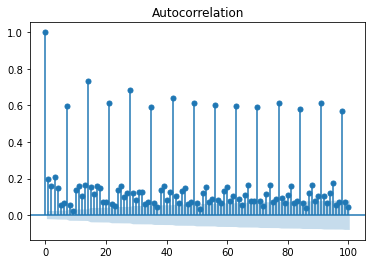

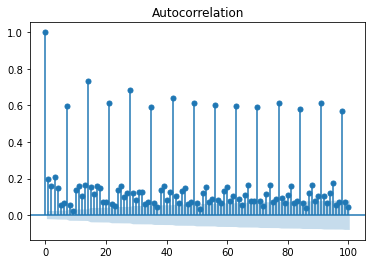

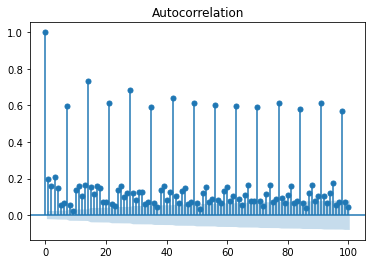

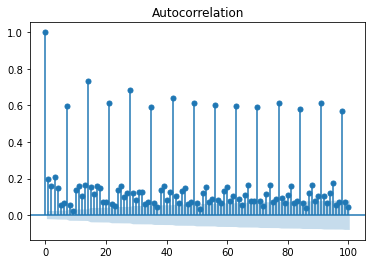

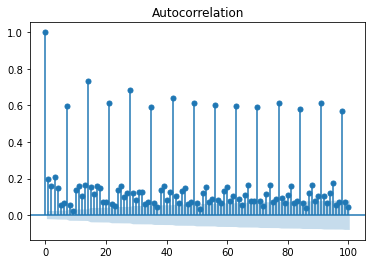

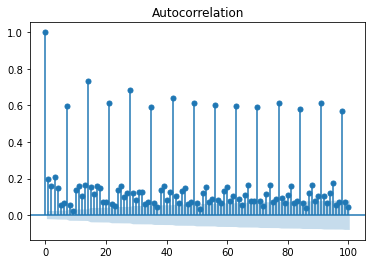

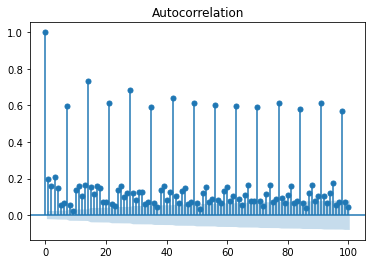

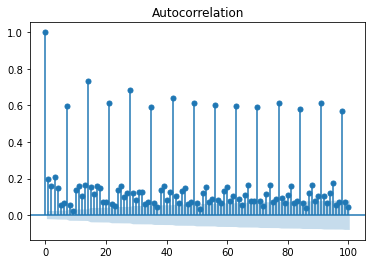

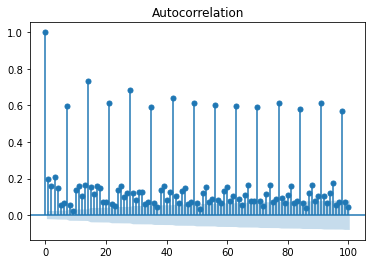

In [40]:
from statsmodels.graphics.tsaplots import plot_acf

for store_id in store_ids:#stationary_ids:
    df_store = df[df.Store == store_id];
    
    plt.figure();
    plt.title("ACF Plot for Store " + str(store_id))
    plot_acf(df.Sales, ax=plt.gca(), lags = 100)

## A function to build ARIMAX model

The function has to do the following:
1. Transform the target data using boxcox
2. Check stationarity, if not stationary, get the value of d to make it stationary
3. Use ACF to get the value of p
4. Use PACF to get the value of q
5. Try different models such as:
> a. ARIMA model (p, d, q) </br>
> b. SARIMA model (p, d, q, season) </br>
> c. ARIMAX model (p, d, q) with exog variables  </br>
> d. SARIMAX model (p, d, q, season) with exog variables </br>
> e. VAR model
> f. VARMAX model with exog variables

In [41]:
from scipy.stats import boxcox;
from statsmodels.tsa.stattools import adfuller;

from statsmodels.tsa.stattools import acf, pacf;
from statsmodels.tsa.arima_model import ARIMA;
from statsmodels.tsa.statespace.varmax import VARMAX;
from statsmodels.tsa.statespace.sarimax import SARIMAX;
from sklearn.metrics import mean_squared_error;
from sklearn.preprocessing import MinMaxScaler, StandardScaler;

from pylab import rcParams;
import statsmodels.api as sm;

In [42]:
def transform_target(target, data_index):
    """ This function transforms the given input data target via boxcox transformation."""
    return pd.Series(boxcox(target.add(1e-10), lmbda=0), index=data_index);

In [43]:
def stationarity_get_d(target):
    """ This function checks stationarity of a given target timeseries data. It returns two outputs which are 
        the number of differences to be done in order to make it stationary and the final differenced (or undifferenced)
        target which can now be fed into the time series models. """
    d = 0;
    while True:
        adf_test = adfuller(target);
        adf_stat = adf_test[0];
        p_val = adf_test[1];
        crit_val = adf_test[4]['5%'];
        
        if ((p_val < 0.05) and (adf_stat < crit_val)):
            break;
        else:
            target = target - target.shift(1);
            target.dropna(inplace=True);
            d = d + 1;
            
        if (d > 10):
            print("Unable to make the data stationary");
            d = -1;
    
    return d, target;

##### ACF and PACF curves

In [44]:
def get_p_acf(target, num_lags = 10):
    lag_acf = acf(target, nlags=num_lags);
    plt.plot(lag_acf);
    plt.show()
    
    p = -1;
    for i in range(len(lag_acf) - 1):
        if (lag_acf[i] * lag_acf[i+1] < 0):
            p = i+1;
            break;
    return p;

def get_q_pacf(target, num_lags = 10):
    lag_acf = pacf(target, nlags=num_lags);
    plt.plot(lag_acf);
    plt.show()
    
    q = -1;
    for i in range(len(lag_acf) - 1):
        if (lag_acf[i] * lag_acf[i+1] < 0):
            q = i+1;
            break;
    return q;

#### Function to remove outliers

In [45]:
def remove_outliers(data, cols, pctl = 0.99):
    """A function to remove outliers from given data. By default, values >99%ile values are removed. """
    thrs = data[cols].quantile(pctl);
    for col in cols:
        thr = thrs[col]
        data = data[data[col] <= thr]
    
    return data;

In [46]:
def missing_value_imputation(data):
    """ This function imputes the data for missing entries. For the current problem, instead of interpolation, we 
    assume that the stores are closed on those days where we have missing data. """
    period = pd.date_range(data.Date.min(), data.Date.max());
    data = data.set_index("Date");
    
    data = data.reindex(period);
    data.reset_index(inplace=True)
    
    data["Date"] = data["index"];
    #data.drop(["index"], axis=1, inplace=True);
    
    display(df.columns)
    
    store_id = data.Store.unique()[0];
    data.Store.fillna(store_id, inplace=True);
    
    data.StateHoliday.fillna(1, inplace=True);
    data.SchoolHoliday.fillna(1, inplace=True);
    data.DayOfWeek = data.Date.apply(lambda x : x.dayofweek + 1)
    
    data.fillna(0, inplace=True);
    data.set_index("Date", inplace=True);
    
    # Decided to not interpolate, better to assume the store is closed. 
    #data["Sales"] = data.groupby("DayOfWeek").Sales.apply(lambda x : x.interpolate());
    #data["Customers"] = data.groupby("DayOfWeek").Customers.apply(lambda x : x.interpolate());
    
    return data;

#### Scaling data using MinMaxScaler

In [47]:
def scale_data(data, cols):
    scaler = MinMaxScaler();
    #scaler = StandardScaler();
    data[cols] = scaler.fit_transform(data[cols])
    
    return data;

#### Function to plot the timeseries data of stores and its seasonal decomposition

In [48]:
def plot_timeseries(data, cols):
    N = len(cols);
    plt.subplots(1, N, figsize=(N*7, 5));
    
    for i in range(N):
        col = cols[i];
        plt.subplot(1 , N, i+1);
        plt.title("Store " + str(data.Store.unique()[0]) +  " : " + col)
        data[col].plot.line();
    
    plt.show();
    
    decomposition = sm.tsa.seasonal_decompose(data.Sales, model='additive') # additive seasonal index
    
    rcParams['figure.figsize'] = 12, 5
    decomposition.plot()
    plt.show()

#### Single Function to preprocess the data

In [49]:
def preprocess(data):    
    # remove outliers
    data = remove_outliers(data, ["Sales", "Customers"], pctl=0.99);
    
    # missing value imputation
    data = missing_value_imputation(data);
    
    # plot data as time series
    plot_timeseries(data, ["Sales", "Customers"])
    
    # scaling
    data = scale_data(data, ["Sales", "Customers"]);
    
    return data

#### Function to get predictions from a given model

In [50]:
def get_predictions(model_type, y, p, q, d, bias, exog_var=pd.DataFrame(), y2=None):
    if (len(exog_var) == 0):
        exog_var = None;
    
    if (model_type == "ARIMA" or model_type == "ARMA" or model_type == "ARIMAX"):
        model = ARIMA(y, order=(p, d, q), exog=exog_var) 
    elif (model_type == "SARIMA" or model_type == "SARIMAX"):
        model = SARIMAX(y, order=(p, d, q), seasonal_order=(p, d, q, 7), exog=exog_var, enforce_invertibility=False)
    elif (model_type == "VAR" or model_type == "VARMAX"):
        temp = pd.DataFrame();
        temp["Sales"] = y;
        temp["Customers"] = y2;
        model = VARMAX(temp, order = (p, d, q), exog = exog_var);
        
    model_fit = model.fit();
    pred = model_fit.predict();
    
    if (model_type == "VAR" or model_type == "VARMAX"):
        pred = pred.Sales;
    
    return pred;

#### Function to plot predictions from the time series models

In [51]:
def plot_predictions(y, pred, test_min_index):
    plt.figure();
    y.plot(color='black');
    pred[test_min_index:].plot(color='red');
    plt.legend(['Actual', 'Forecasted']);
    plt.title("Forecasting over time")
    plt.show();
    
    plt.figure();
    y[test_min_index:].plot(color='black');
    pred[test_min_index:].plot(color='red');
    plt.legend(['Actual', 'Forecasted']);
    plt.title("Forecasting over time (Zoomed to test set)")
    plt.show();

#### Function to plot the residues (errors) in prediction

In [52]:
def plot_residues(y, pred, test_min_index):
    plt.figure();
    plt.title("Prediction residues");
    errors = y[test_min_index:].subtract(pred)
    plt.plot(errors);
    plt.show()

#### Function to get error stats such as RMSE and MAPE

For MAPE, we use the mean value of the target to get the % error for entries with actuals = 0s.

In [53]:
def get_errors(y, pred, test_min_index):   
    err_calc = pd.DataFrame();
    err_calc["y"] = y;
    err_calc["pred"] = pred;
    
    avg_val = err_calc.y.mean();
    err_calc["rel_err"] = err_calc.apply(lambda x : abs((x.y - x.pred)/x.y) if x.y !=0 else abs(x.pred)/avg_val, axis=1);
    
    display(err_calc[test_min_index:].sort_values(by="rel_err", ascending=False).head(10))
    
    mape = err_calc.rel_err[test_min_index:].mean() * 100;
    rmse = np.sqrt(mean_squared_error(y[test_min_index:], pred[test_min_index:])).round(2)
    #mape = np.round(np.mean(np.abs(y[test_min_index:]-pred[test_min_index:])/(y[test_min_index:]))*100,2)
    
    return rmse, mape

#### Utility function to store results in a dataframe

In [54]:
def addResultsToEvalTable(results_eval, modelName, rmse, mape):
    data = {"ModelName":modelName, "RMSE":rmse, "MAPE":mape};
    return results_eval.append(data, ignore_index=True)

#### A single function to perform all operations
1. Preprocessing
2. Stationarity check and making data stationary
3. Choosing p and q using ACF and PACF
4. Run models (ARIMA, SARIMA, ARIMAX, SARIMAX, VAR and VARMAX)
5. Make predictions and compute error stats
6. Store the error stats in dataframe

In [55]:
def eval_model(model_type, y, y_t, p, q, d, test_min_index, bias = 0, exog_var = pd.DataFrame(), y2=None):
    y_hat = get_predictions(model_type, y_t, p, q, d, bias, exog_var = exog_var, y2=y2);
    
    plot_predictions(y, y_hat, test_min_index);
    plot_residues(y, y_hat, test_min_index);
    
    rmse, mape = get_errors(y, y_hat, test_min_index);
    return rmse, mape;

#### A function that runs all the model

In [56]:
def forecast_tsa(data, target_col, test_size, exog_var=pd.DataFrame()): 
    data = preprocess(data);
    
    y = data[target_col]
    
    df_train = data[:len(data)-test_size];
    df_test = data[len(data)-test_size:];
    
    y_t = y;#transform_target(y, df.index);
    d, y_t_diff = stationarity_get_d(y_t);
    
    p = get_p_acf(y_t_diff);
    q = get_q_pacf(y_t_diff);
        
    results_eval = pd.DataFrame(columns=["ModelName", "RMSE", "MAPE"]);
    
    if (len(exog_var) == 0):
        print("Attempt ARIMA model")
        rmse, mape = eval_model('ARIMA', y, y_t, p, q, d, df_test.index.min(), bias = y_t[0]);
        results_eval = addResultsToEvalTable(results_eval, "ARIMA", rmse, mape);
    
        print("Attempt SARIMA model")
        rmse, mape = eval_model('SARIMA', y, y_t, p, q, d, df_test.index.min());
        results_eval = addResultsToEvalTable(results_eval, "SARIMA", rmse, mape);
        
        print("Attempt VAR model")
        rmse, mape = eval_model('VAR', y, y_t, p, q, d, df_test.index.min(), y2 = data["Customers"]);
        results_eval = addResultsToEvalTable(results_eval, "VAR", rmse, mape);
        
    else:
        print("Attempt ARIMAX model")
        rmse, mape = eval_model('ARIMAX', y, y_t, p, q, d, df_test.index.min(), bias = y_t[0],
                                exog_var = data[exog_var]);
        results_eval = addResultsToEvalTable(results_eval, "ARIMAX", rmse, mape);
    
        print("Attempt SARIMAX model")
        rmse, mape = eval_model('SARIMAX', y, y_t, p, q, d, df_test.index.min(),
                                exog_var = data[exog_var]);
        results_eval = addResultsToEvalTable(results_eval, "SARIMAX", rmse, mape);
        
        print("Attempt VARMAX model")
        exog_var.remove("Customers");
        rmse, mape = eval_model('VARMAX', y, y_t, p, q, d, df_test.index.min(), 
                                exog_var = data[exog_var], y2 = data["Customers"]);
        results_eval = addResultsToEvalTable(results_eval, "VARMAX", rmse, mape);
        
    return results_eval;

#### Compare various models

--------------------------------------------  1 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

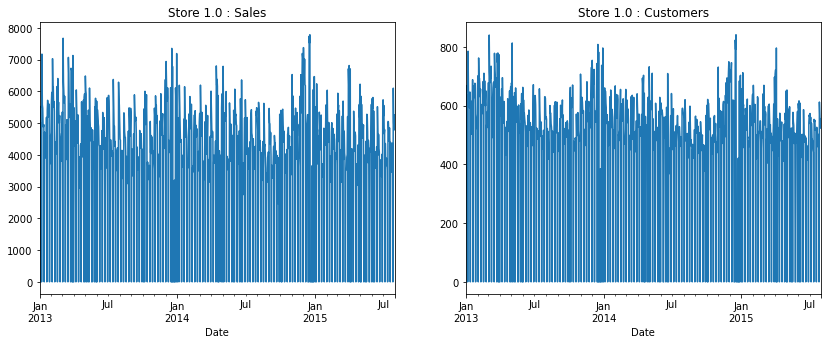

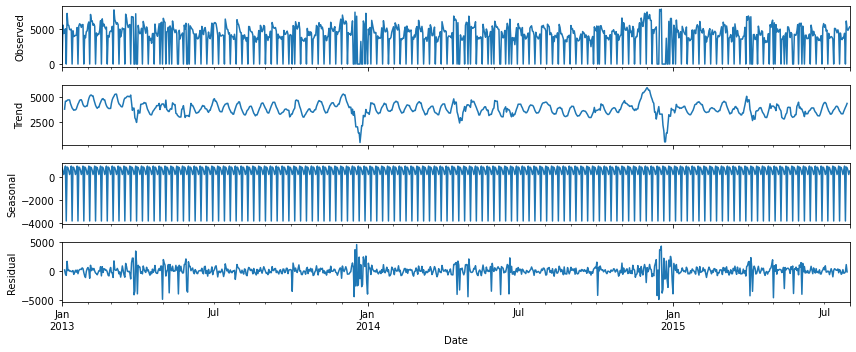

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


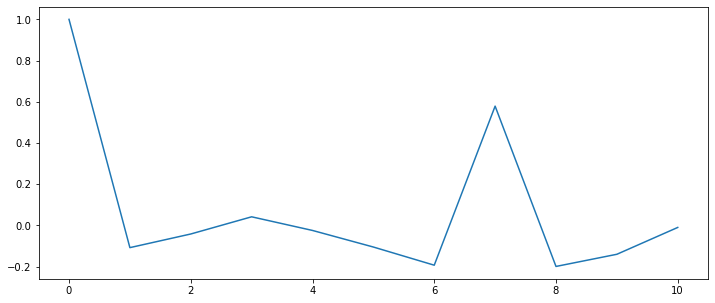

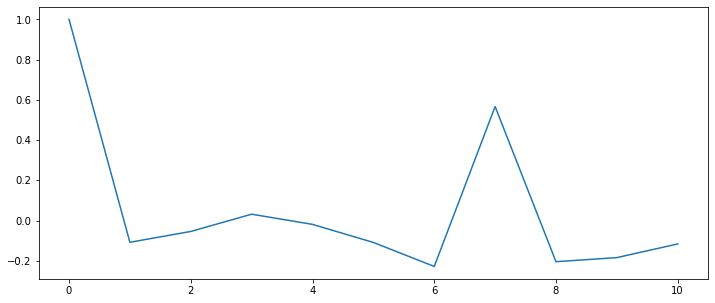

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


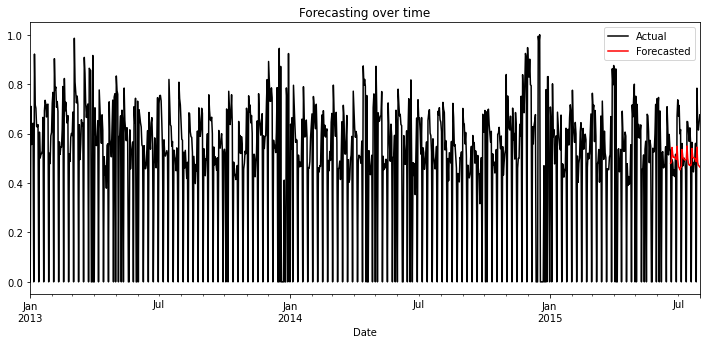

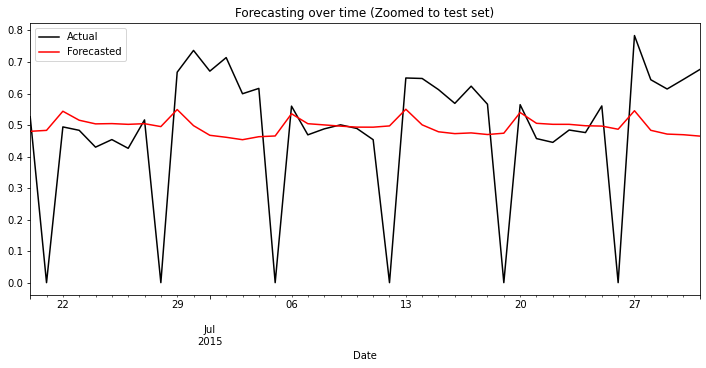

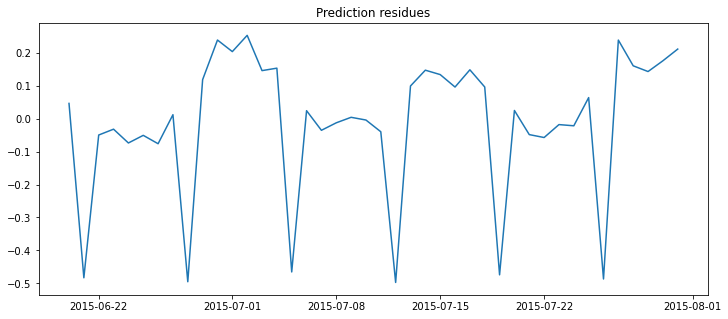

,y,pred,rel_err
Date,,,
2015-07-12,0.000000,0.497161,1.009656
2015-06-28,0.000000,0.495036,1.005341
2015-07-26,0.000000,0.486627,0.988263
2015-06-21,0.000000,0.483050,0.981000
2015-07-19,0.000000,0.474044,0.962710
2015-07-05,0.000000,0.465277,0.944904
2015-07-02,0.713937,0.461110,0.354130
2015-06-30,0.736673,0.498043,0.323929
2015-07-31,0.676044,0.464862,0.312379


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


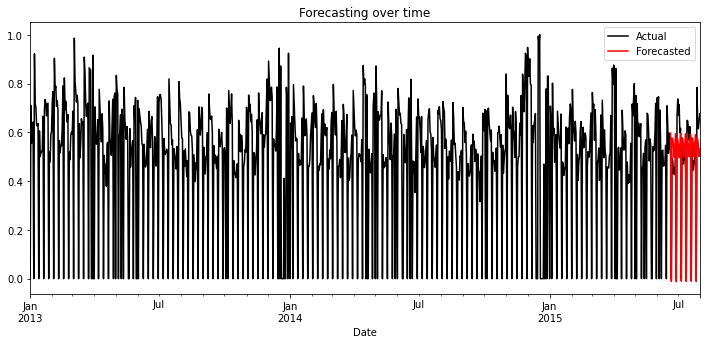

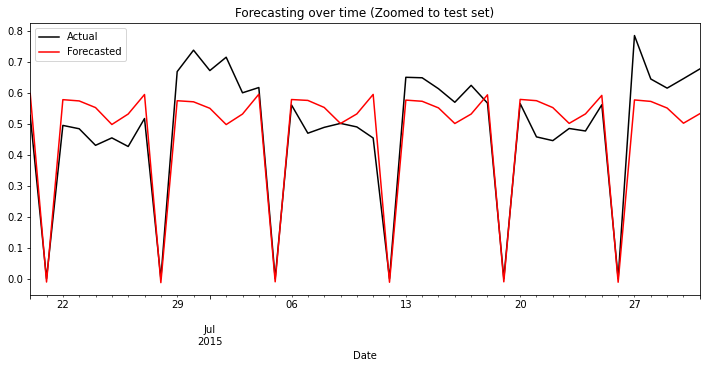

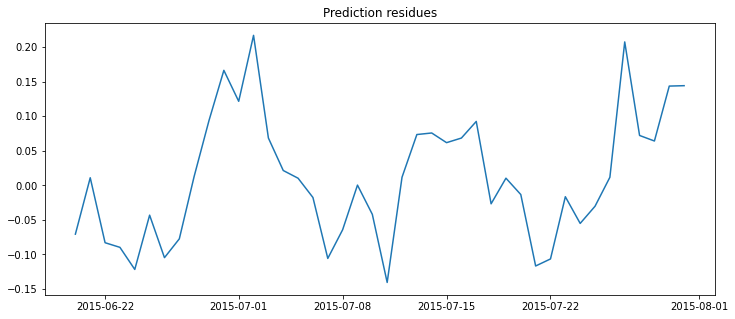

,y,pred,rel_err
Date,,,
2015-07-11,0.453436,0.593997,0.309990
2015-07-02,0.713937,0.496775,0.304175
2015-06-24,0.429801,0.551529,0.283219
2015-07-27,0.783815,0.576167,0.264919
2015-07-21,0.457033,0.573767,0.255417
2015-06-26,0.426076,0.530754,0.245679
2015-07-22,0.444958,0.551488,0.239415
2015-06-30,0.736673,0.570158,0.226037
2015-07-07,0.468850,0.574643,0.225643


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


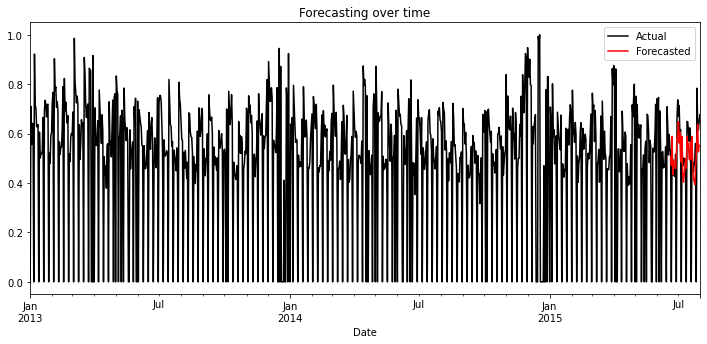

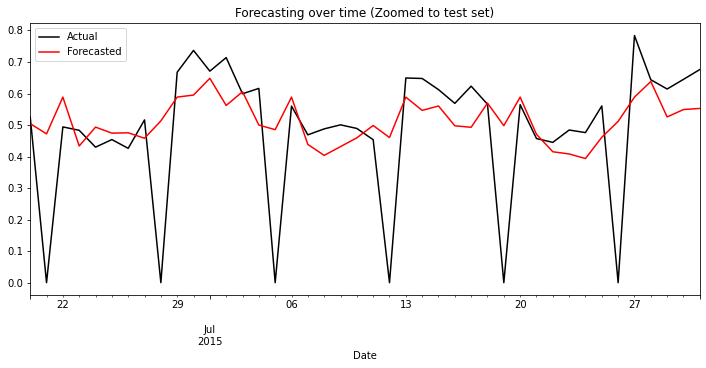

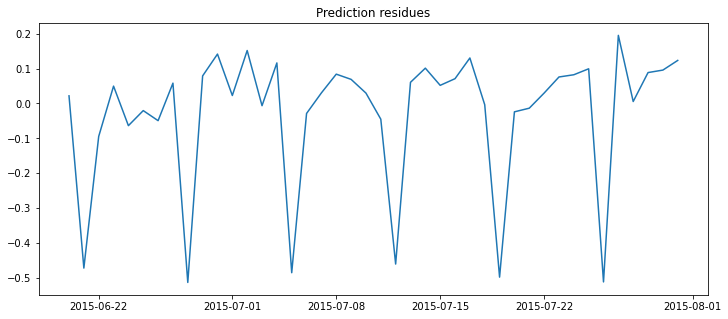

,y,pred,rel_err
Date,,,
2015-06-28,0.000000,0.513124,1.042074
2015-07-26,0.000000,0.511600,1.038980
2015-07-19,0.000000,0.497895,1.011147
2015-07-05,0.000000,0.485226,0.985419
2015-06-21,0.000000,0.471953,0.958464
2015-07-12,0.000000,0.460373,0.934945
2015-07-27,0.783815,0.588545,0.249128
2015-07-02,0.713937,0.562142,0.212616
2015-07-17,0.623250,0.492846,0.209232


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

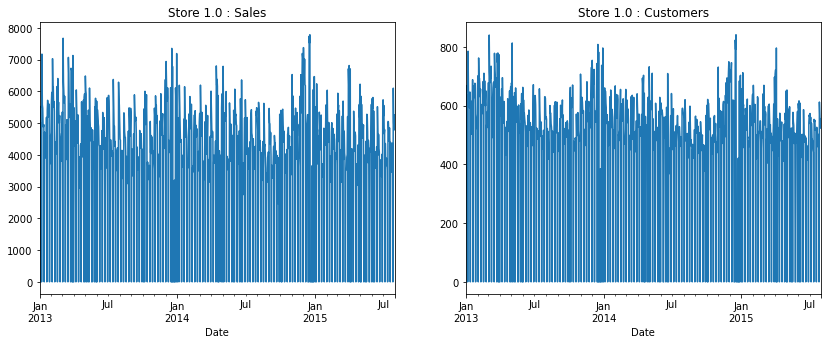

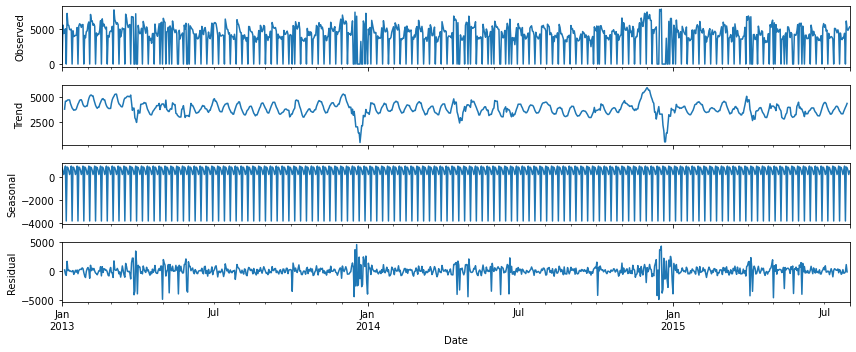

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


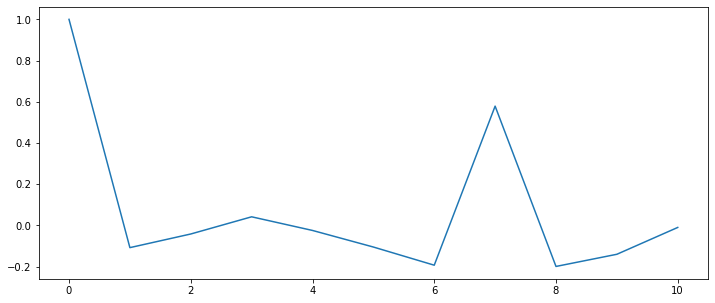

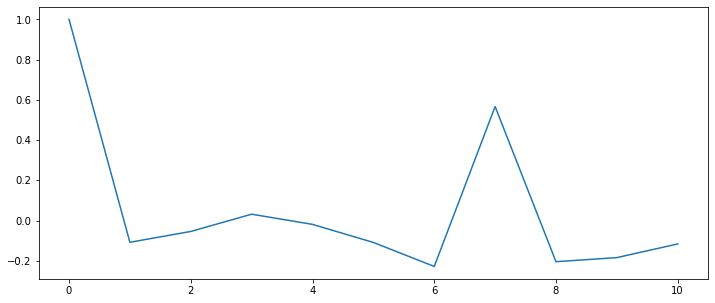

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


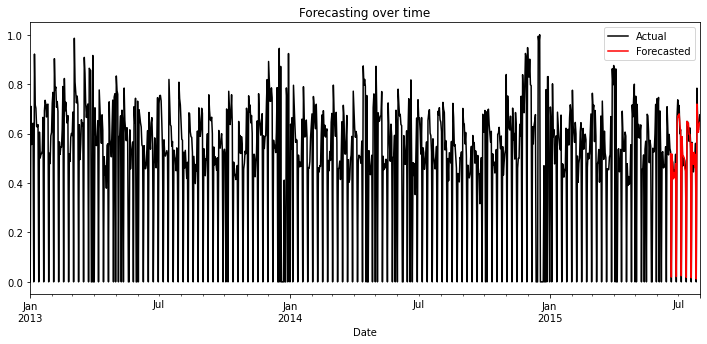

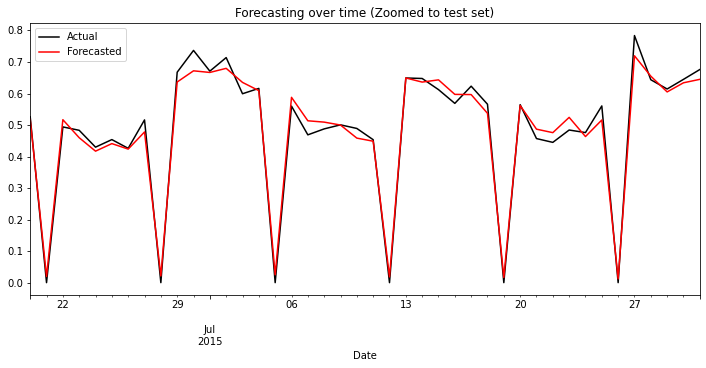

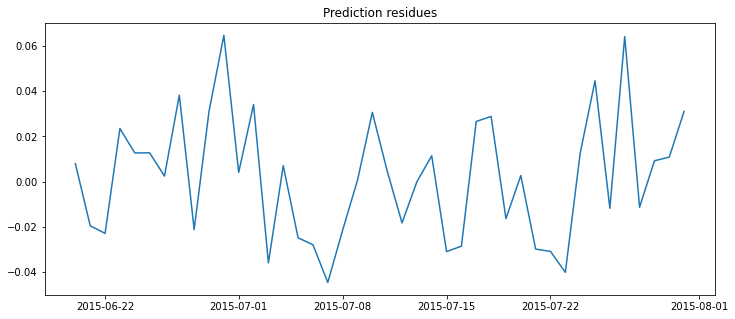

,y,pred,rel_err
Date,,,
2015-07-07,0.468850,0.513454,0.095135
2015-06-30,0.736673,0.671924,0.087895
2015-07-23,0.484136,0.524254,0.082864
2015-07-27,0.783815,0.719582,0.081949
2015-07-25,0.560565,0.515935,0.079617
2015-06-27,0.516249,0.477963,0.074161
2015-07-22,0.444958,0.475833,0.069387
2015-07-21,0.457033,0.486870,0.065285
2015-07-10,0.489146,0.458486,0.062681


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


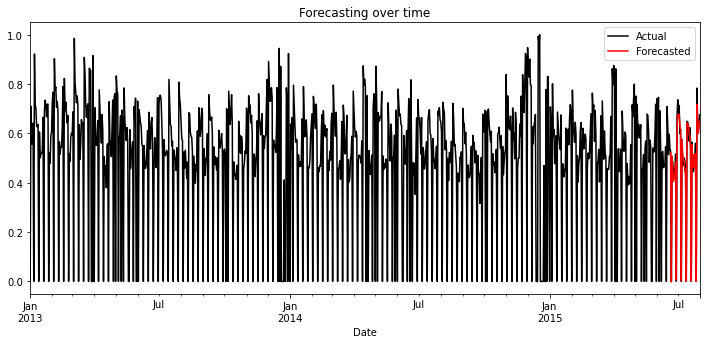

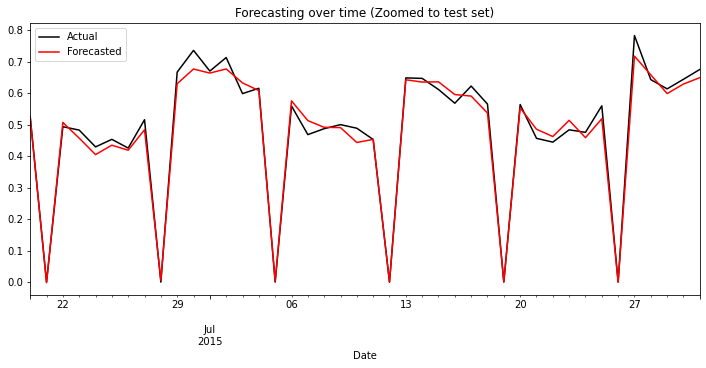

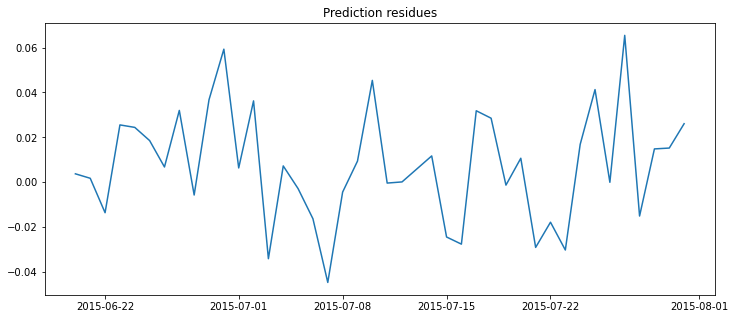

,y,pred,rel_err
Date,,,
2015-07-07,0.468850,0.513467,0.095162
2015-07-10,0.489146,0.443760,0.092787
2015-07-27,0.783815,0.718372,0.083493
2015-06-30,0.736673,0.677387,0.080478
2015-07-25,0.560565,0.519284,0.073643
2015-07-21,0.457033,0.486043,0.063475
2015-07-23,0.484136,0.514304,0.062313
2015-06-27,0.516249,0.484241,0.062001
2015-06-24,0.429801,0.405351,0.056887


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


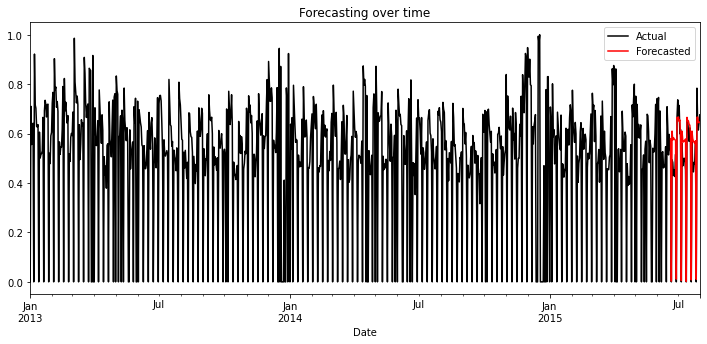

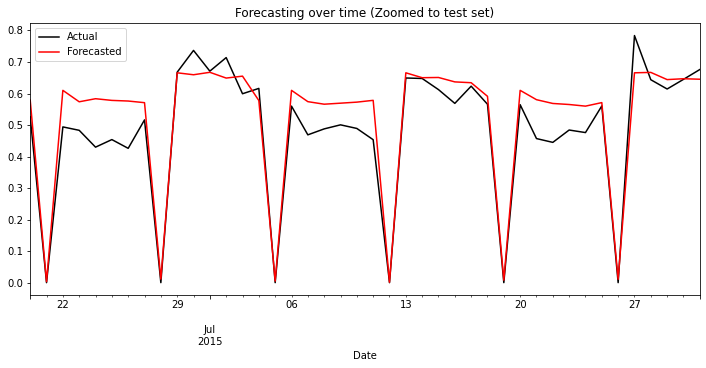

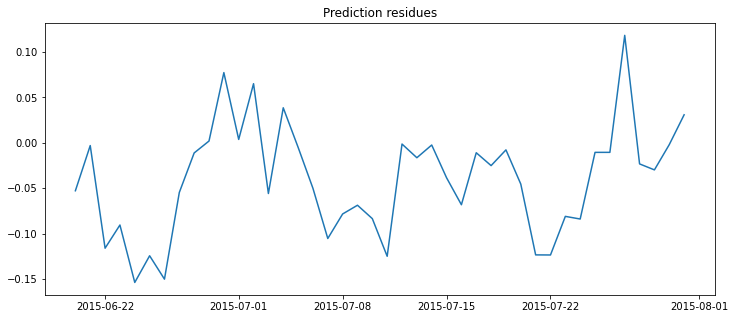

,y,pred,rel_err
Date,,,
2015-06-24,0.429801,0.583456,0.357503
2015-06-26,0.426076,0.576109,0.352127
2015-07-22,0.444958,0.568397,0.277417
2015-07-11,0.453436,0.578302,0.275377
2015-06-25,0.453821,0.578127,0.273907
2015-07-21,0.457033,0.580371,0.269868
2015-06-22,0.494027,0.610016,0.234783
2015-07-07,0.468850,0.574152,0.224595
2015-06-23,0.483237,0.573714,0.187232


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1


--------------------------------------------  3 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

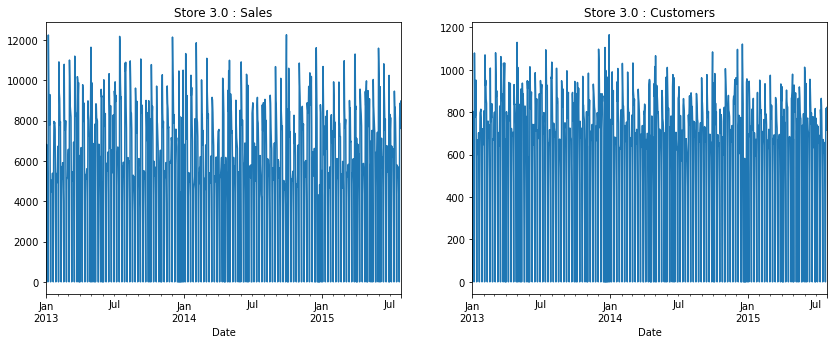

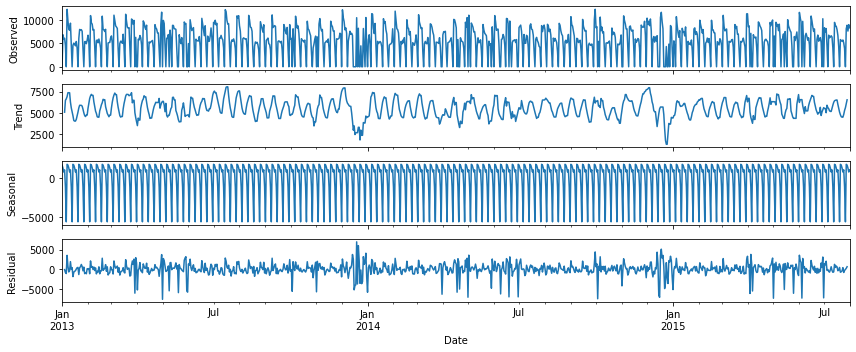

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


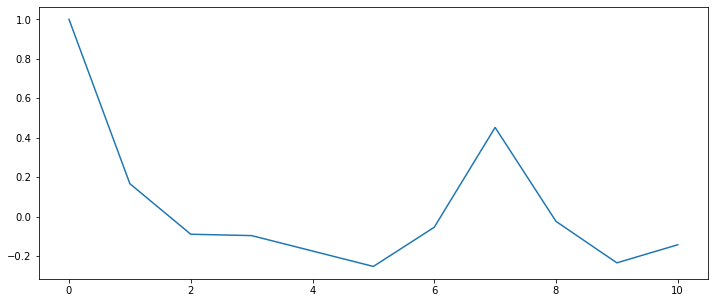

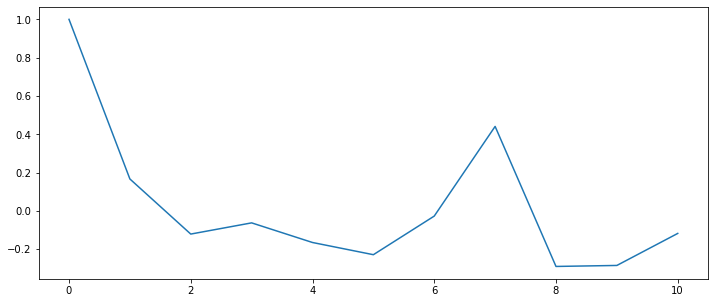

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


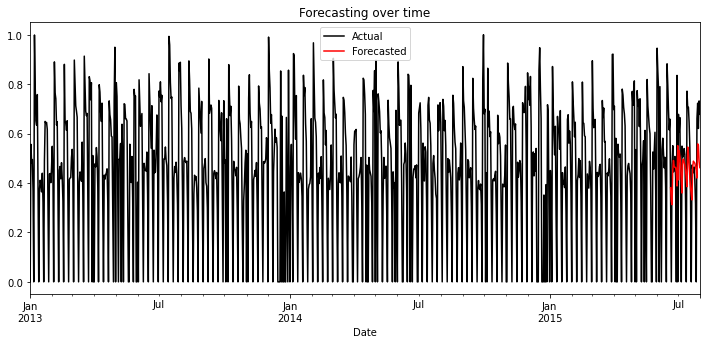

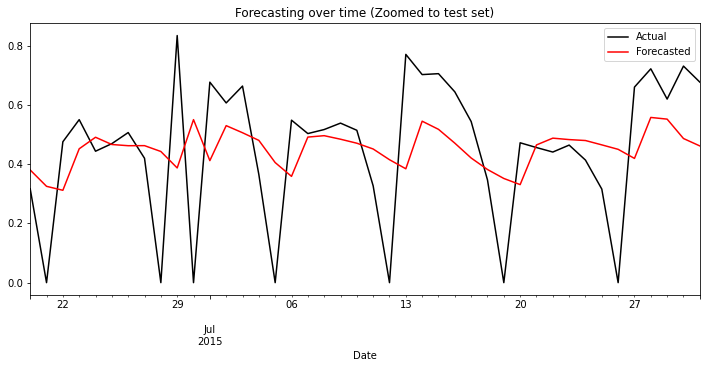

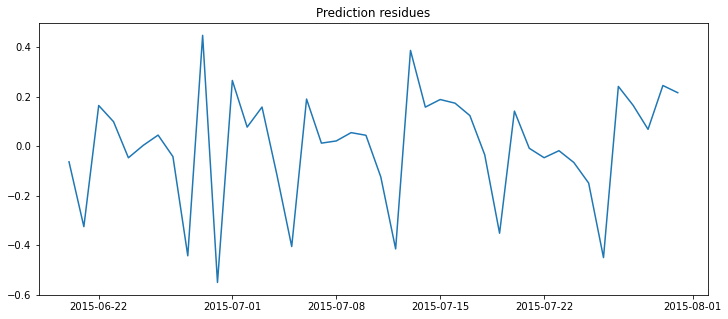

,y,pred,rel_err
Date,,,
2015-06-30,0.000000,0.551202,1.216008
2015-07-26,0.000000,0.450807,0.994526
2015-06-28,0.000000,0.443476,0.978353
2015-07-12,0.000000,0.415670,0.917012
2015-07-05,0.000000,0.406010,0.895701
2015-07-19,0.000000,0.352259,0.777119
2015-06-21,0.000000,0.325702,0.718532
2015-06-29,0.835481,0.387844,0.535784
2015-07-13,0.771778,0.384998,0.501154


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


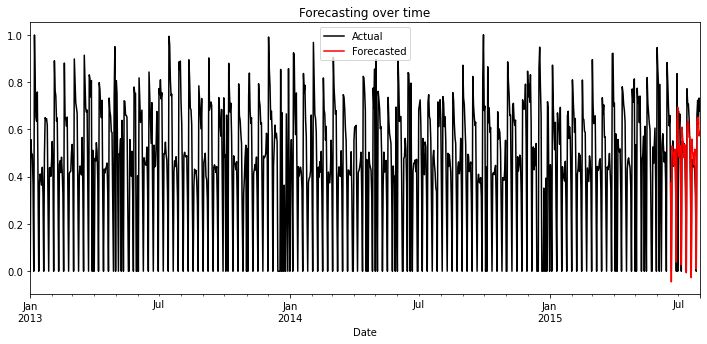

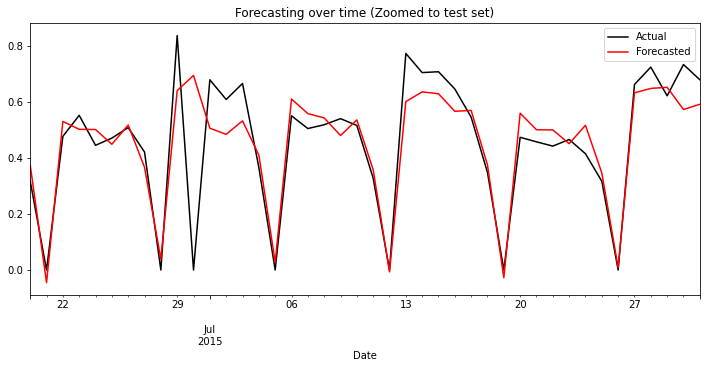

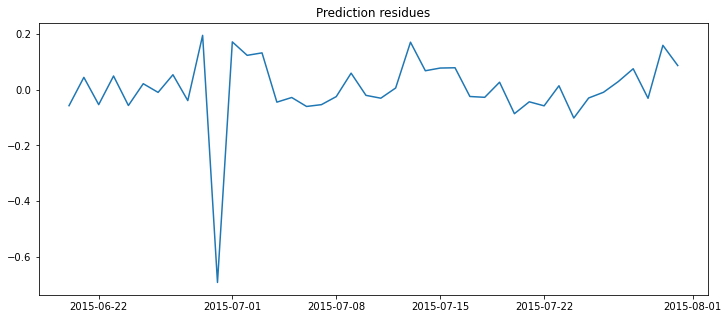

,y,pred,rel_err
Date,,,
2015-06-30,0.000000,0.693359,1.529621
2015-07-01,0.677896,0.505260,0.254664
2015-07-24,0.414356,0.515804,0.244833
2015-06-29,0.835481,0.639316,0.234793
2015-07-13,0.771778,0.600226,0.222282
2015-07-30,0.732219,0.571989,0.218827
2015-07-02,0.607667,0.483457,0.204405
2015-07-03,0.664682,0.531578,0.200252
2015-07-20,0.472920,0.558774,0.181540


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


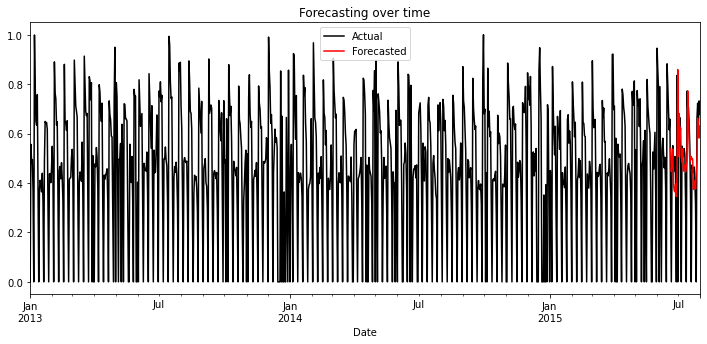

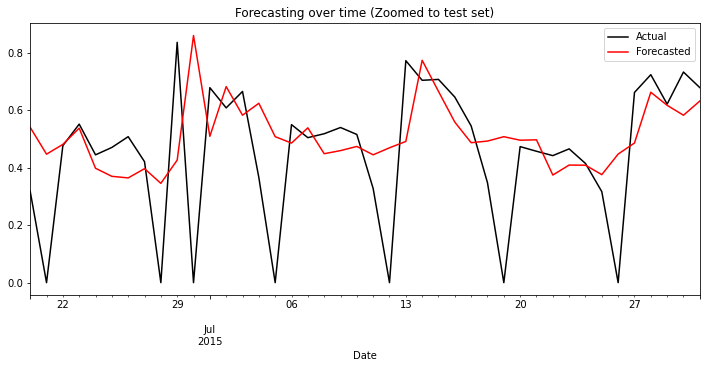

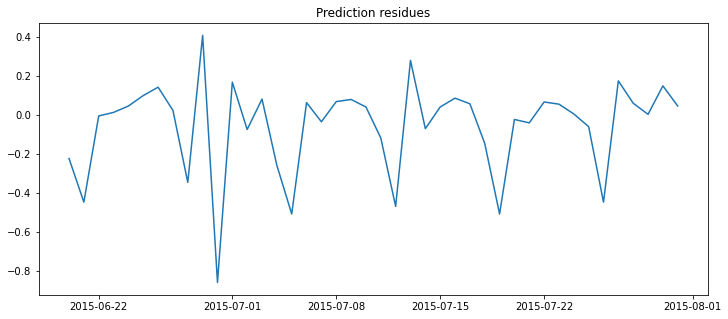

,y,pred,rel_err
Date,,,
2015-06-30,0.000000,0.859065,1.895186
2015-07-05,0.000000,0.507542,1.119689
2015-07-19,0.000000,0.507439,1.119462
2015-07-12,0.000000,0.468853,1.034339
2015-07-26,0.000000,0.446986,0.986096
2015-06-21,0.000000,0.446696,0.985457
2015-06-28,0.000000,0.345273,0.761709
2015-07-04,0.365579,0.623589,0.705757
2015-06-20,0.317374,0.539834,0.700942


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

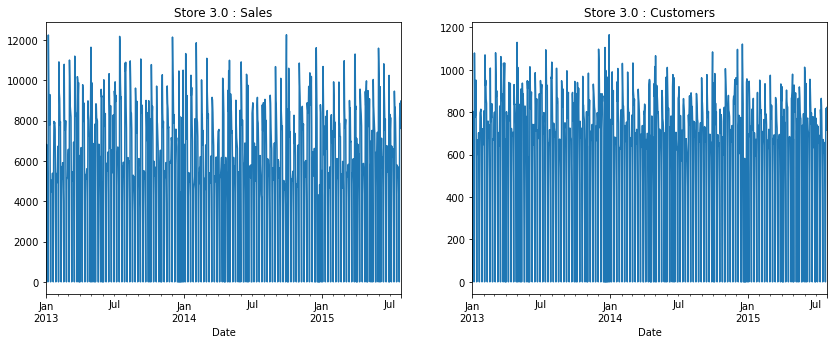

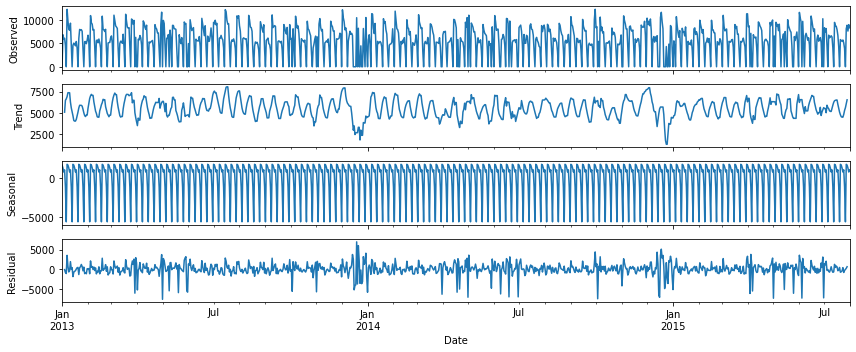

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


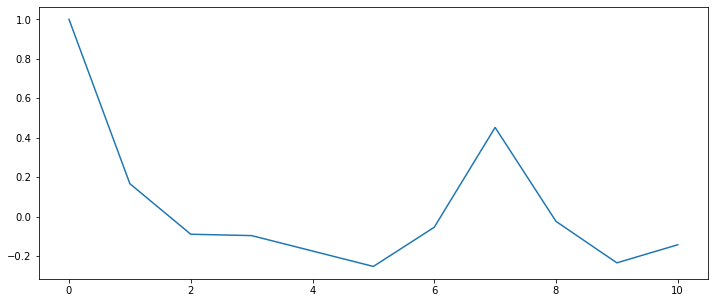

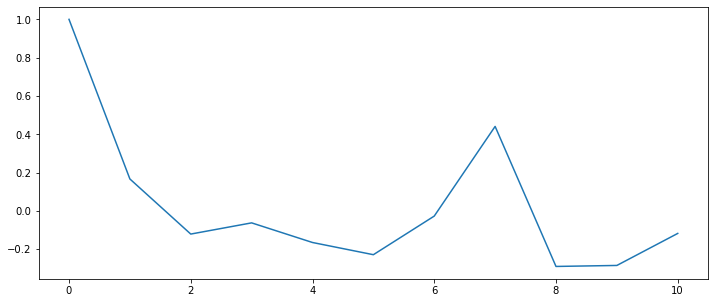

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


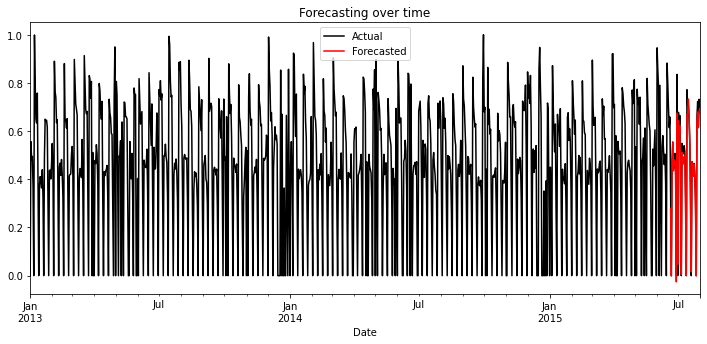

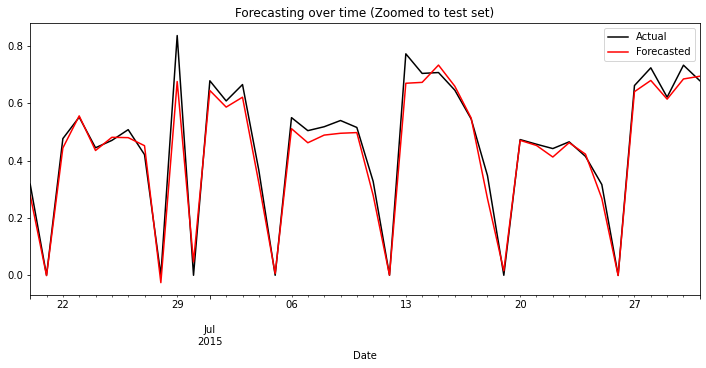

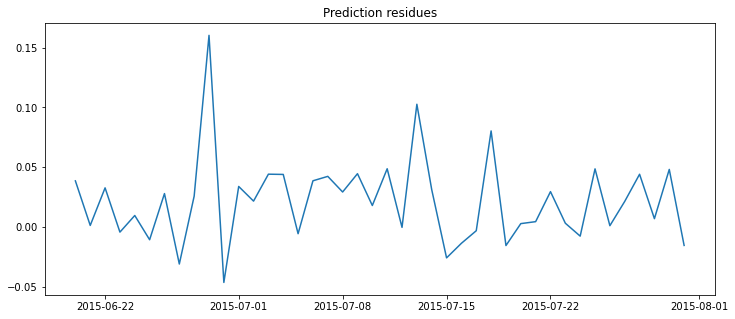

,y,pred,rel_err
Date,,,
2015-07-18,0.347308,0.267072,0.231024
2015-06-29,0.835481,0.675273,0.191756
2015-07-25,0.316313,0.267815,0.153325
2015-07-11,0.327162,0.278564,0.148543
2015-07-13,0.771778,0.669219,0.132886
2015-06-20,0.317374,0.278913,0.121185
2015-07-04,0.365579,0.321734,0.119933
2015-06-30,0.000000,0.046525,0.102639
2015-07-07,0.504078,0.461855,0.083764


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


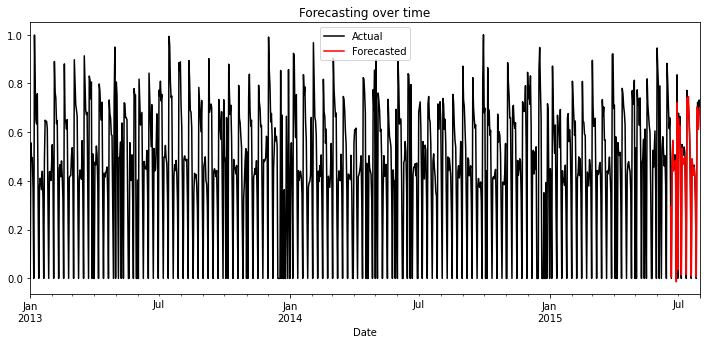

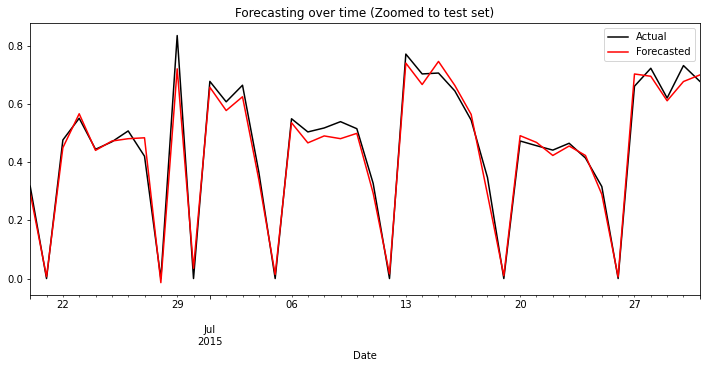

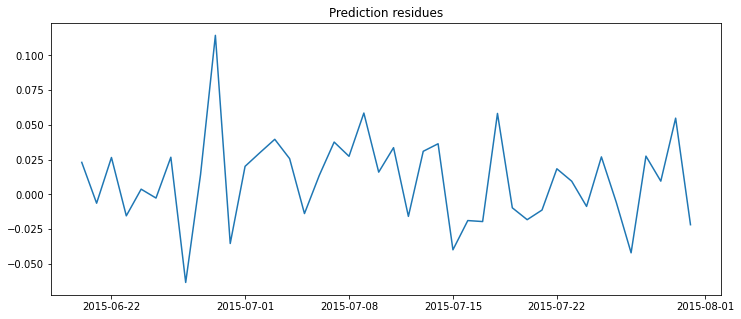

,y,pred,rel_err
Date,,,
2015-07-18,0.347308,0.289101,0.167595
2015-06-27,0.420555,0.483926,0.150685
2015-06-29,0.835481,0.721107,0.136897
2015-07-09,0.539396,0.480910,0.108429
2015-07-11,0.327162,0.293574,0.102664
2015-07-25,0.316313,0.289366,0.085190
2015-06-30,0.000000,0.035344,0.077973
2015-07-30,0.732219,0.677413,0.074848
2015-07-07,0.504078,0.466466,0.074615


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


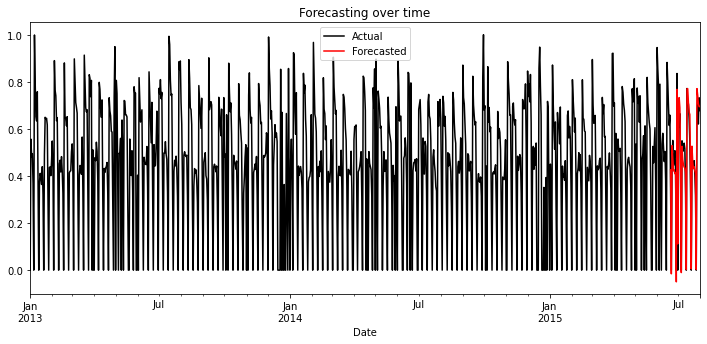

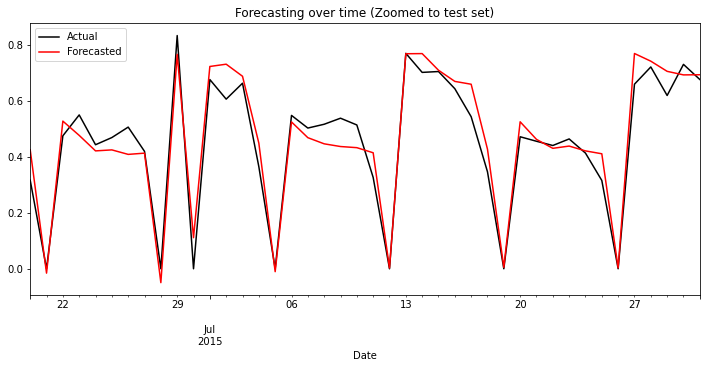

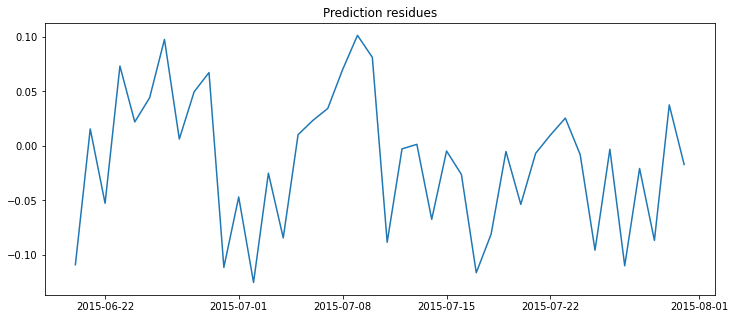

,y,pred,rel_err
Date,,,
2015-06-20,0.317374,0.426304,0.343223
2015-07-25,0.316313,0.411945,0.302332
2015-07-11,0.327162,0.415533,0.270115
2015-06-30,0.000000,0.111373,0.245700
2015-07-18,0.347308,0.428252,0.233061
2015-07-04,0.365579,0.449911,0.230681
2015-07-17,0.544780,0.661081,0.213483
2015-07-02,0.607667,0.732878,0.206052
2015-06-26,0.507504,0.409750,0.192618


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  8 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

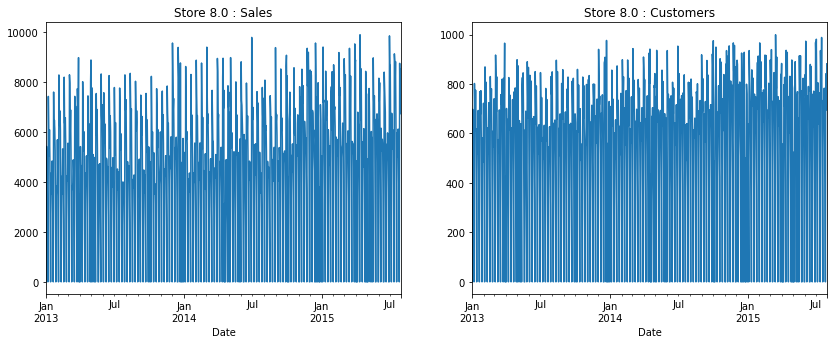

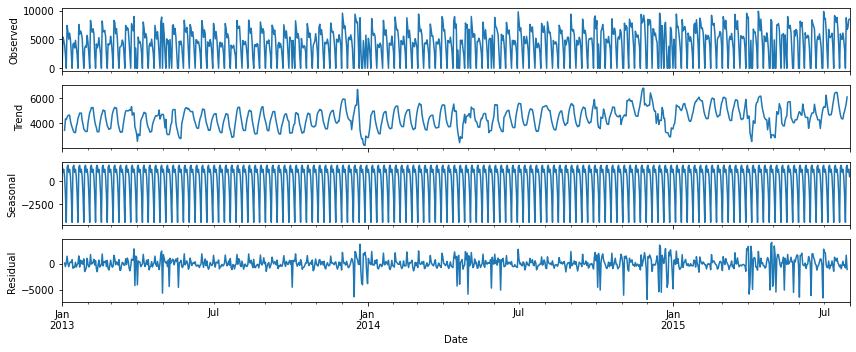

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


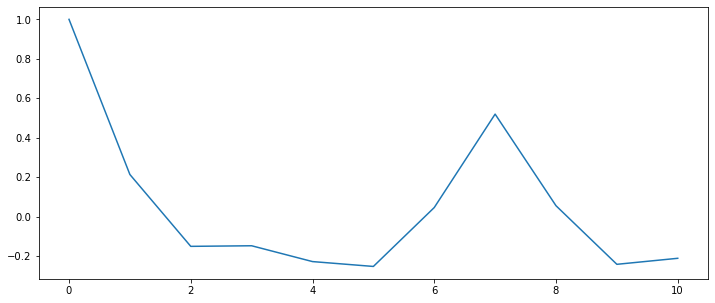

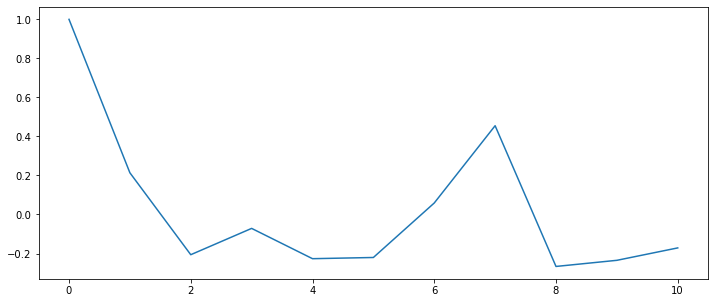

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


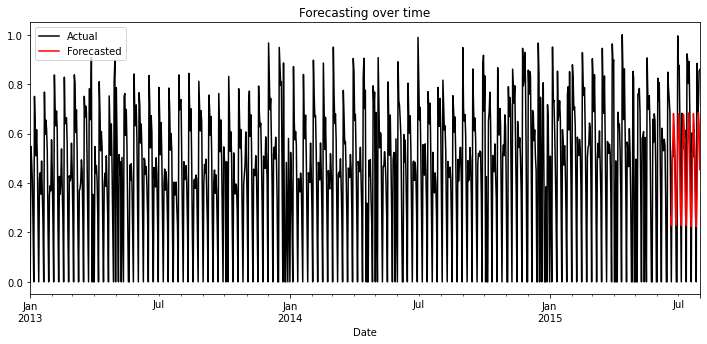

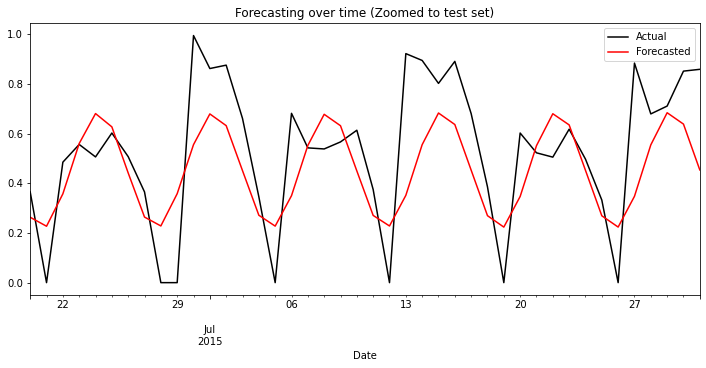

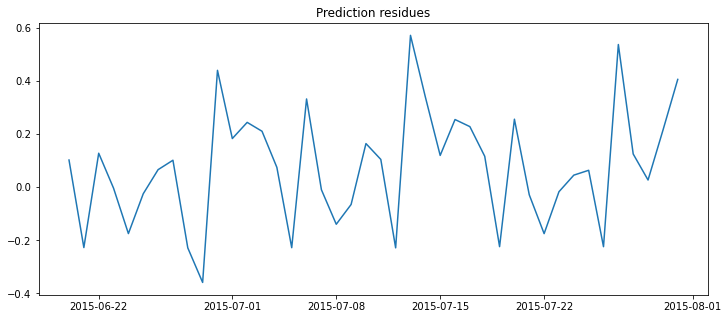

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.358438,0.792568
2015-07-13,0.922680,0.351665,0.618865
2015-07-27,0.884425,0.347863,0.606679
2015-06-28,0.000000,0.228396,0.505023
2015-07-12,0.000000,0.228290,0.504788
2015-07-05,0.000000,0.227721,0.503529
2015-06-21,0.000000,0.227235,0.502455
2015-07-26,0.000000,0.223949,0.495189
2015-07-19,0.000000,0.223804,0.494868


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


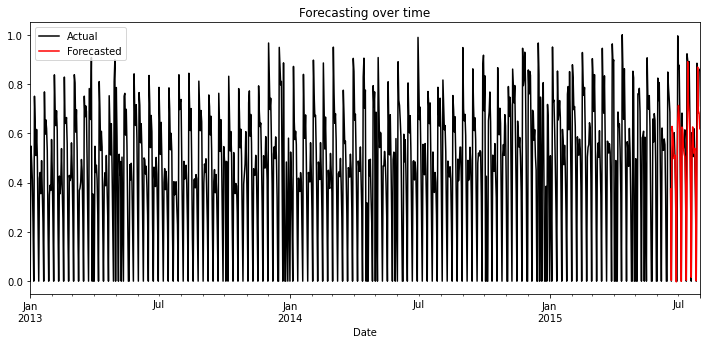

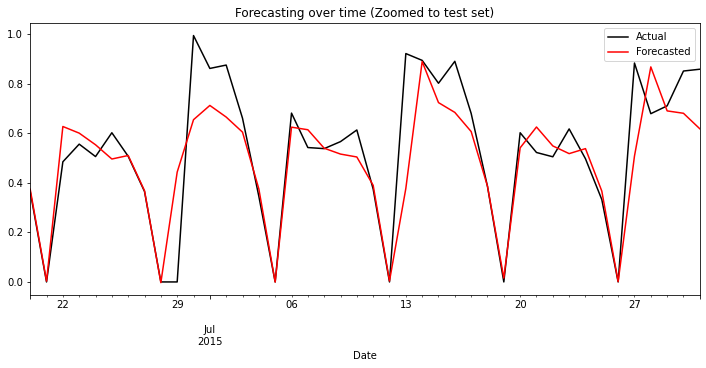

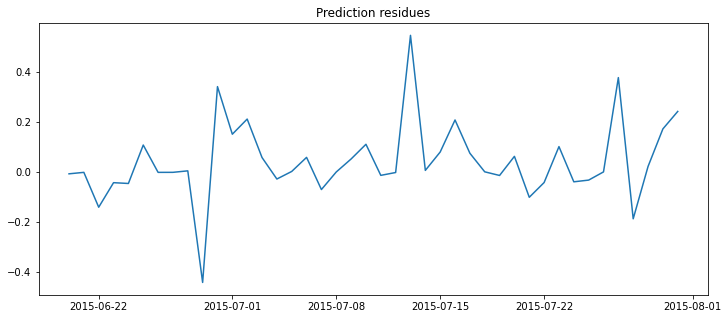

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.443746,0.981197
2015-07-13,0.922680,0.377585,0.590773
2015-07-27,0.884425,0.508432,0.425127
2015-06-30,0.995446,0.655502,0.341499
2015-06-22,0.485376,0.628030,0.293905
2015-07-31,0.859427,0.618792,0.279994
2015-07-28,0.679789,0.868814,0.278064
2015-07-02,0.876227,0.666145,0.239758
2015-07-16,0.891408,0.684970,0.231586


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


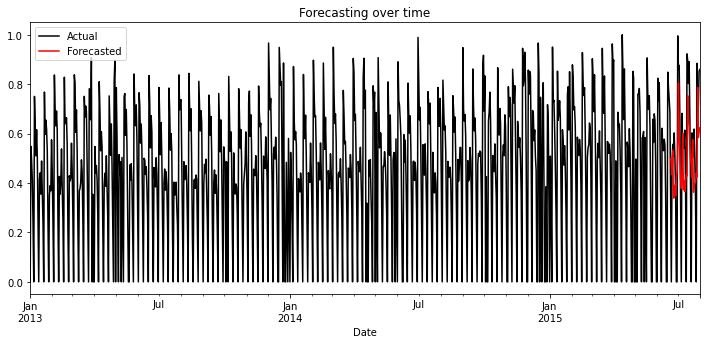

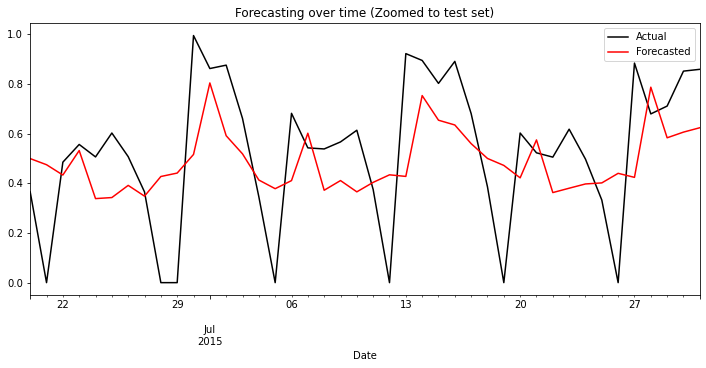

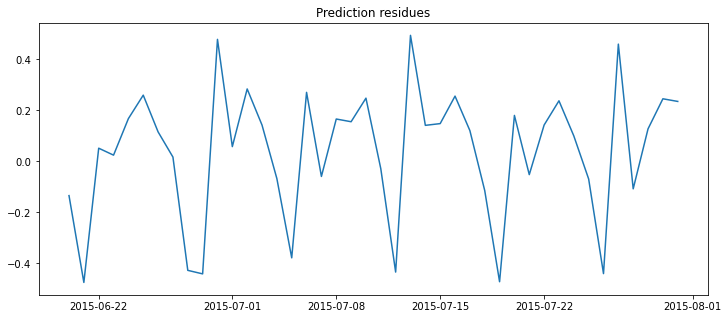

,y,pred,rel_err
Date,,,
2015-06-21,0.000000,0.475079,1.050481
2015-07-19,0.000000,0.472263,1.044254
2015-06-29,0.000000,0.441444,0.976108
2015-07-26,0.000000,0.440400,0.973799
2015-07-12,0.000000,0.434384,0.960498
2015-06-28,0.000000,0.427593,0.945482
2015-07-05,0.000000,0.378520,0.836972
2015-07-13,0.922680,0.427980,0.536156
2015-07-27,0.884425,0.424151,0.520421


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

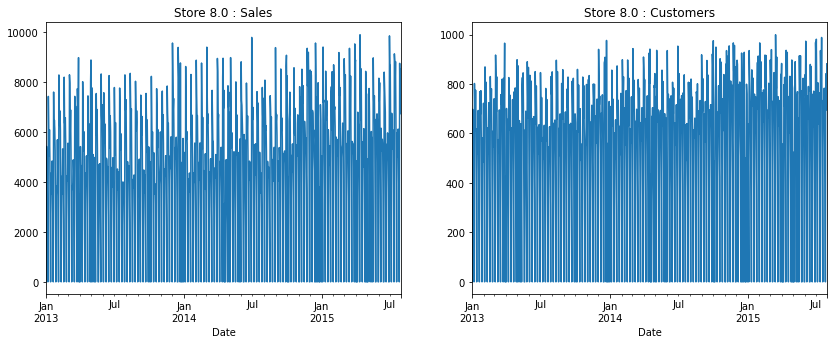

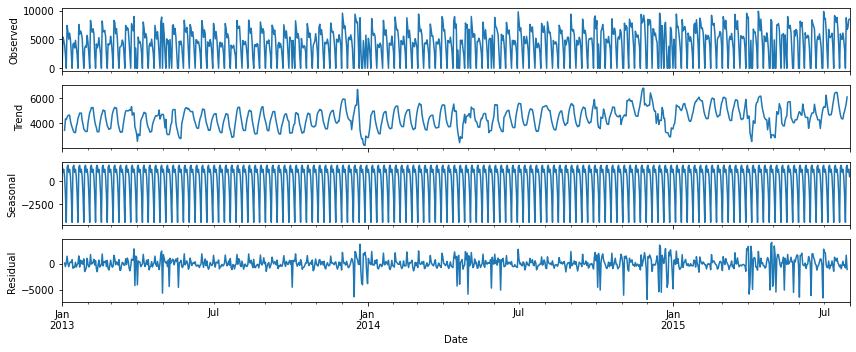

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


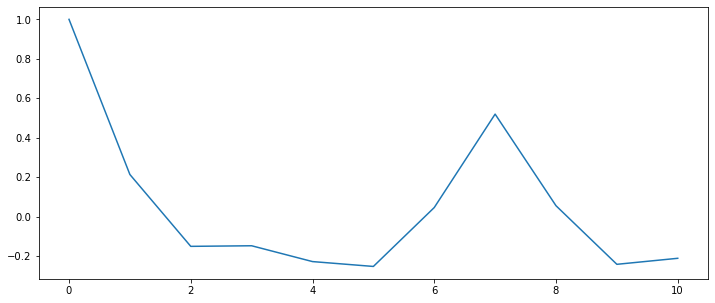

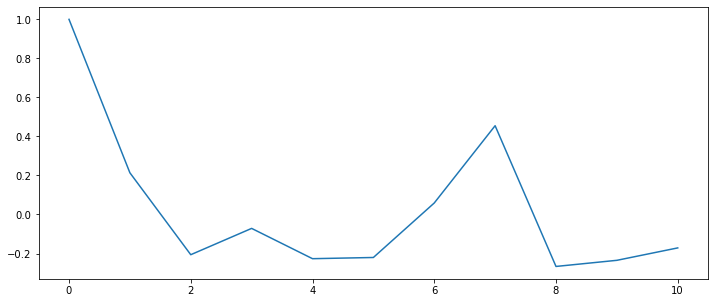

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


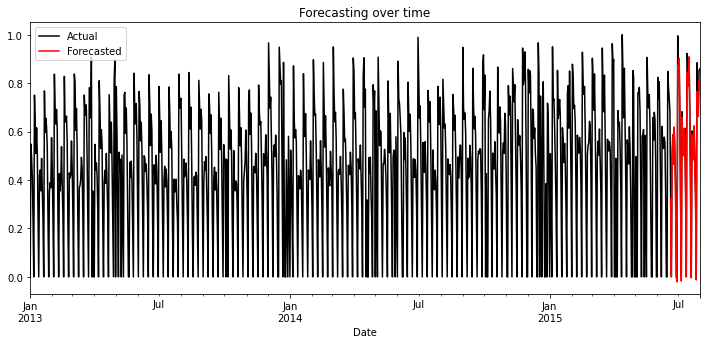

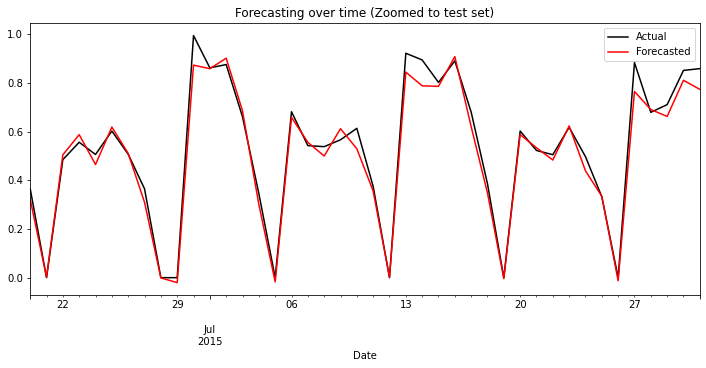

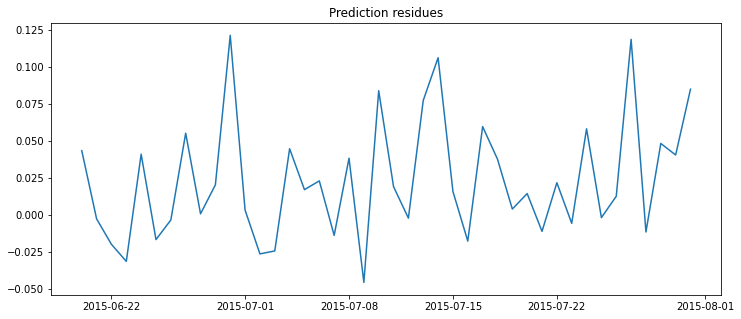

,y,pred,rel_err
Date,,,
2015-06-27,0.365449,0.310073,0.151528
2015-07-10,0.614007,0.529904,0.136974
2015-07-27,0.884425,0.765574,0.134382
2015-07-04,0.345916,0.301023,0.129780
2015-06-30,0.995446,0.873907,0.122095
2015-06-20,0.365449,0.321892,0.119187
2015-07-14,0.895152,0.788734,0.118883
2015-07-24,0.497622,0.439266,0.117269
2015-07-31,0.859427,0.774303,0.099047


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


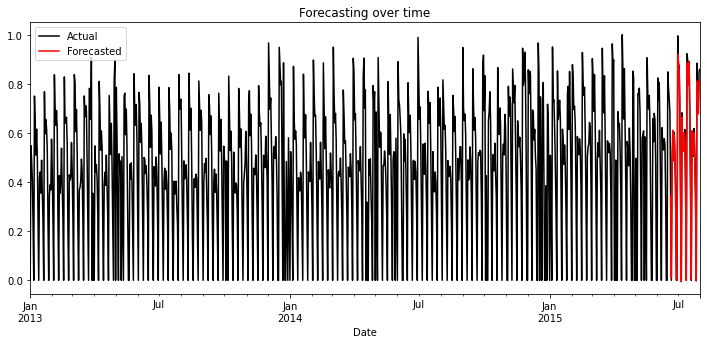

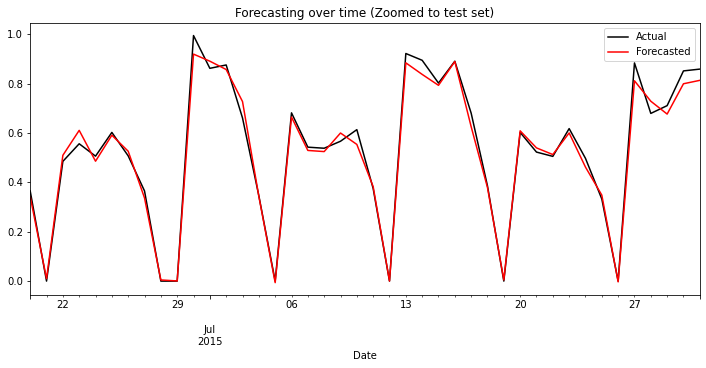

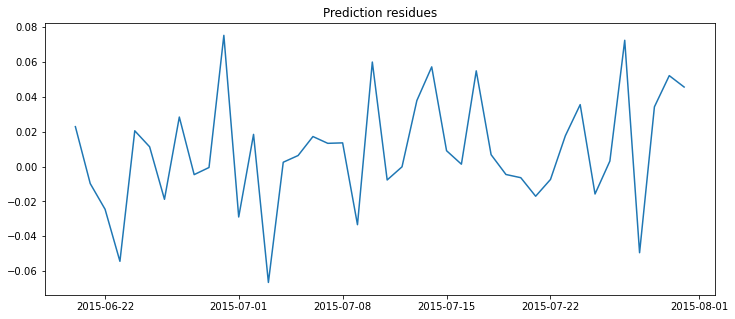

,y,pred,rel_err
Date,,,
2015-07-03,0.661370,0.727881,0.100565
2015-06-23,0.556725,0.611113,0.097692
2015-07-10,0.614007,0.554079,0.097601
2015-07-27,0.884425,0.812007,0.081881
2015-07-17,0.680903,0.626032,0.080585
2015-06-27,0.365449,0.337074,0.077643
2015-06-30,0.995446,0.920206,0.075584
2015-07-28,0.679789,0.729244,0.072750
2015-07-24,0.497622,0.462119,0.071344


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


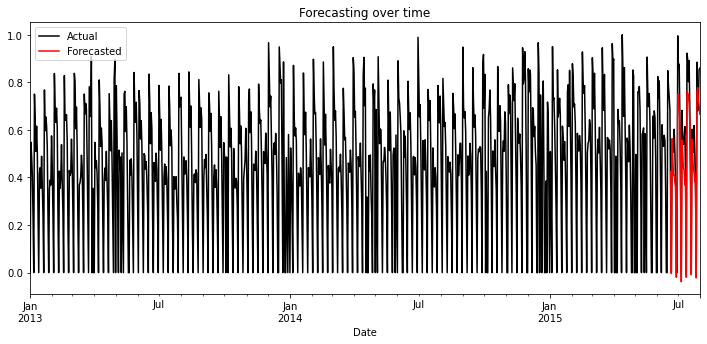

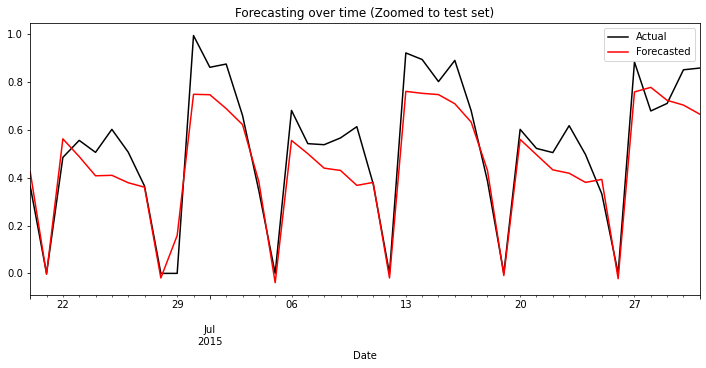

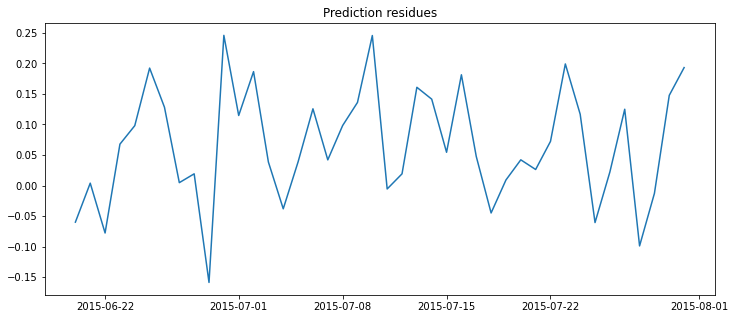

,y,pred,rel_err
Date,,,
2015-07-10,0.614007,0.368345,0.400096
2015-06-29,0.000000,0.158680,0.350868
2015-07-23,0.618257,0.419139,0.322064
2015-06-25,0.602773,0.410438,0.319083
2015-06-26,0.507641,0.379408,0.252605
2015-06-30,0.995446,0.749503,0.247068
2015-07-09,0.566947,0.430860,0.240035
2015-07-24,0.497622,0.380829,0.234702
2015-07-31,0.859427,0.666280,0.224740


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  9 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

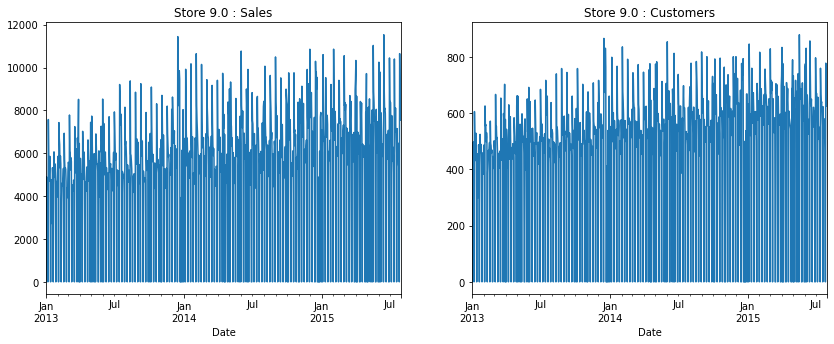

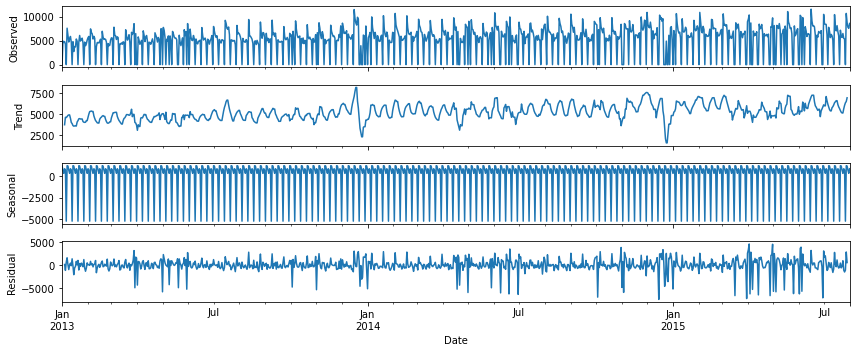

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


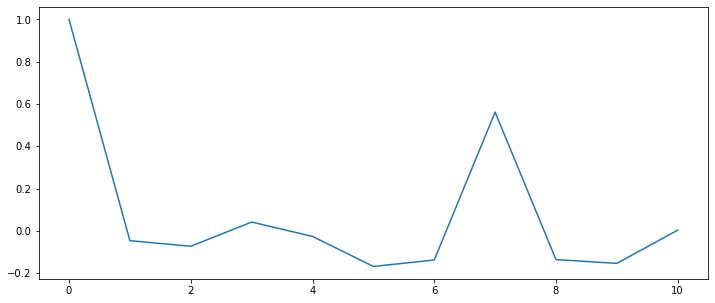

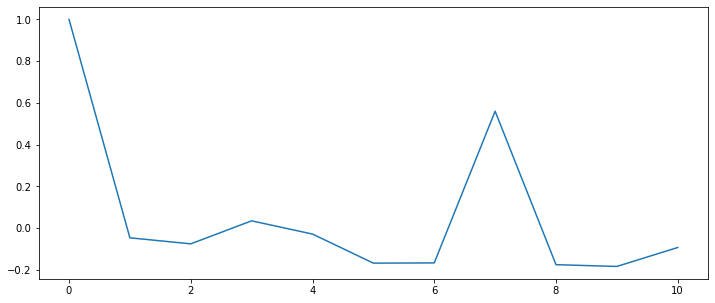

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


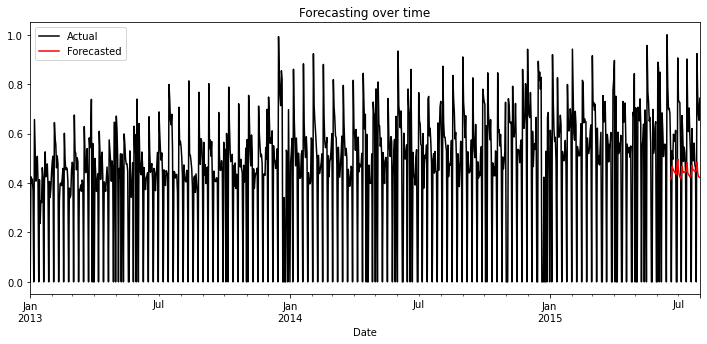

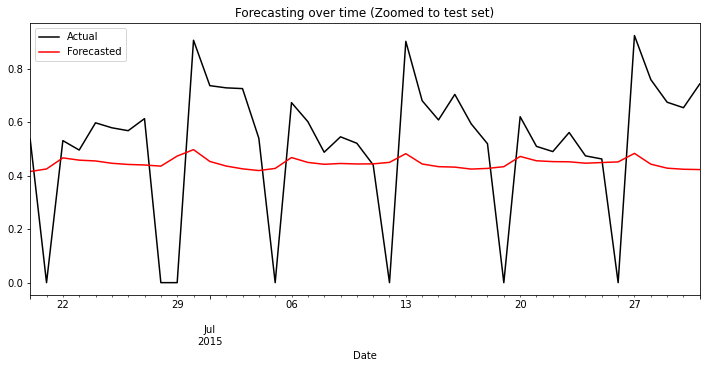

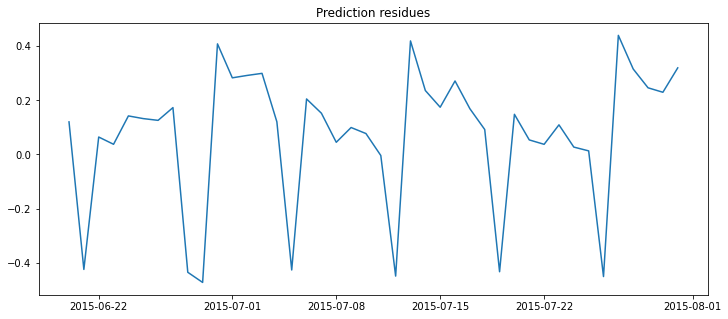

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.473070,1.036278
2015-07-26,0.000000,0.451299,0.988588
2015-07-12,0.000000,0.449562,0.984783
2015-06-28,0.000000,0.435505,0.953991
2015-07-19,0.000000,0.433468,0.949529
2015-07-05,0.000000,0.426974,0.935303
2015-06-21,0.000000,0.424964,0.930901
2015-07-27,0.923591,0.483181,0.476846
2015-07-13,0.901908,0.482069,0.465501


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


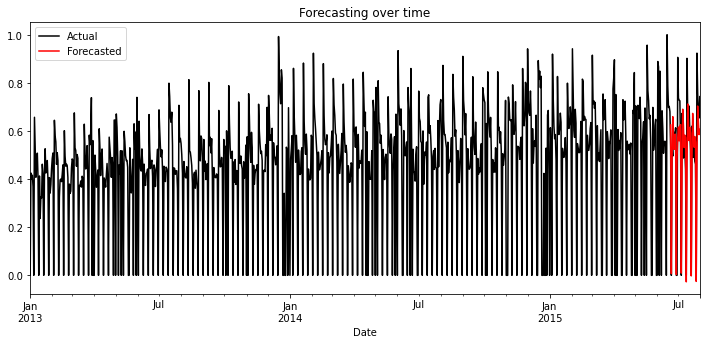

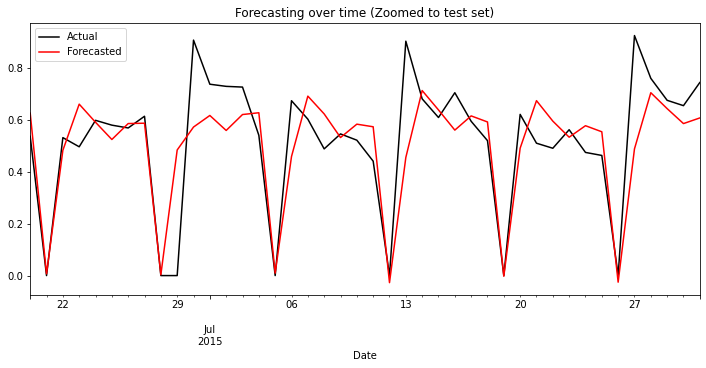

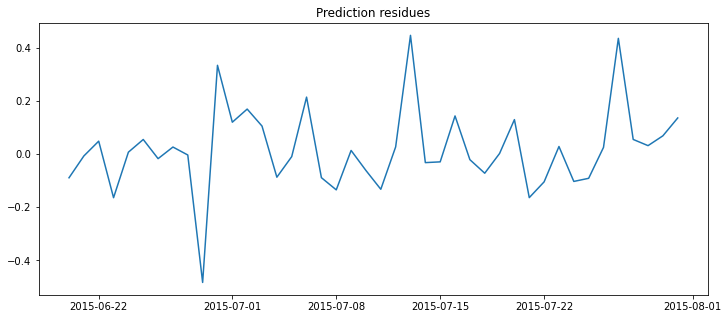

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.483247,1.058571
2015-07-13,0.901908,0.454545,0.496019
2015-07-27,0.923591,0.487495,0.472174
2015-06-30,0.906071,0.571546,0.369204
2015-06-23,0.495577,0.659667,0.331109
2015-07-21,0.509367,0.673130,0.321503
2015-07-06,0.672853,0.458113,0.319148
2015-07-11,0.440243,0.572611,0.300670
2015-07-08,0.487511,0.622049,0.275969


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


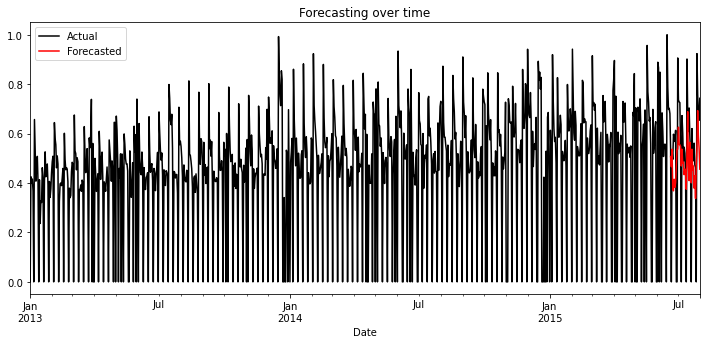

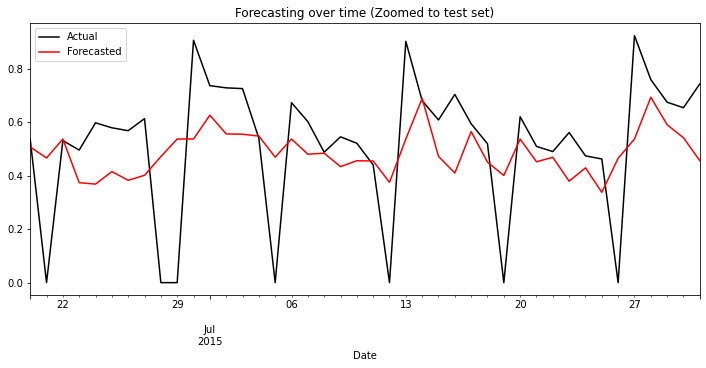

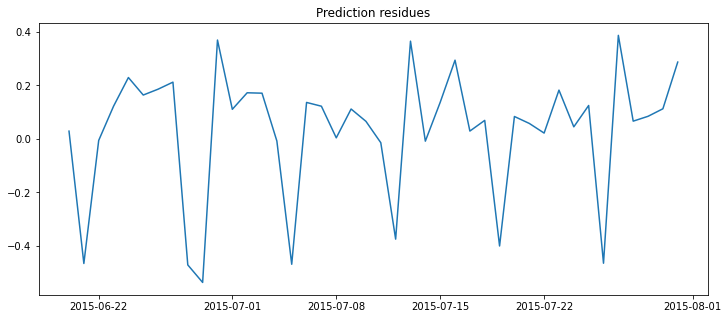

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.536869,1.176034
2015-06-28,0.000000,0.471340,1.032488
2015-07-05,0.000000,0.468935,1.027221
2015-06-21,0.000000,0.465995,1.020781
2015-07-26,0.000000,0.465028,1.018662
2015-07-19,0.000000,0.400600,0.877531
2015-07-12,0.000000,0.374980,0.821409
2015-07-27,0.923591,0.536869,0.418715
2015-07-16,0.703643,0.409688,0.417761


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

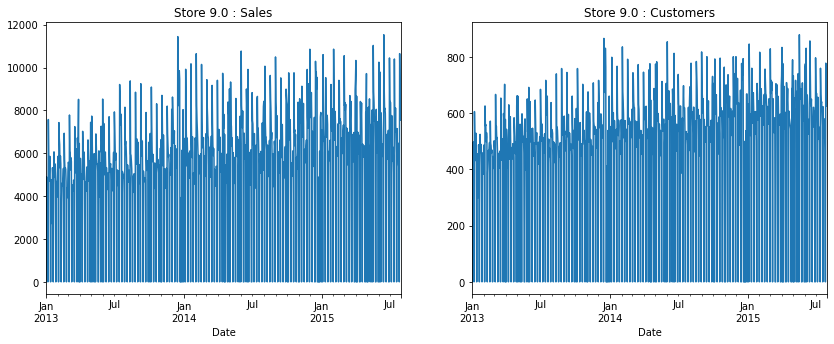

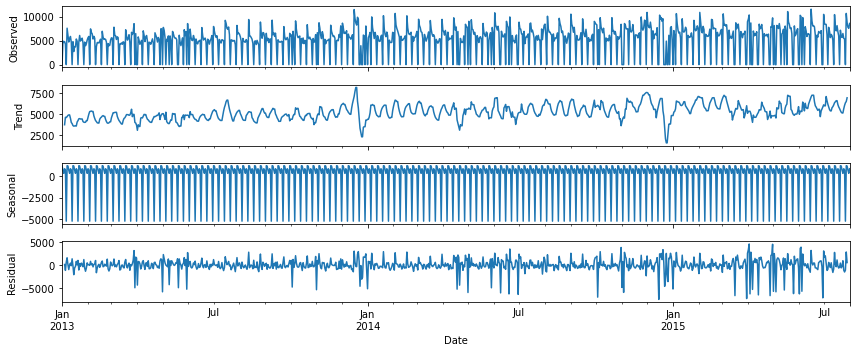

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


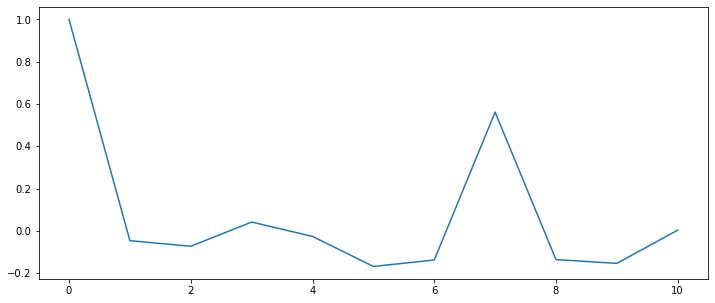

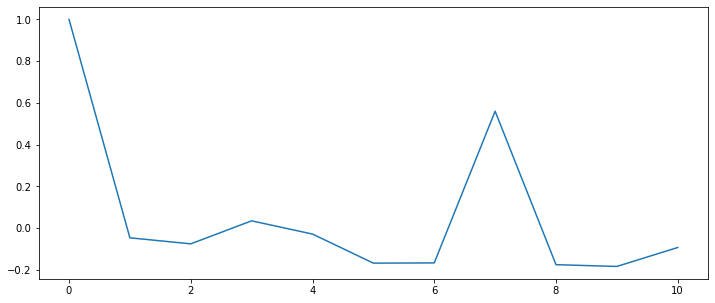

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


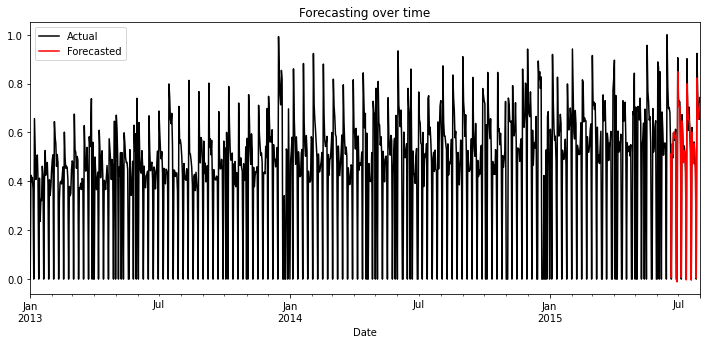

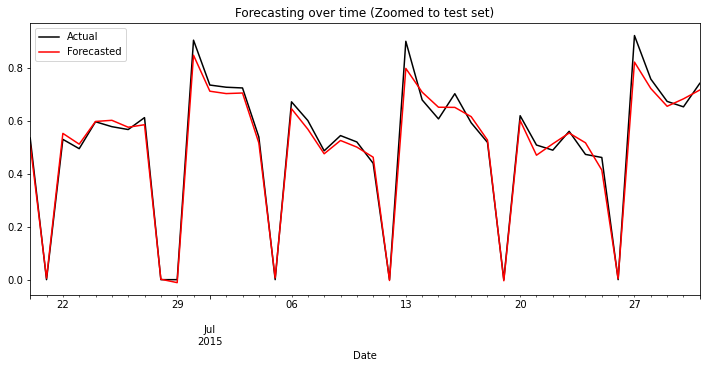

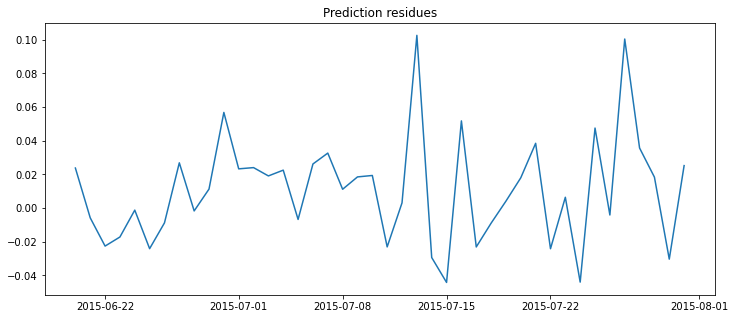

,y,pred,rel_err
Date,,,
2015-07-13,0.901908,0.799279,0.113791
2015-07-27,0.923591,0.823145,0.108755
2015-07-25,0.462272,0.414709,0.102890
2015-07-24,0.473894,0.517819,0.092690
2015-07-21,0.509367,0.470853,0.075612
2015-07-16,0.703643,0.651820,0.073649
2015-07-15,0.608239,0.652370,0.072555
2015-06-30,0.906071,0.849218,0.062747
2015-07-07,0.601908,0.569213,0.054320


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


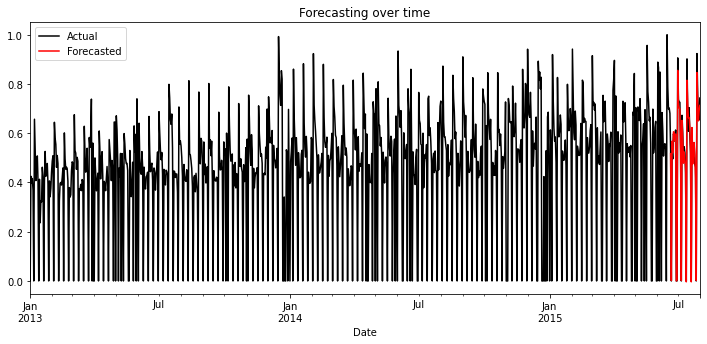

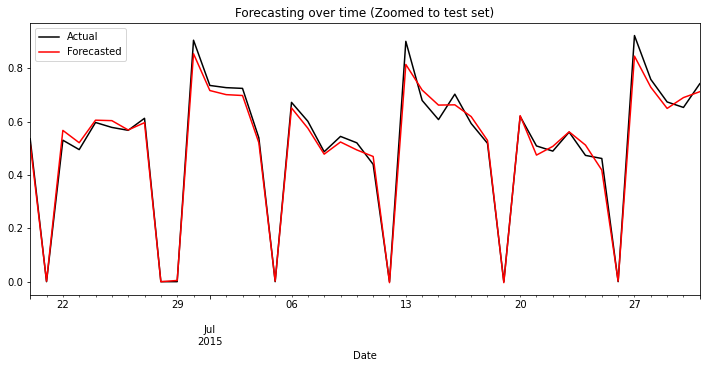

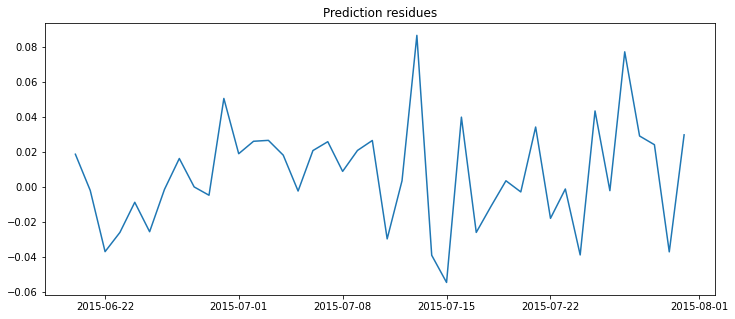

,y,pred,rel_err
Date,,,
2015-07-13,0.901908,0.815203,0.096135
2015-07-25,0.462272,0.418748,0.094153
2015-07-15,0.608239,0.662654,0.089463
2015-07-27,0.923591,0.846291,0.083695
2015-07-24,0.473894,0.512598,0.081672
2015-06-22,0.530876,0.567700,0.069364
2015-07-21,0.509367,0.475017,0.067436
2015-07-11,0.440243,0.469779,0.067092
2015-07-14,0.680052,0.718945,0.057191


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


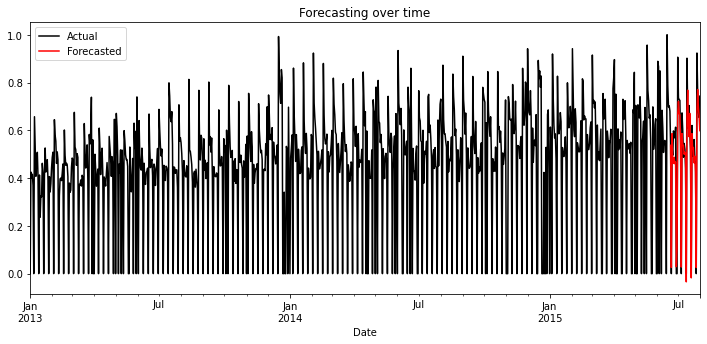

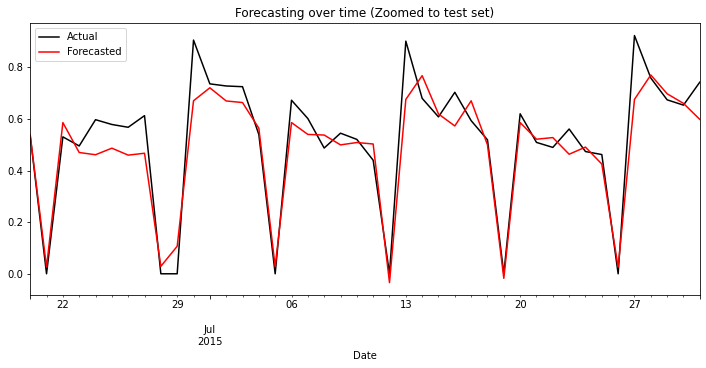

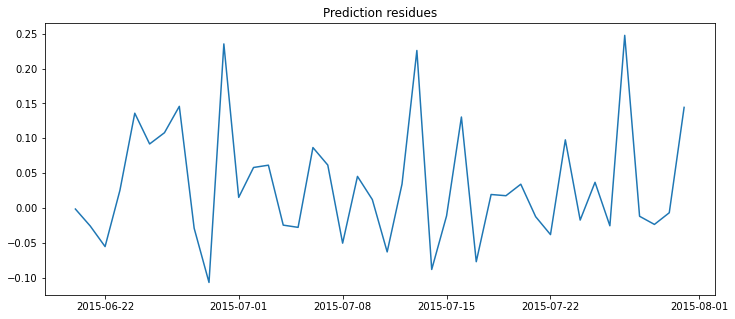

,y,pred,rel_err
Date,,,
2015-07-27,0.923591,0.676048,0.268022
2015-06-30,0.906071,0.670791,0.259671
2015-07-13,0.901908,0.676048,0.250425
2015-06-27,0.613096,0.467313,0.237783
2015-06-29,0.000000,0.106674,0.233674
2015-06-24,0.597398,0.461468,0.227538
2015-07-31,0.742845,0.598544,0.194254
2015-06-26,0.567997,0.460025,0.190092
2015-07-16,0.703643,0.573165,0.185432


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  13 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

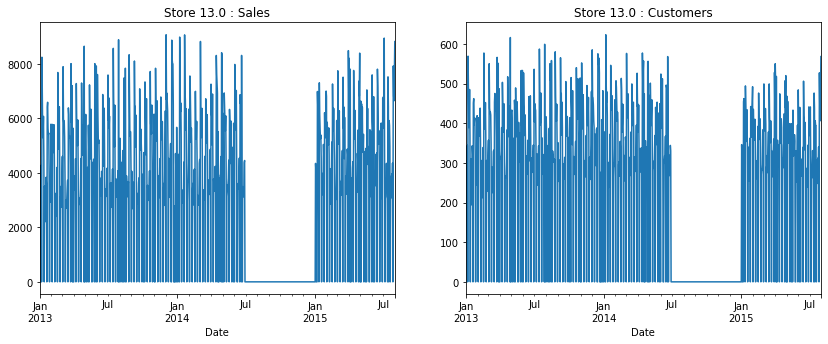

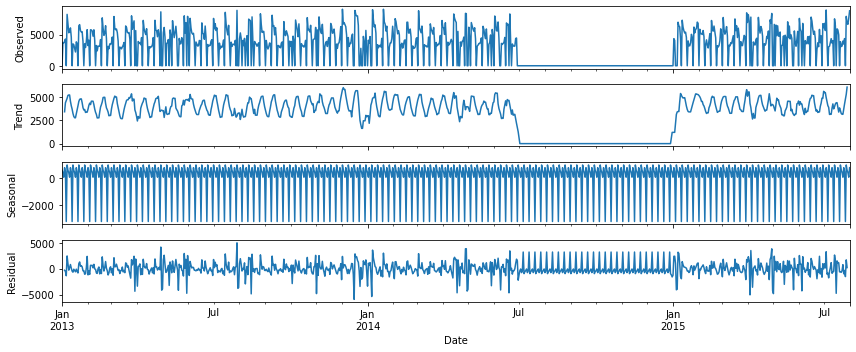

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


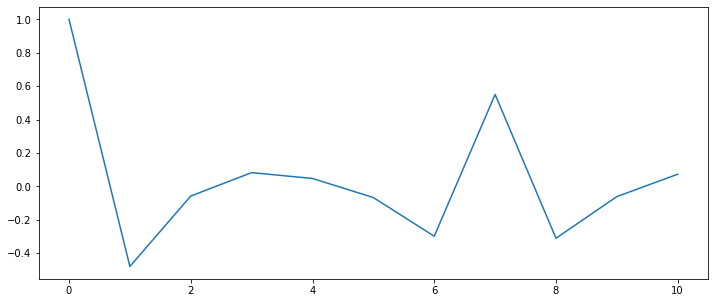

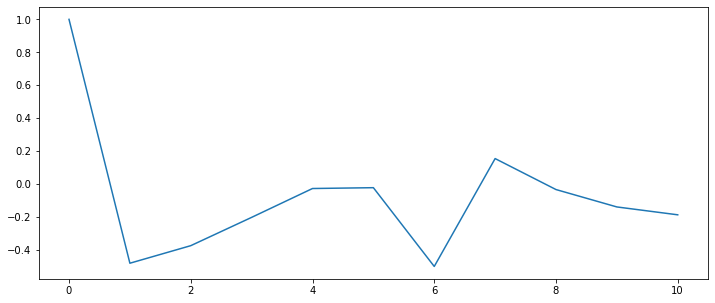

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


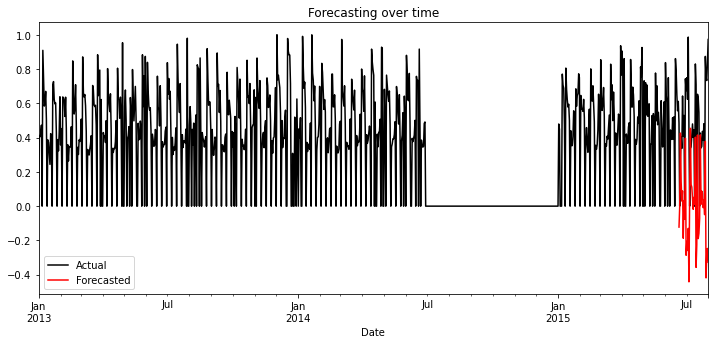

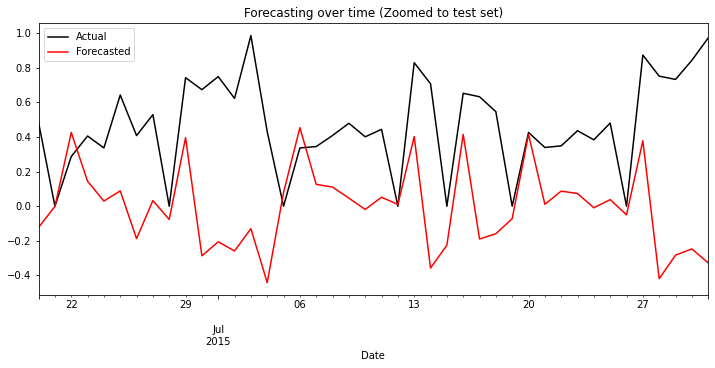

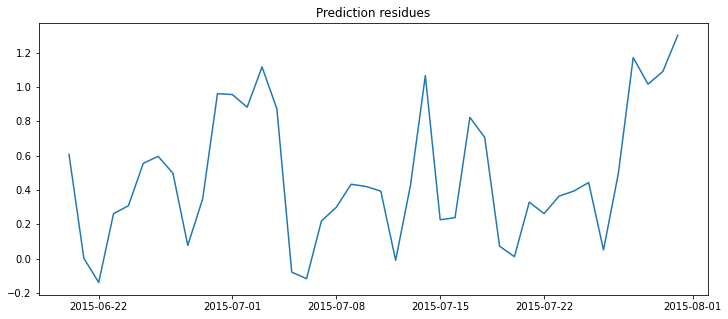

,y,pred,rel_err
Date,,,
2015-07-04,0.430603,-0.441731,2.025843
2015-07-28,0.751736,-0.418816,1.557132
2015-07-14,0.707970,-0.357374,1.504787
2015-06-26,0.408114,-0.187340,1.459039
2015-06-30,0.673575,-0.286699,1.425637
2015-07-02,0.623085,-0.258608,1.415045
2015-07-29,0.732885,-0.282669,1.385694
2015-07-31,0.972440,-0.327449,1.336729
2015-07-17,0.632786,-0.189492,1.299457


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


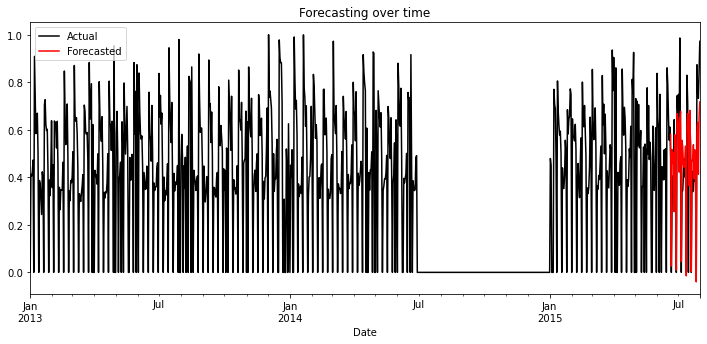

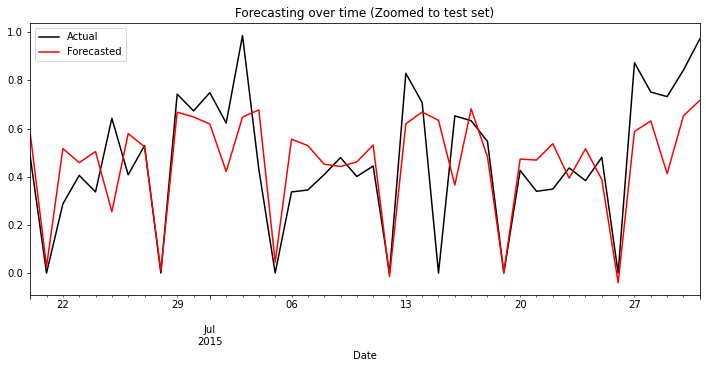

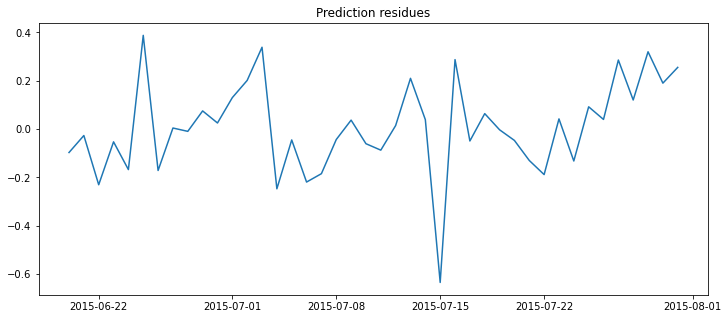

,y,pred,rel_err
Date,,,
2015-07-15,0.000000,0.634269,1.787744
2015-06-22,0.286958,0.517176,0.802270
2015-07-06,0.336788,0.555850,0.650446
2015-06-25,0.642708,0.255044,0.603172
2015-07-04,0.430603,0.677616,0.573644
2015-07-22,0.348804,0.537017,0.539595
2015-07-07,0.344945,0.529365,0.534635
2015-06-24,0.336898,0.504415,0.497235
2015-07-16,0.652739,0.365455,0.440121


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:157: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


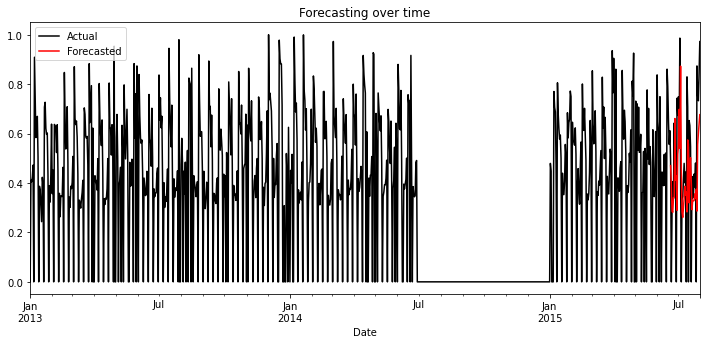

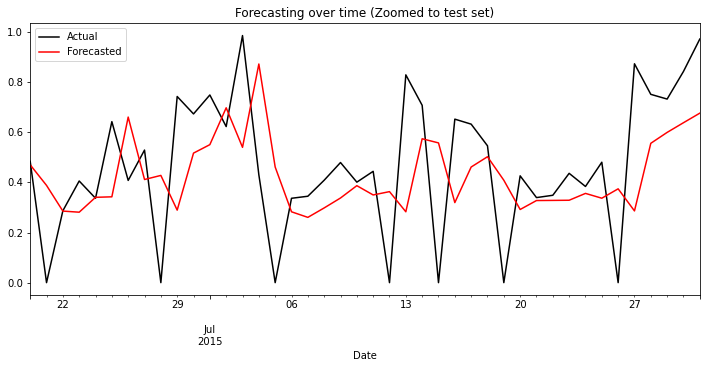

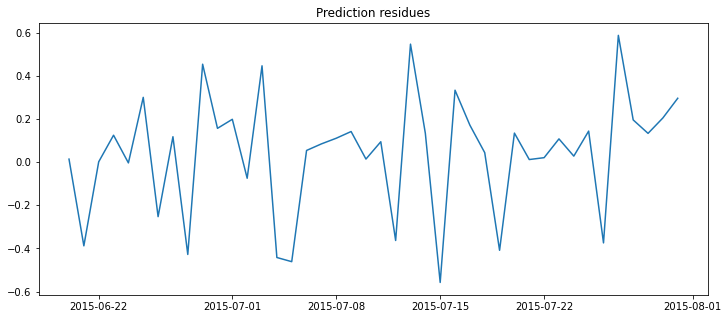

,y,pred,rel_err
Date,,,
2015-07-15,0.000000,0.557869,1.572405
2015-07-05,0.000000,0.461580,1.301004
2015-06-28,0.000000,0.428077,1.206575
2015-07-19,0.000000,0.408827,1.152316
2015-06-21,0.000000,0.388205,1.094191
2015-07-26,0.000000,0.374545,1.055690
2015-07-04,0.430603,0.872866,1.027079
2015-07-12,0.000000,0.363343,1.024116
2015-07-27,0.873774,0.286376,0.672254


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

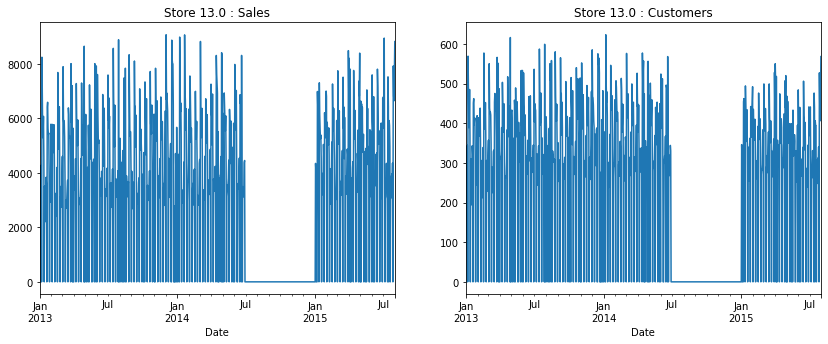

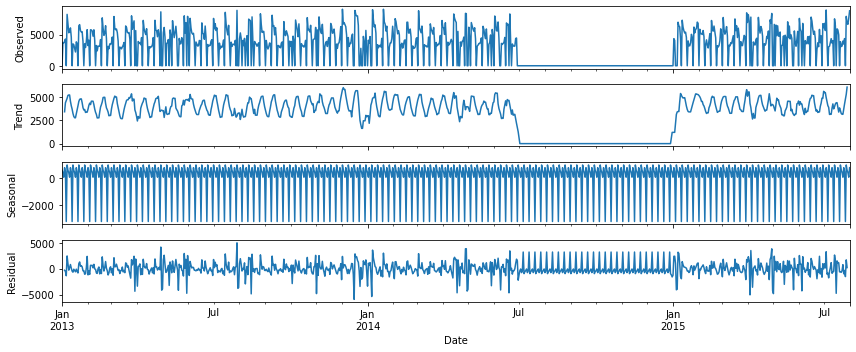

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


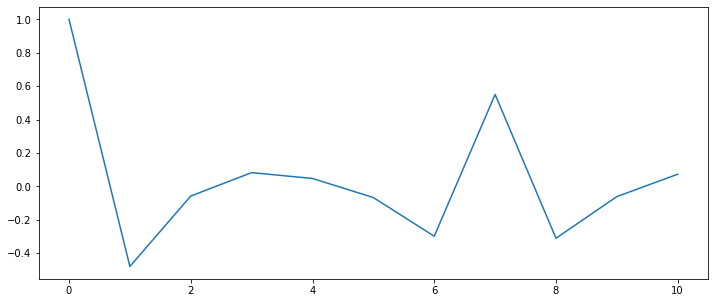

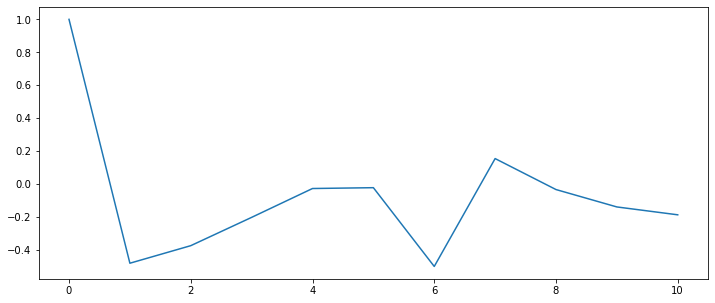

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


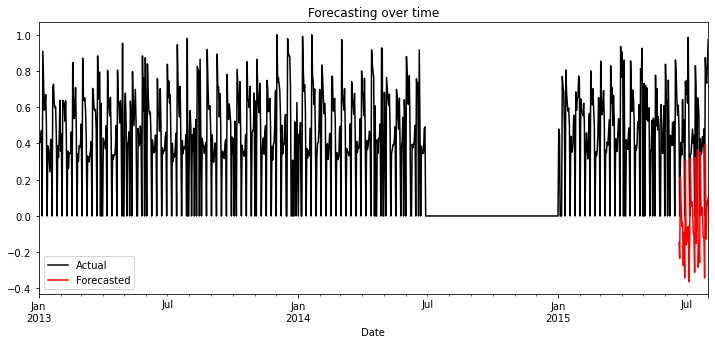

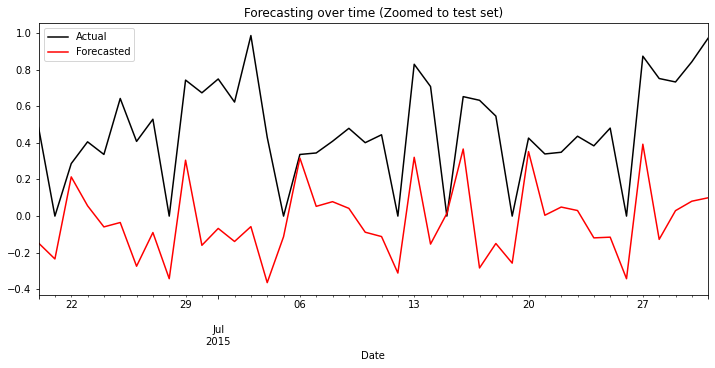

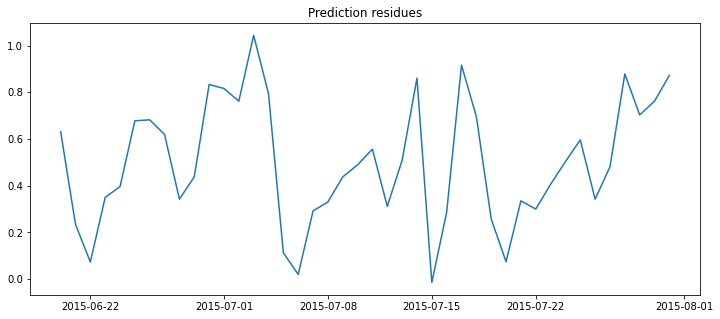

,y,pred,rel_err
Date,,,
2015-07-04,0.430603,-0.363563,1.844311
2015-06-26,0.408114,-0.273907,1.671154
2015-07-17,0.632786,-0.283267,1.447651
2015-07-24,0.383971,-0.118980,1.309866
2015-06-20,0.484070,-0.147193,1.304074
2015-07-18,0.546357,-0.149714,1.274023
2015-07-11,0.444383,-0.111752,1.251477
2015-07-25,0.480763,-0.115099,1.239410
2015-06-30,0.673575,-0.159561,1.236886


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


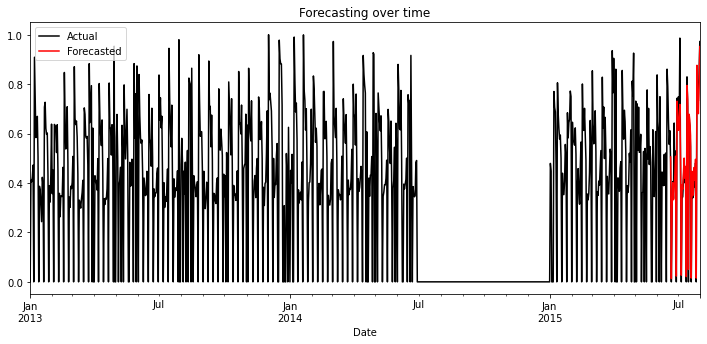

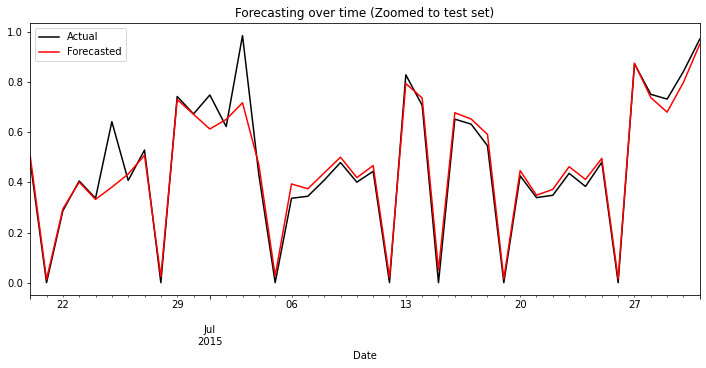

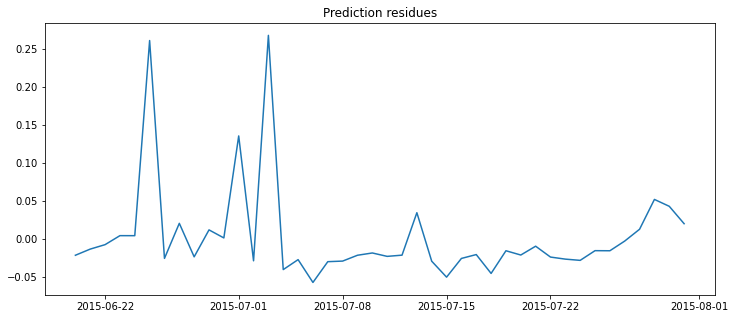

,y,pred,rel_err
Date,,,
2015-06-25,0.642708,0.381177,0.406919
2015-07-03,0.986440,0.718073,0.272057
2015-07-01,0.749201,0.613329,0.181356
2015-07-06,0.336788,0.393931,0.169673
2015-07-15,0.000000,0.050163,0.141389
2015-07-04,0.430603,0.470818,0.093392
2015-07-07,0.344945,0.374729,0.086341
2015-07-18,0.546357,0.591613,0.082834
2015-07-05,0.000000,0.027091,0.076359


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:157: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


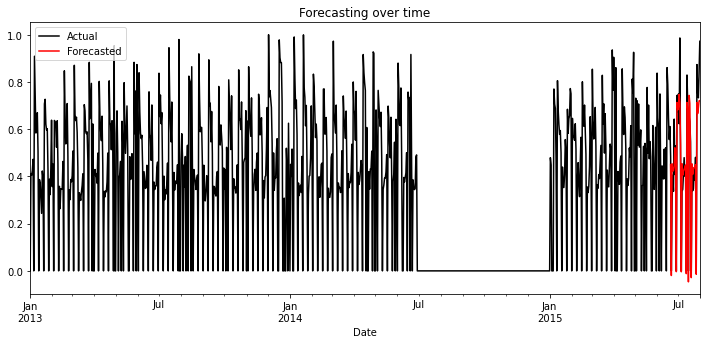

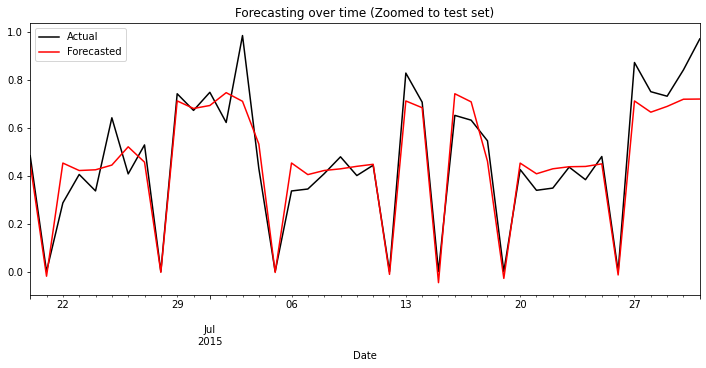

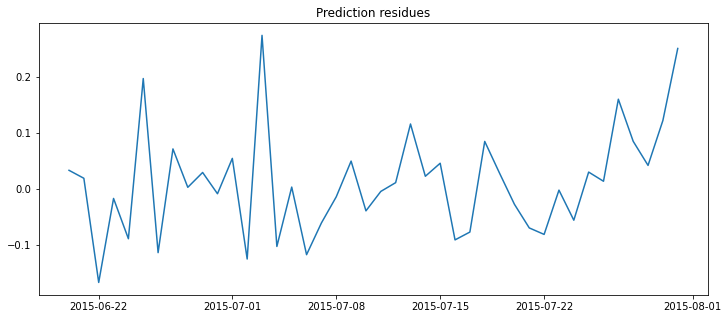

,y,pred,rel_err
Date,,,
2015-06-22,0.286958,0.453422,0.580098
2015-07-06,0.336788,0.453663,0.347029
2015-06-25,0.642708,0.444994,0.307626
2015-07-03,0.986440,0.711598,0.278620
2015-06-26,0.408114,0.521361,0.277488
2015-06-24,0.336898,0.425291,0.262373
2015-07-31,0.972440,0.721030,0.258535
2015-07-04,0.430603,0.532801,0.237337
2015-07-22,0.348804,0.429476,0.231282


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  25 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

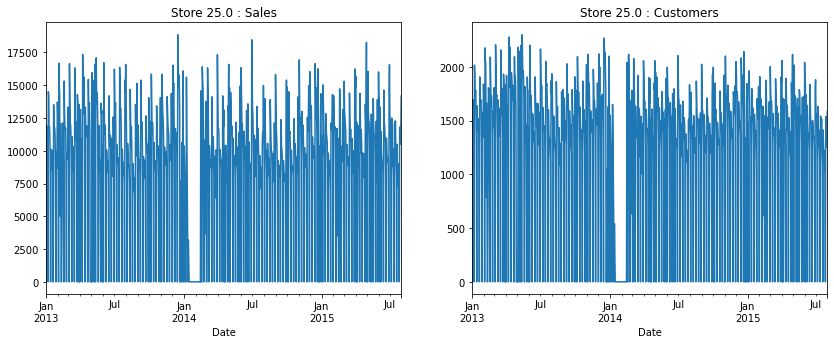

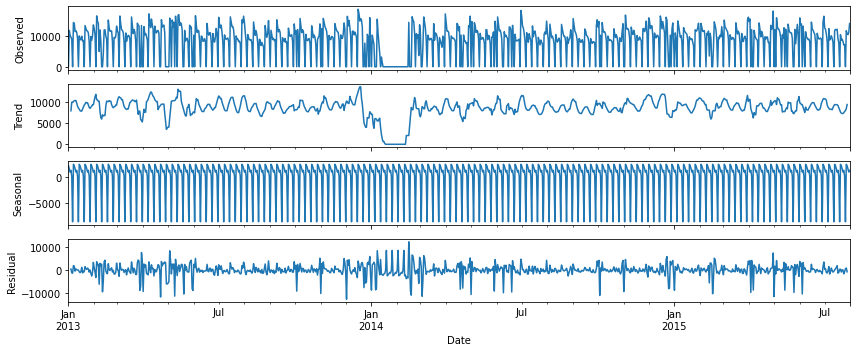

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


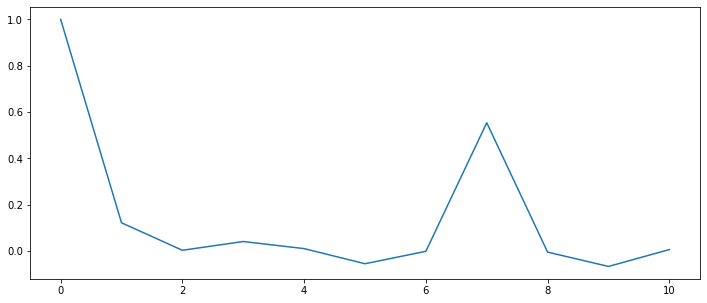

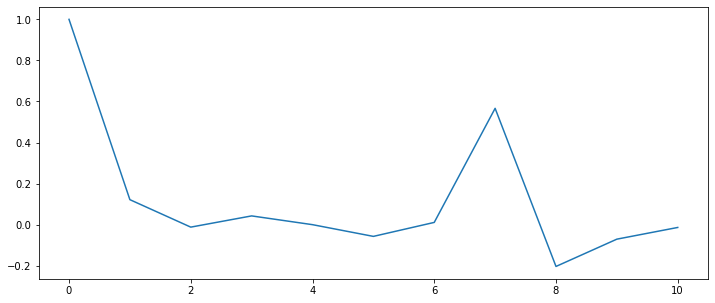

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


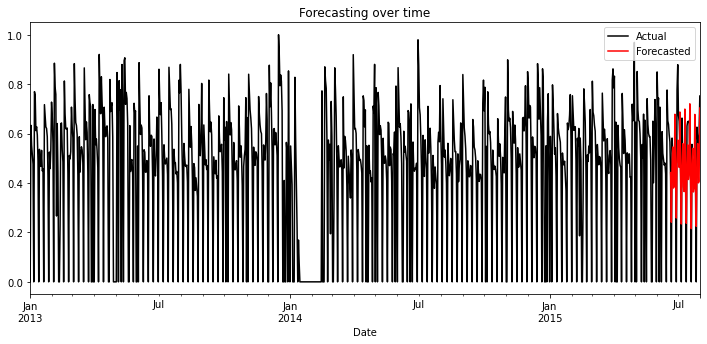

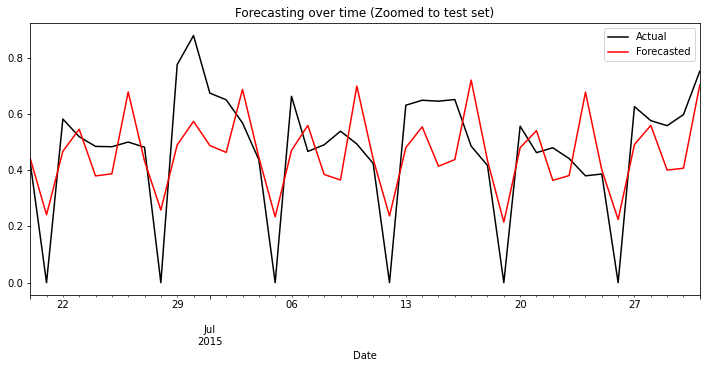

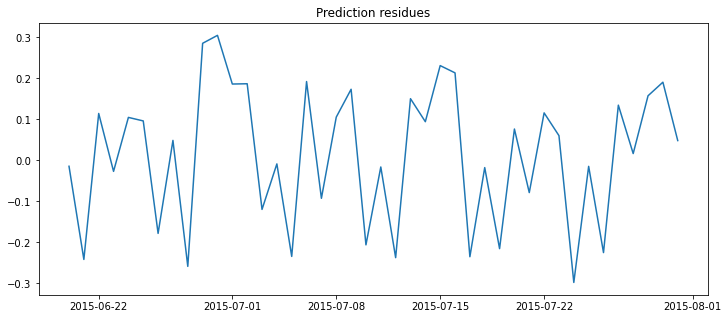

,y,pred,rel_err
Date,,,
2015-07-24,0.380025,0.677699,0.783300
2015-06-28,0.000000,0.258447,0.565990
2015-06-21,0.000000,0.241546,0.528977
2015-07-12,0.000000,0.237182,0.519420
2015-07-05,0.000000,0.234192,0.512872
2015-07-26,0.000000,0.224832,0.492375
2015-07-17,0.485573,0.720498,0.483810
2015-07-19,0.000000,0.215194,0.471268
2015-07-10,0.493264,0.699219,0.417534


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


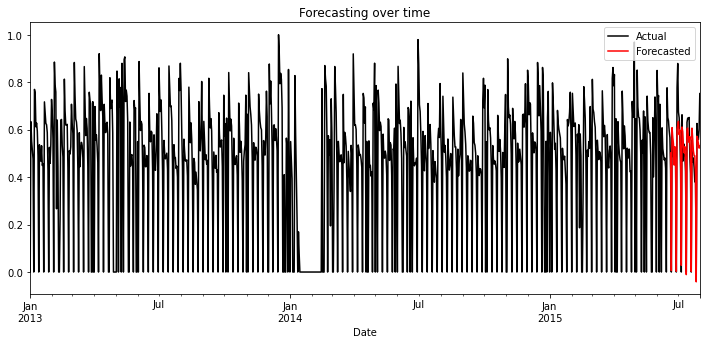

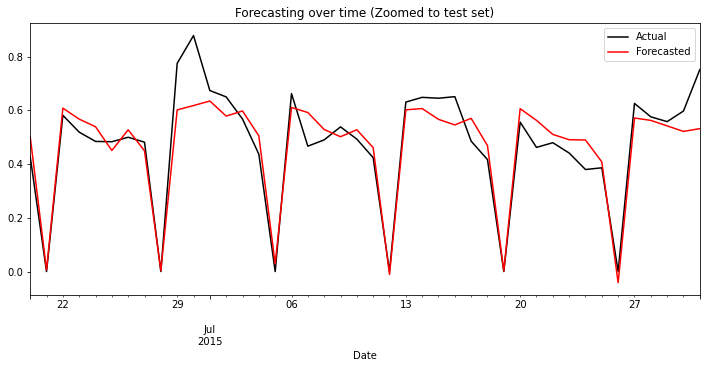

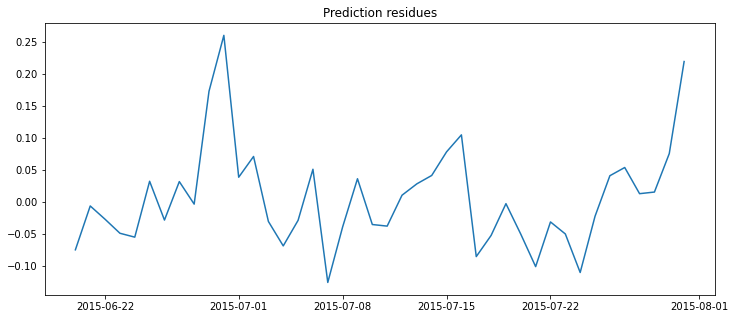

,y,pred,rel_err
Date,,,
2015-06-30,0.878965,0.618205,0.296667
2015-07-31,0.752095,0.532251,0.292309
2015-07-24,0.380025,0.489886,0.289088
2015-07-07,0.466851,0.592257,0.268622
2015-06-29,0.775485,0.602051,0.223646
2015-07-21,0.462395,0.563076,0.217738
2015-07-17,0.485573,0.570582,0.175069
2015-06-20,0.427867,0.502277,0.173910
2015-07-16,0.651374,0.546139,0.161557


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


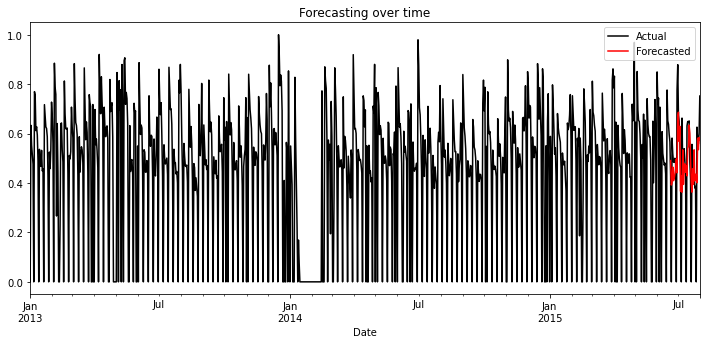

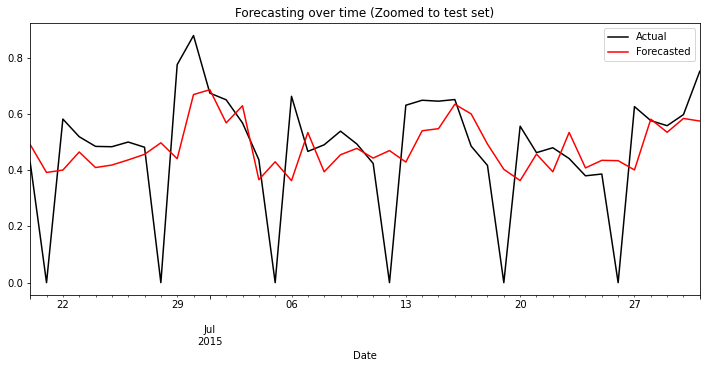

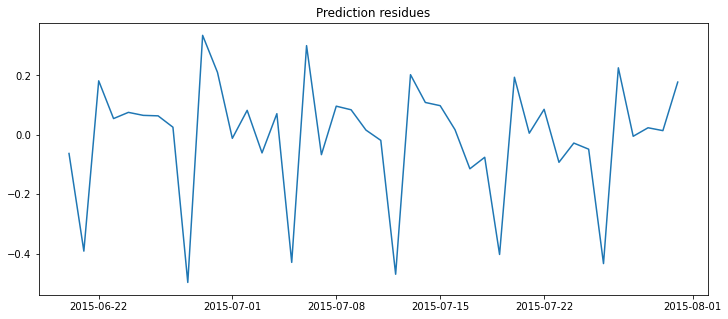

,y,pred,rel_err
Date,,,
2015-06-28,0.000000,0.497389,1.089264
2015-07-12,0.000000,0.469774,1.028787
2015-07-26,0.000000,0.433865,0.950149
2015-07-05,0.000000,0.429838,0.941330
2015-07-19,0.000000,0.403168,0.882923
2015-06-21,0.000000,0.391929,0.858310
2015-07-06,0.662777,0.362809,0.452593
2015-06-29,0.775485,0.440912,0.431438
2015-07-27,0.626180,0.400915,0.359746


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

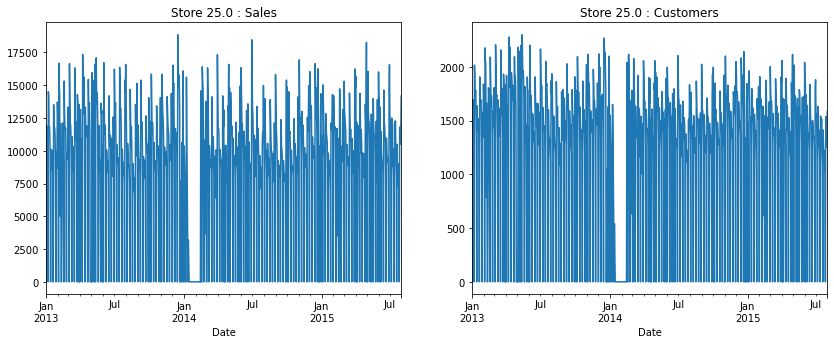

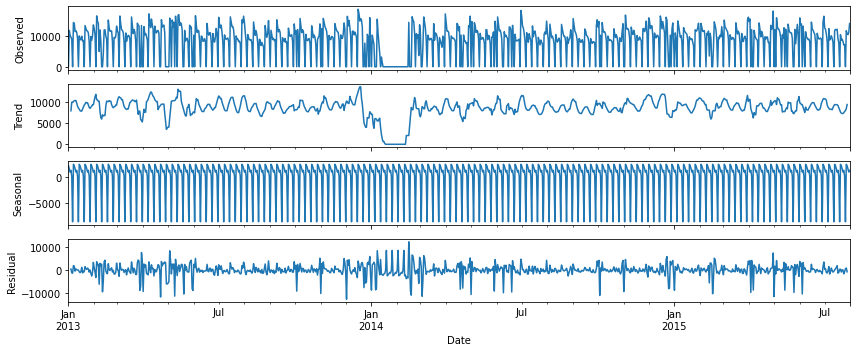

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


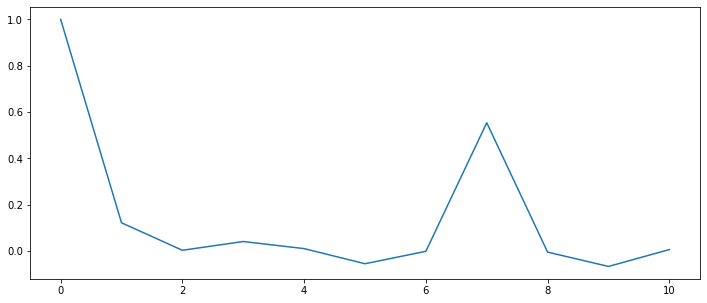

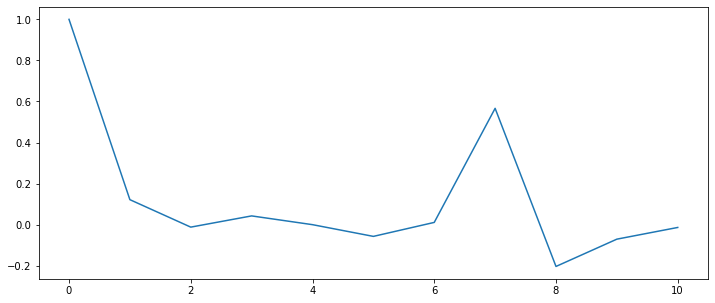

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


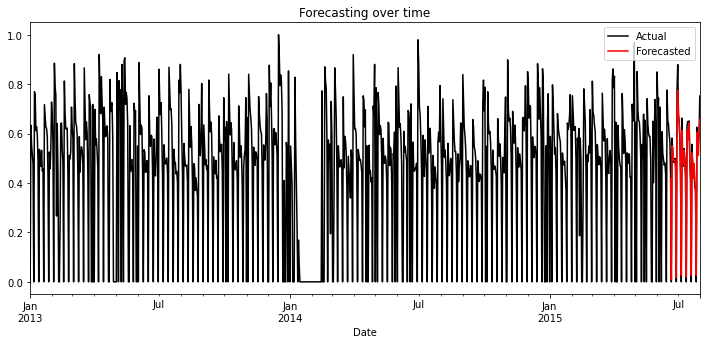

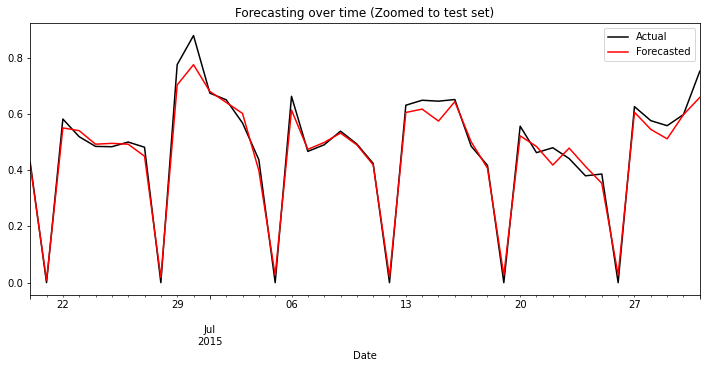

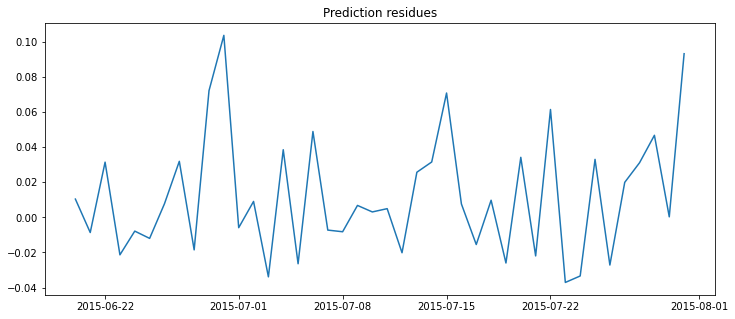

,y,pred,rel_err
Date,,,
2015-07-22,0.479845,0.418408,0.128036
2015-07-31,0.752095,0.658883,0.123936
2015-06-30,0.878965,0.775302,0.117938
2015-07-15,0.645539,0.574725,0.109698
2015-06-29,0.775485,0.703318,0.093061
2015-07-04,0.437202,0.398688,0.088091
2015-07-24,0.380025,0.413422,0.087880
2015-07-25,0.386390,0.353363,0.085475
2015-07-23,0.441445,0.478526,0.083999


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


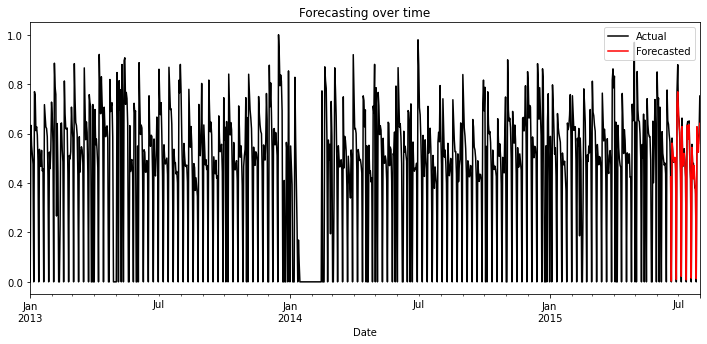

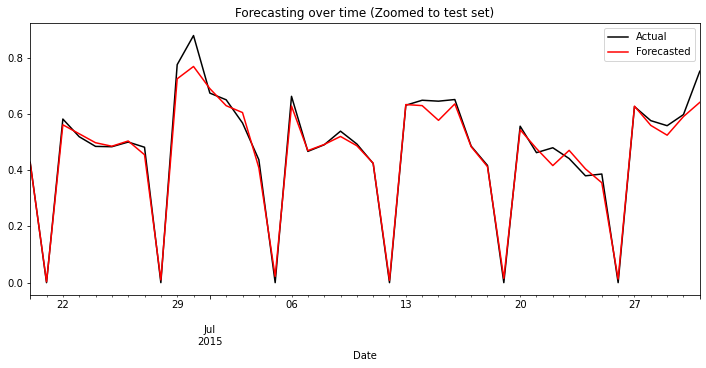

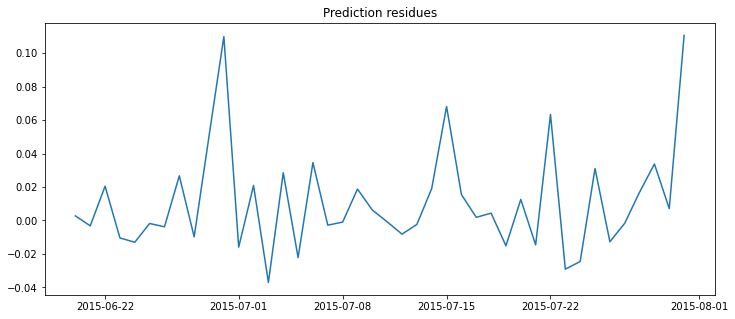

,y,pred,rel_err
Date,,,
2015-07-31,0.752095,0.641371,0.147221
2015-07-22,0.479845,0.416436,0.132145
2015-06-30,0.878965,0.768982,0.125128
2015-07-15,0.645539,0.577341,0.105646
2015-07-25,0.386390,0.355338,0.080366
2015-07-23,0.441445,0.470582,0.066004
2015-07-03,0.567996,0.605078,0.065286
2015-07-04,0.437202,0.408675,0.065249
2015-06-29,0.775485,0.725134,0.064929


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


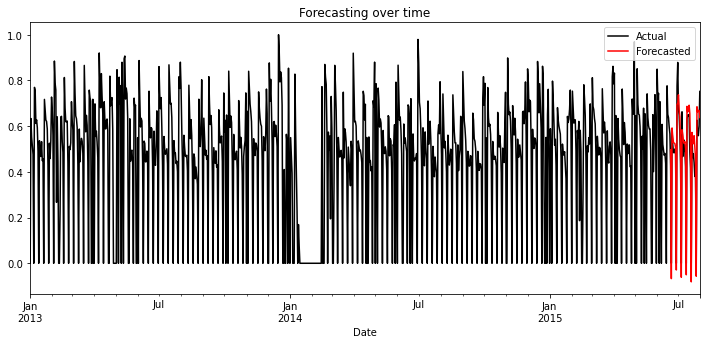

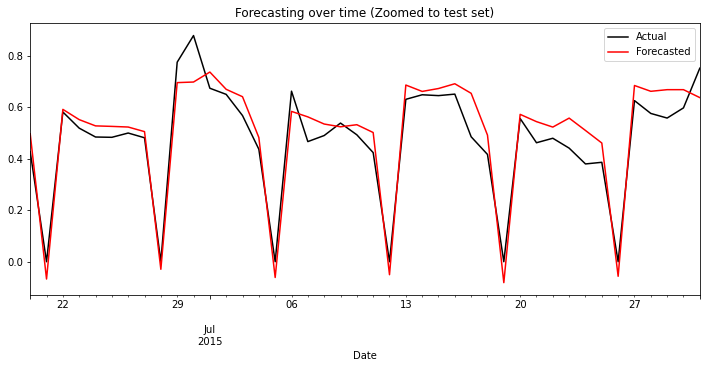

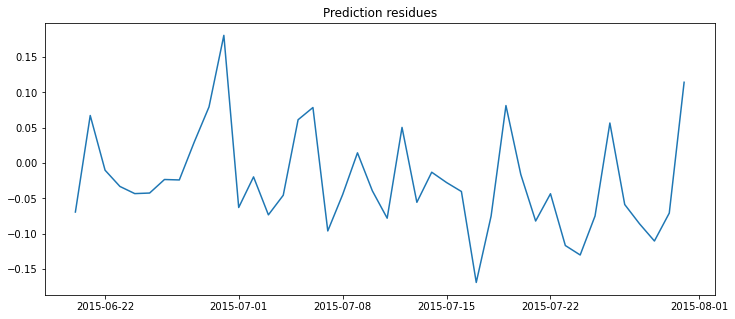

,y,pred,rel_err
Date,,,
2015-07-17,0.485573,0.654497,0.347885
2015-07-24,0.380025,0.510107,0.342296
2015-07-23,0.441445,0.558140,0.264349
2015-07-07,0.466851,0.562915,0.205772
2015-06-30,0.878965,0.698354,0.205482
2015-07-29,0.558343,0.668654,0.197568
2015-07-25,0.386390,0.461331,0.193950
2015-07-11,0.424101,0.502144,0.184020
2015-07-18,0.416941,0.491974,0.179961


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  29 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

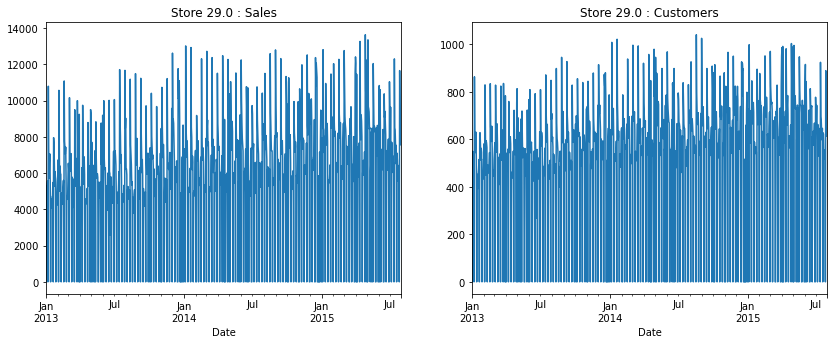

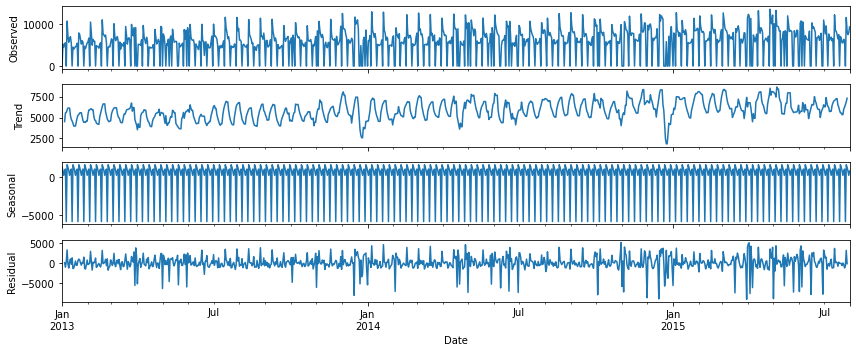

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


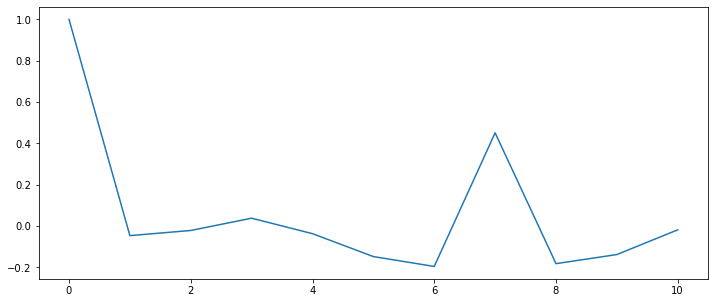

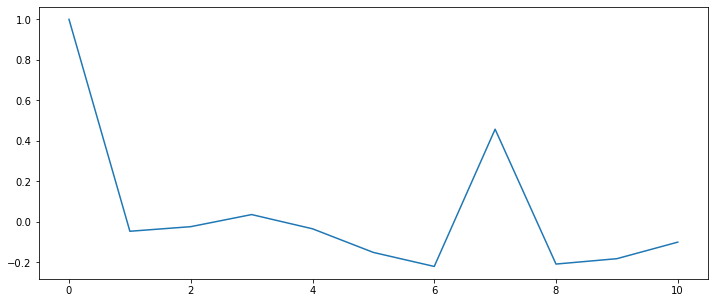

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


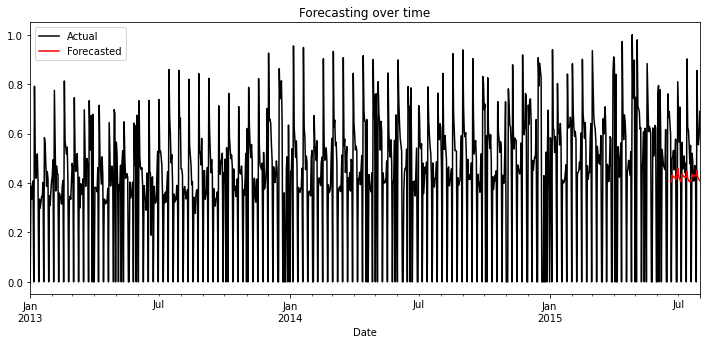

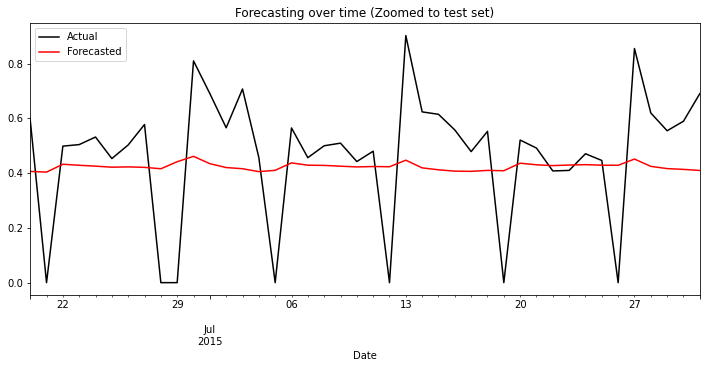

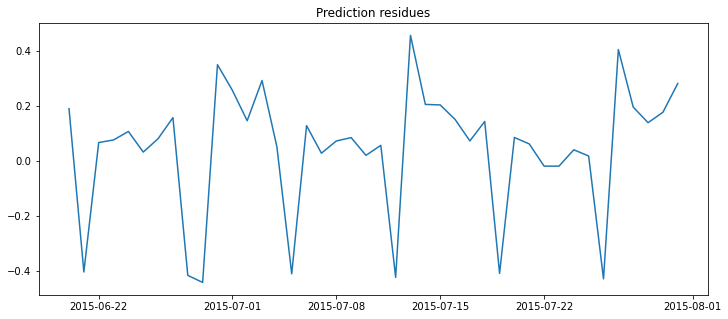

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.441635,1.024719
2015-07-26,0.000000,0.428606,0.994489
2015-07-12,0.000000,0.423210,0.981967
2015-06-28,0.000000,0.415885,0.964972
2015-07-05,0.000000,0.410242,0.951878
2015-07-19,0.000000,0.408723,0.948354
2015-06-21,0.000000,0.403712,0.936728
2015-07-13,0.902325,0.447198,0.504393
2015-07-27,0.854953,0.451298,0.472138


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


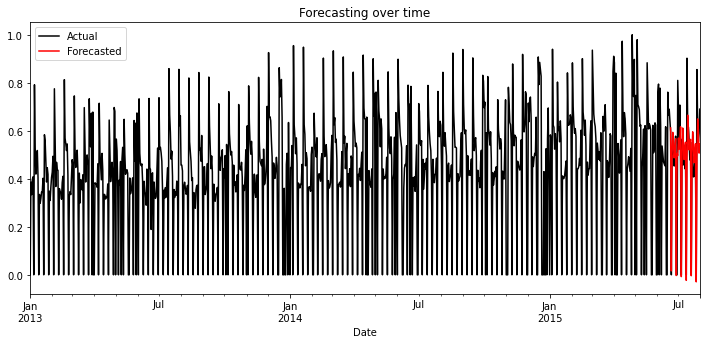

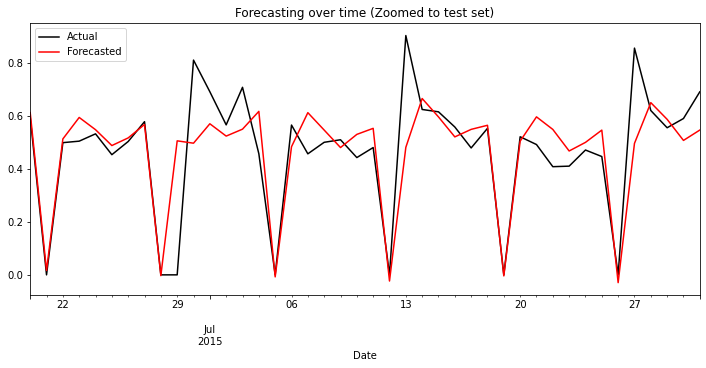

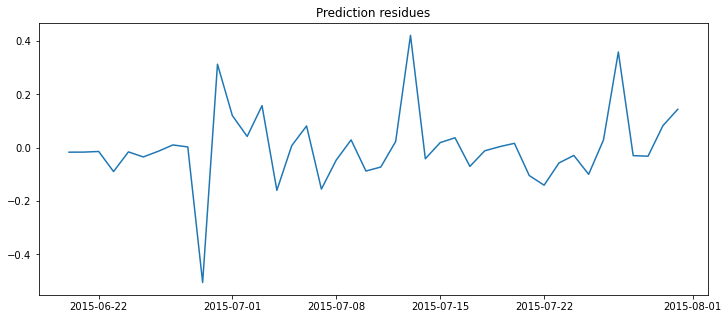

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.505311,1.172465
2015-07-13,0.902325,0.480793,0.467162
2015-07-27,0.854953,0.495749,0.420145
2015-06-30,0.809782,0.496451,0.386933
2015-07-04,0.456699,0.616492,0.349888
2015-07-22,0.407861,0.548379,0.344523
2015-07-07,0.456332,0.611594,0.340239
2015-07-25,0.446139,0.545823,0.223437
2015-07-03,0.707194,0.549378,0.223158


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


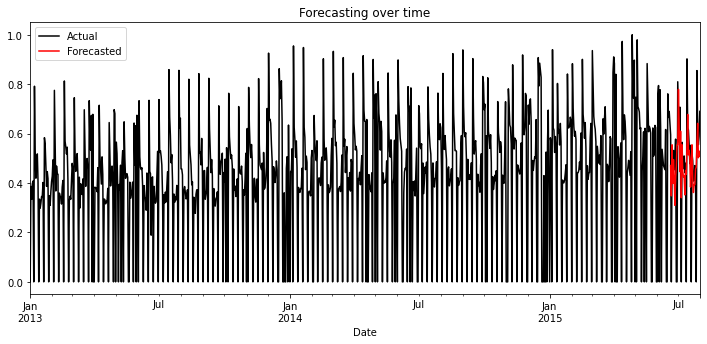

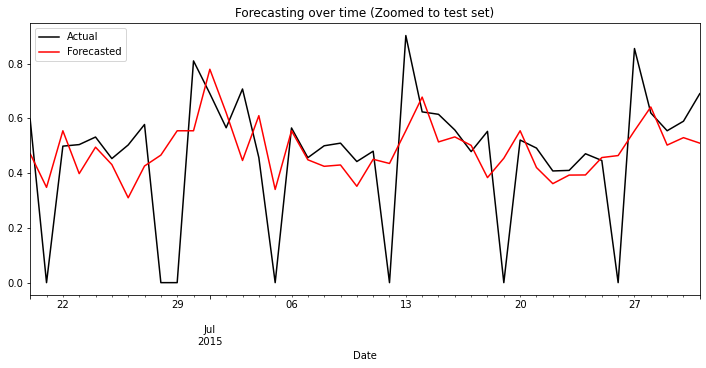

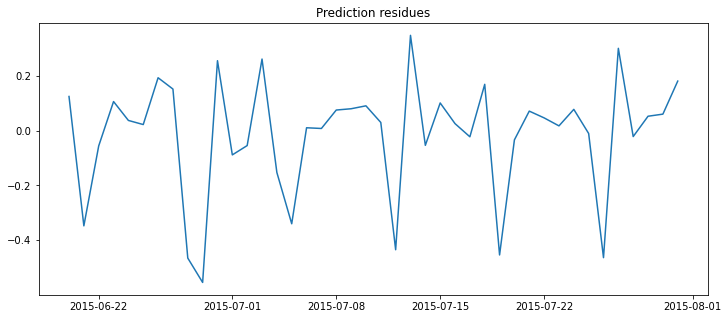

,y,pred,rel_err
Date,,,
2015-06-29,0.000000,0.554621,1.286878
2015-06-28,0.000000,0.465705,1.080568
2015-07-26,0.000000,0.464077,1.076790
2015-07-19,0.000000,0.454232,1.053946
2015-07-12,0.000000,0.435190,1.009765
2015-06-21,0.000000,0.347953,0.807351
2015-07-05,0.000000,0.340357,0.789726
2015-07-13,0.902325,0.554621,0.385342
2015-06-26,0.502823,0.309929,0.383622


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

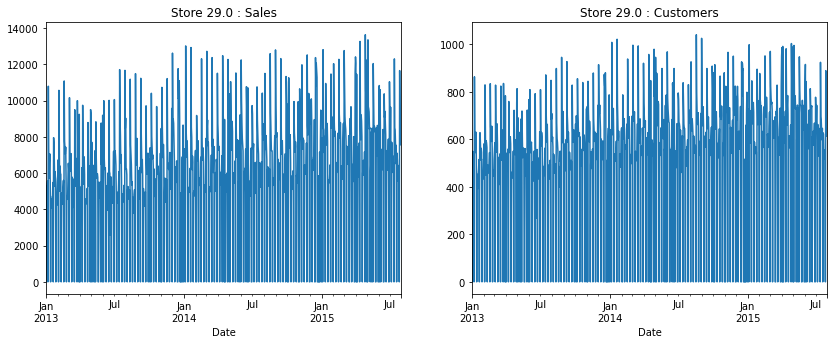

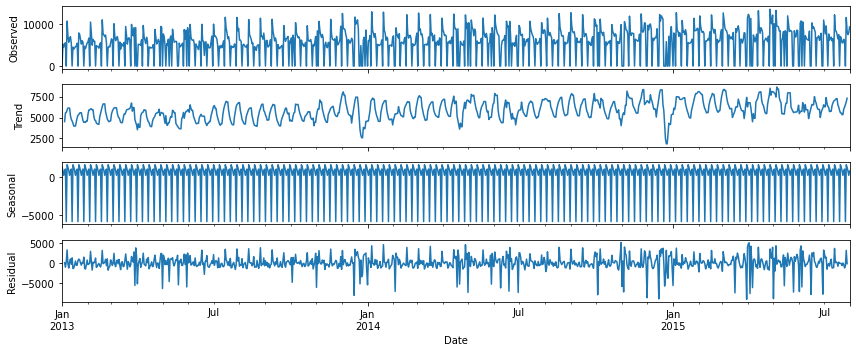

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


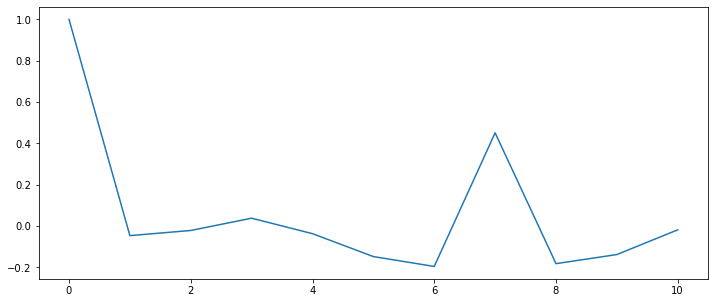

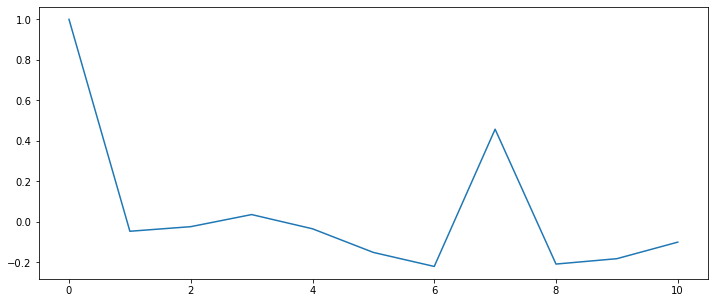

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


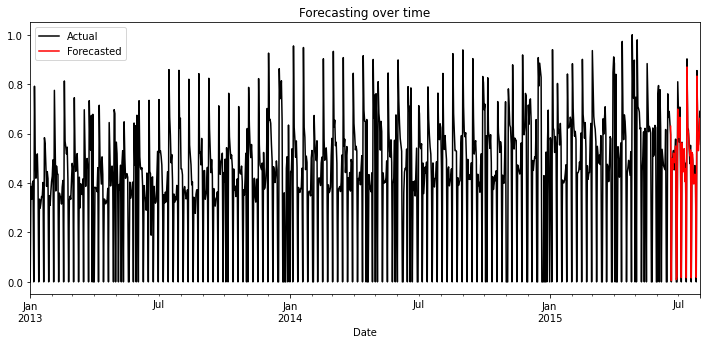

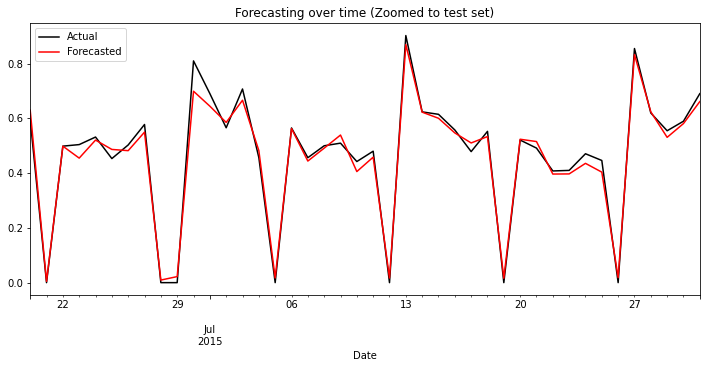

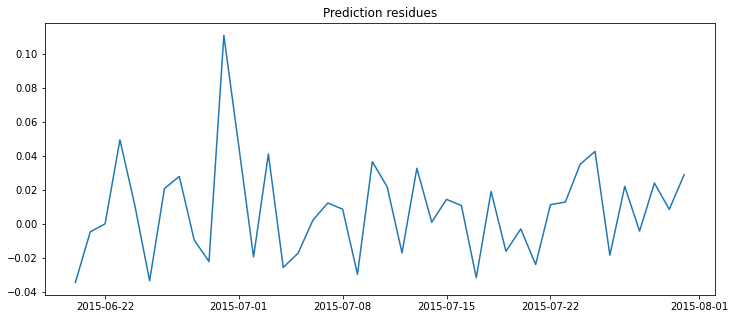

,y,pred,rel_err
Date,,,
2015-06-30,0.809782,0.698977,0.136833
2015-06-23,0.504143,0.454754,0.097967
2015-07-25,0.446139,0.403528,0.095512
2015-07-10,0.442253,0.405661,0.082739
2015-07-24,0.470705,0.435646,0.074481
2015-06-25,0.453106,0.486490,0.073679
2015-07-01,0.690474,0.644464,0.066636
2015-07-17,0.478551,0.510136,0.066000
2015-07-03,0.707194,0.666092,0.058120


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


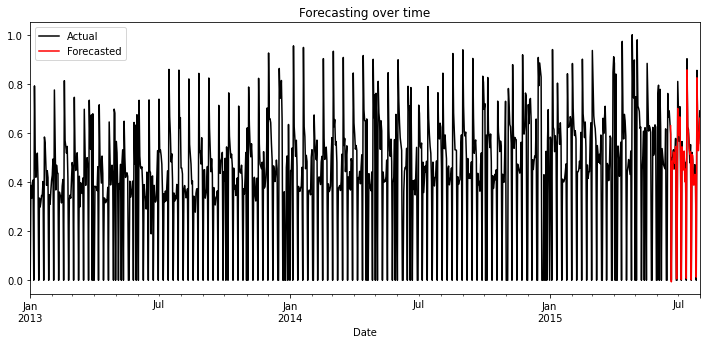

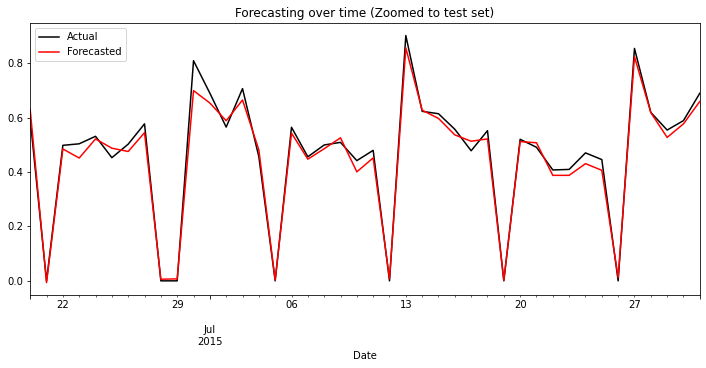

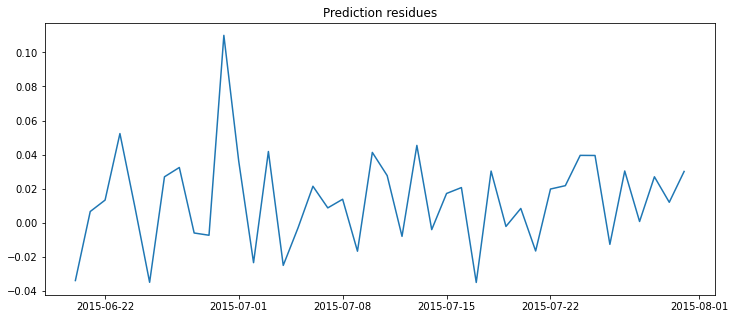

,y,pred,rel_err
Date,,,
2015-06-30,0.809782,0.699786,0.135834
2015-06-23,0.504143,0.451778,0.103870
2015-07-10,0.442253,0.400941,0.093412
2015-07-25,0.446139,0.406632,0.088554
2015-07-24,0.470705,0.431133,0.084070
2015-06-25,0.453106,0.488009,0.077031
2015-07-17,0.478551,0.513543,0.073120
2015-07-03,0.707194,0.665350,0.059169
2015-07-11,0.480018,0.452302,0.057738


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


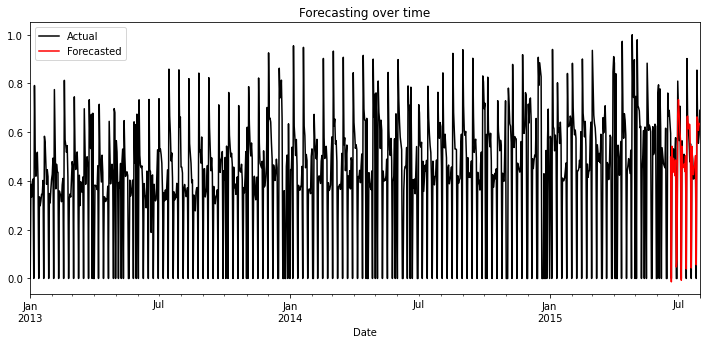

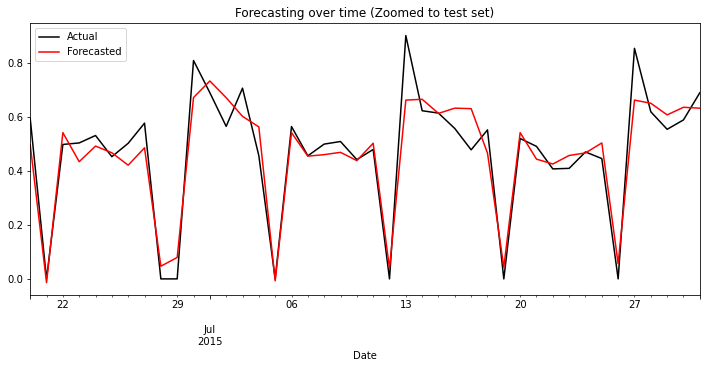

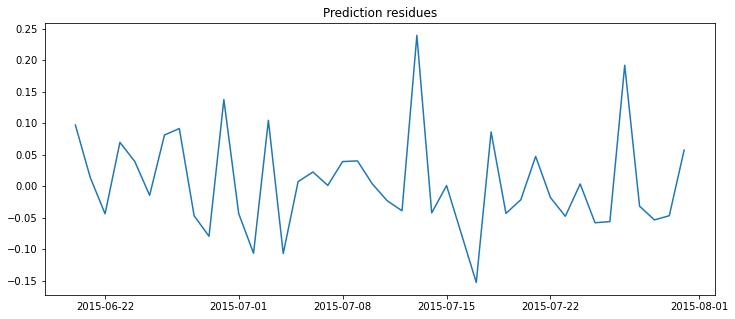

,y,pred,rel_err
Date,,,
2015-07-17,0.478551,0.631263,0.319113
2015-07-13,0.902325,0.663000,0.265232
2015-07-04,0.456699,0.563545,0.233954
2015-07-27,0.854953,0.663000,0.224520
2015-07-02,0.565594,0.671991,0.188117
2015-06-29,0.000000,0.079436,0.184315
2015-06-30,0.809782,0.672433,0.169613
2015-06-20,0.595219,0.498175,0.163039
2015-06-26,0.502823,0.421674,0.161388


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  31 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

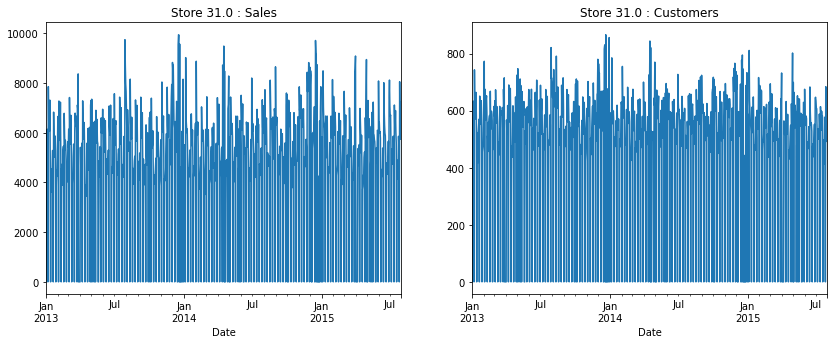

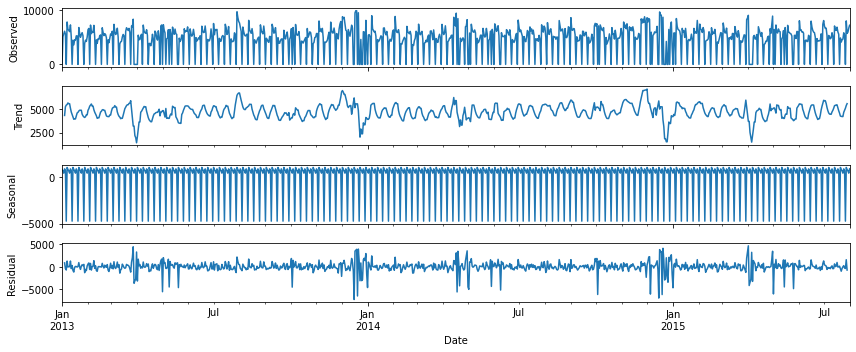

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


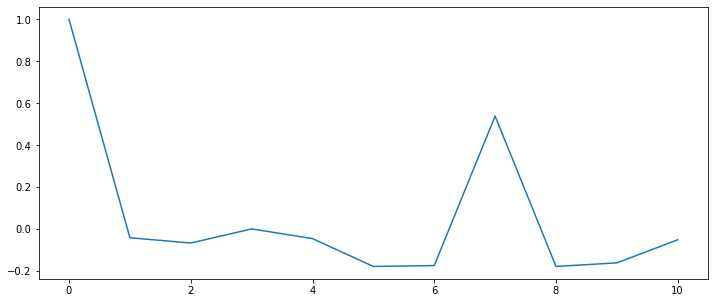

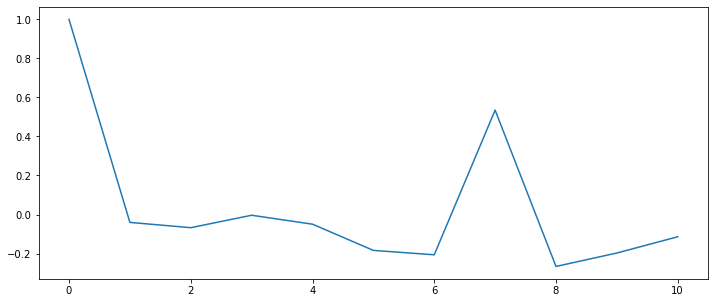

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


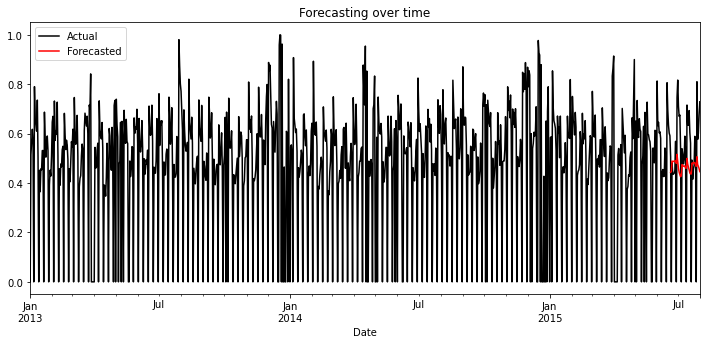

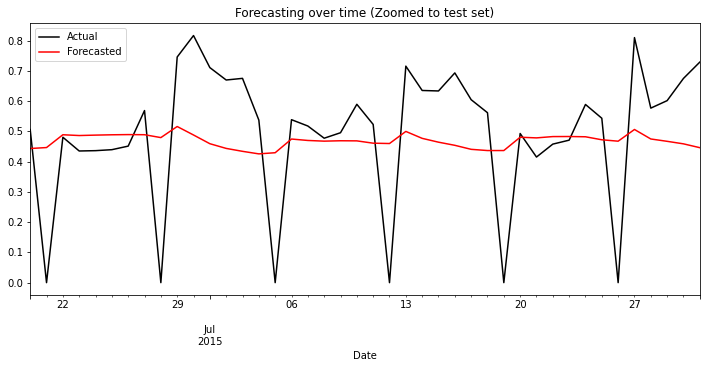

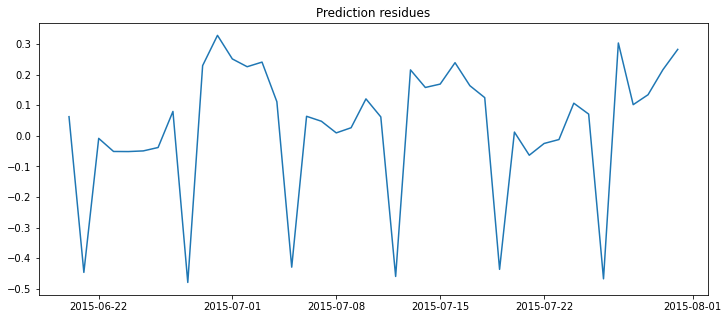

,y,pred,rel_err
Date,,,
2015-06-28,0.000000,0.479358,1.007297
2015-07-26,0.000000,0.467485,0.982347
2015-07-12,0.000000,0.459763,0.966120
2015-06-21,0.000000,0.446479,0.938206
2015-07-19,0.000000,0.436577,0.917399
2015-07-05,0.000000,0.429372,0.902258
2015-06-30,0.816591,0.487954,0.402450
2015-07-31,0.728808,0.446044,0.387981
2015-07-27,0.809854,0.506170,0.374986


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


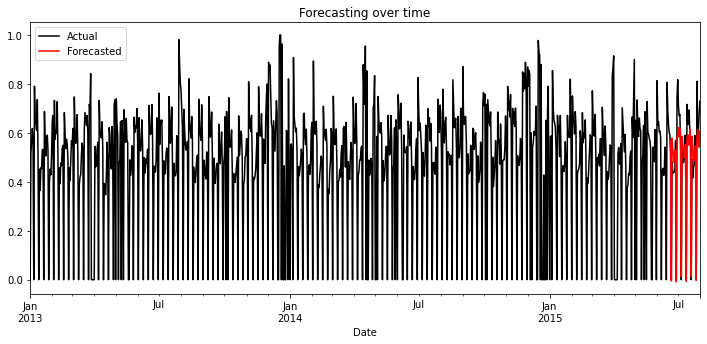

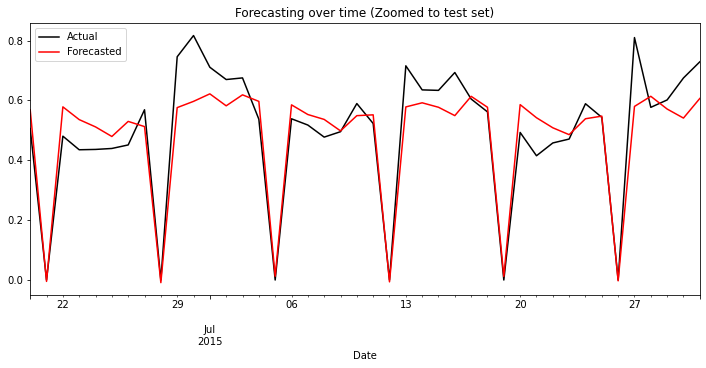

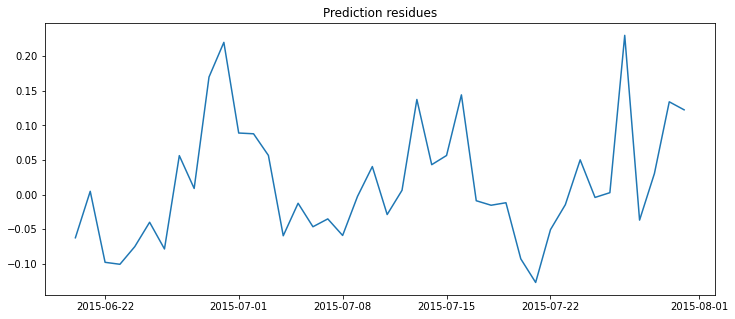

,y,pred,rel_err
Date,,,
2015-07-21,0.415083,0.542067,0.305924
2015-07-27,0.809854,0.579872,0.283980
2015-06-30,0.816591,0.596726,0.269248
2015-06-23,0.435093,0.535841,0.231555
2015-06-29,0.745701,0.575919,0.227682
2015-07-16,0.693112,0.549122,0.207744
2015-06-22,0.480543,0.578438,0.203717
2015-07-30,0.674912,0.540938,0.198506
2015-07-13,0.715535,0.578188,0.191951


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


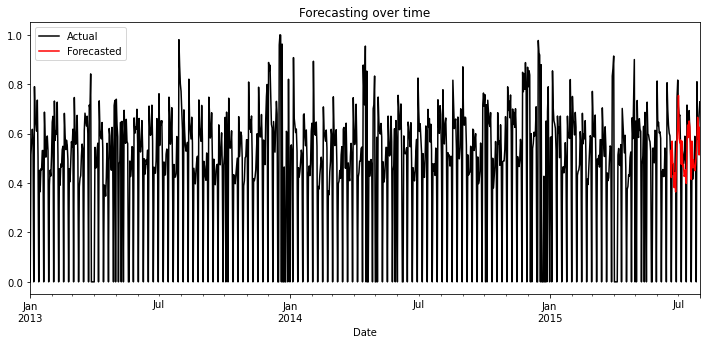

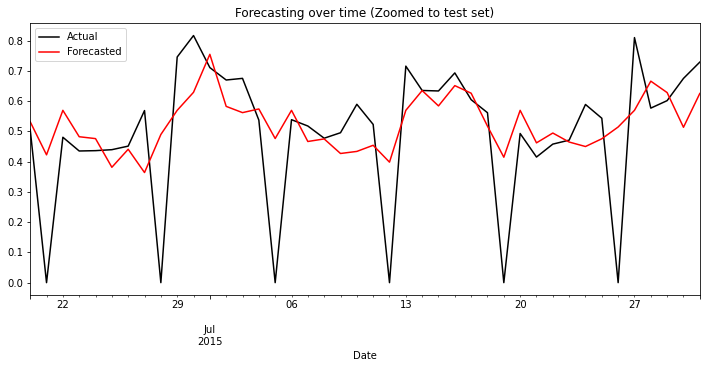

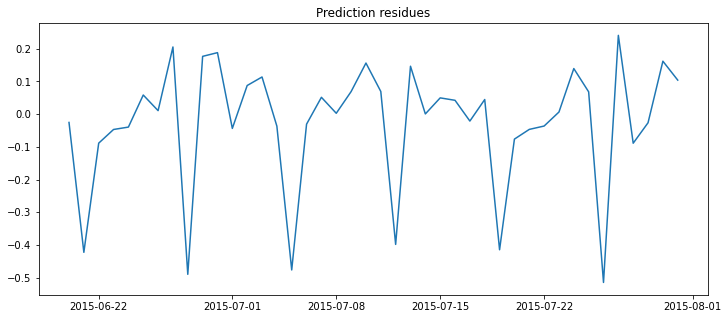

,y,pred,rel_err
Date,,,
2015-07-26,0.000000,0.514396,1.080925
2015-06-28,0.000000,0.489595,1.028809
2015-07-05,0.000000,0.476226,1.000715
2015-06-21,0.000000,0.422417,0.887643
2015-07-19,0.000000,0.414547,0.871106
2015-07-12,0.000000,0.398207,0.836770
2015-06-27,0.568728,0.363822,0.360288
2015-07-27,0.809854,0.569459,0.296837
2015-07-10,0.589442,0.433686,0.264243


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

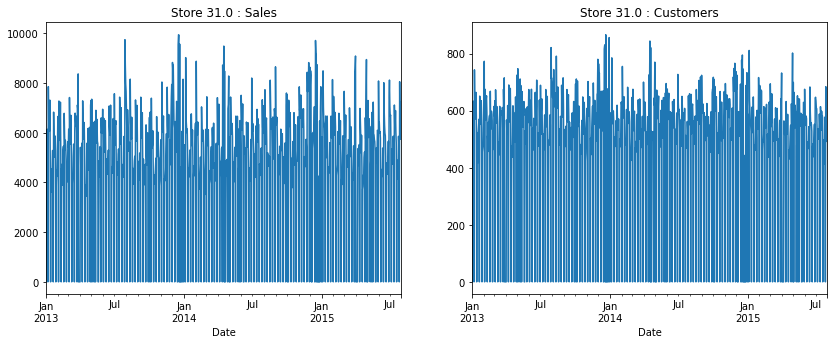

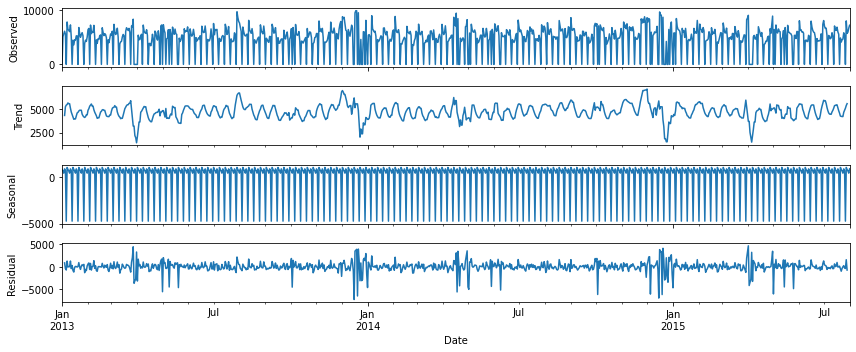

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


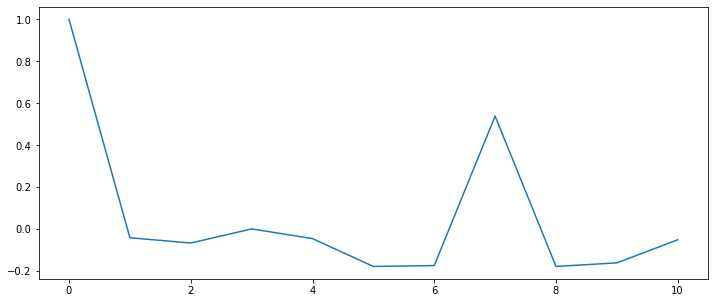

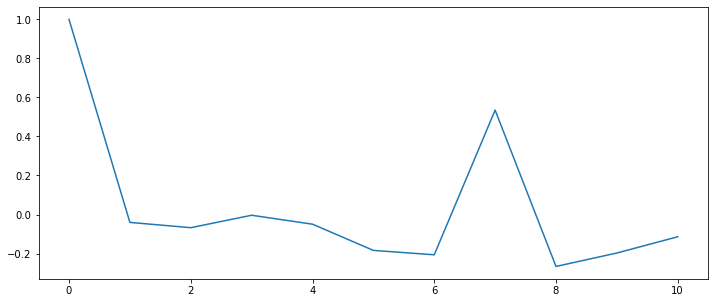

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


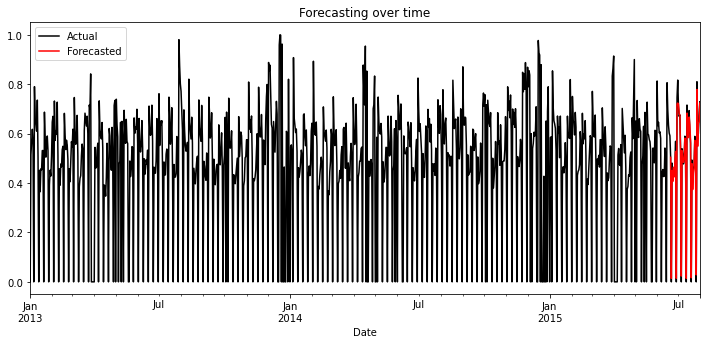

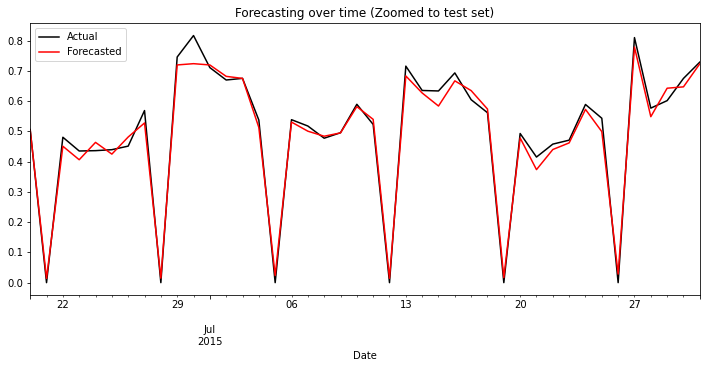

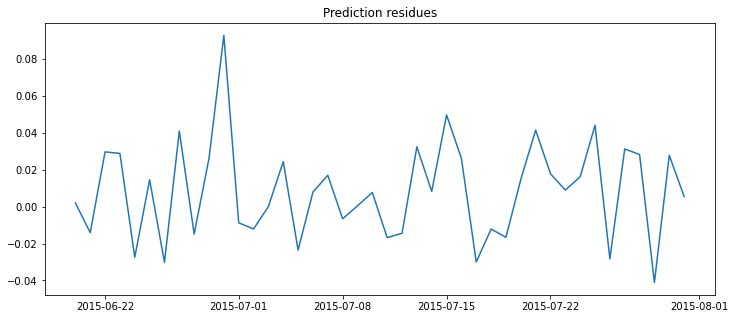

,y,pred,rel_err
Date,,,
2015-06-30,0.816591,0.723660,0.113803
2015-07-21,0.415083,0.373514,0.100145
2015-07-25,0.543288,0.499123,0.081292
2015-07-15,0.633484,0.583701,0.078587
2015-06-27,0.568728,0.527686,0.072164
2015-07-29,0.601508,0.642570,0.068264
2015-06-26,0.451181,0.481333,0.066829
2015-06-23,0.435093,0.406194,0.066421
2015-06-24,0.436199,0.463569,0.062746


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


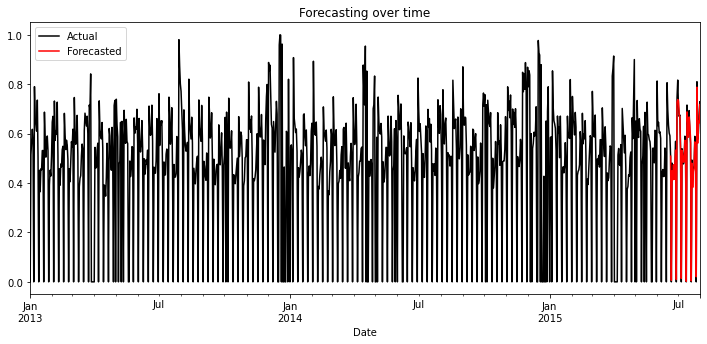

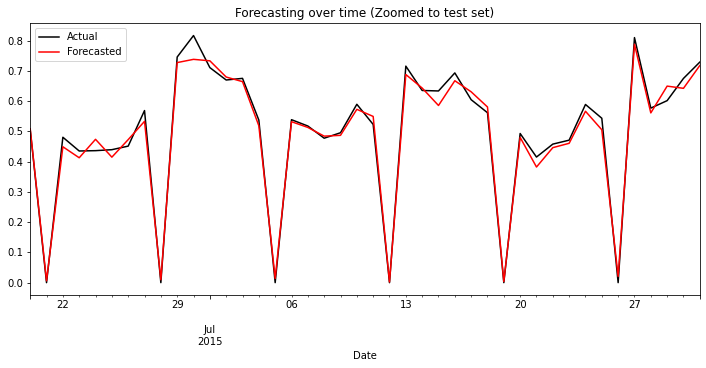

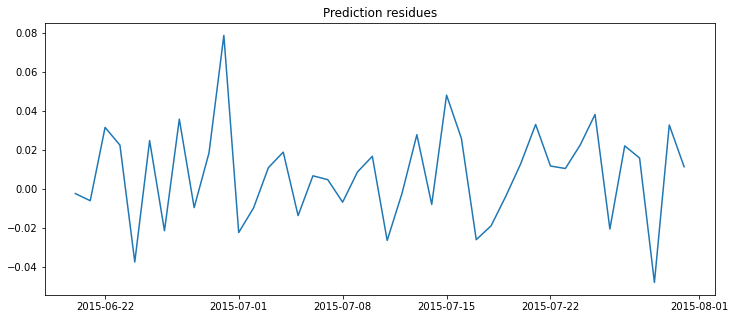

,y,pred,rel_err
Date,,,
2015-06-30,0.816591,0.737971,0.096278
2015-06-24,0.436199,0.473687,0.085942
2015-07-29,0.601508,0.649501,0.079787
2015-07-21,0.415083,0.382129,0.079392
2015-07-15,0.633484,0.585495,0.075754
2015-07-25,0.543288,0.505202,0.070103
2015-06-22,0.480543,0.449093,0.065447
2015-06-27,0.568728,0.533081,0.062679
2015-06-25,0.439417,0.414727,0.056187


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


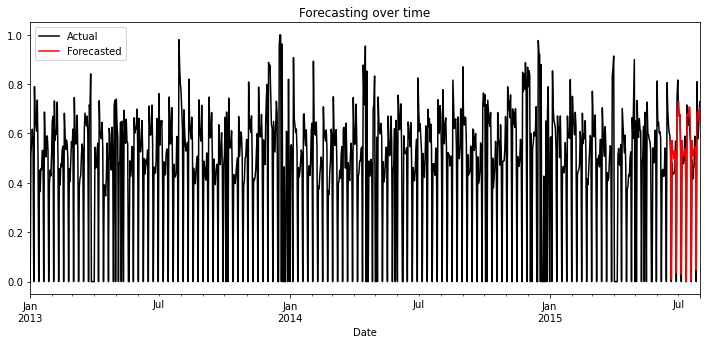

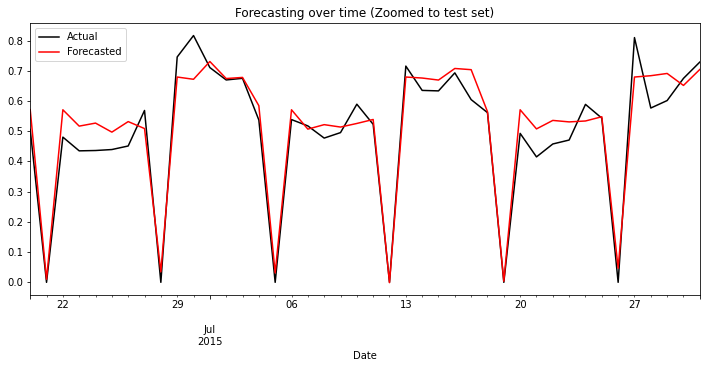

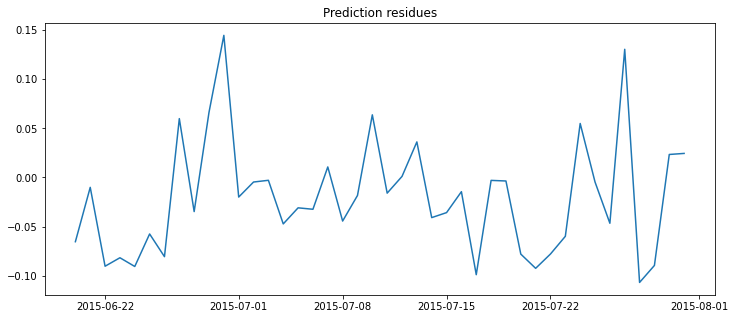

,y,pred,rel_err
Date,,,
2015-07-21,0.415083,0.507681,0.223084
2015-06-24,0.436199,0.526912,0.207961
2015-06-22,0.480543,0.571002,0.188244
2015-06-23,0.435093,0.516911,0.188048
2015-07-28,0.576772,0.683744,0.185466
2015-06-26,0.451181,0.531889,0.178881
2015-06-30,0.816591,0.671902,0.177187
2015-07-22,0.457818,0.535801,0.170337
2015-07-17,0.604625,0.703697,0.163856


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


--------------------------------------------  46 ----------------------------------------------------


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

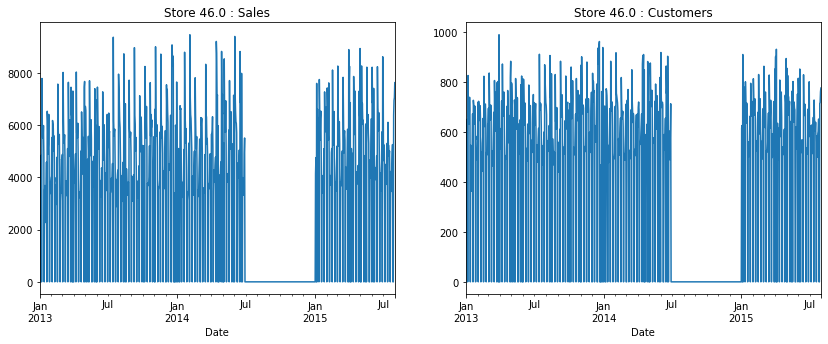

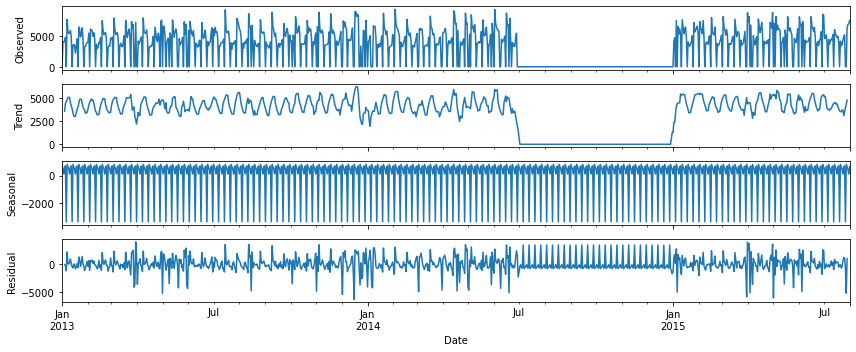

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


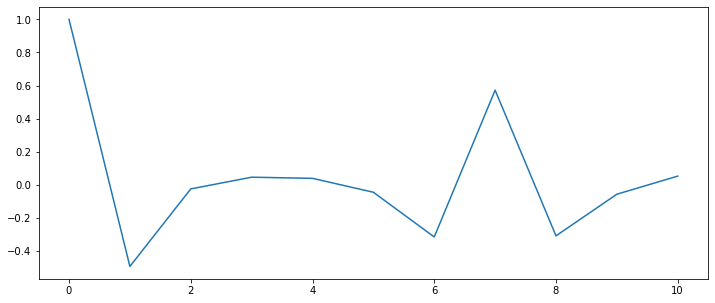

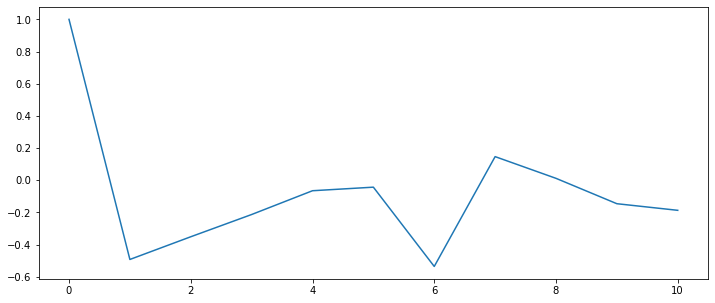

Attempt ARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


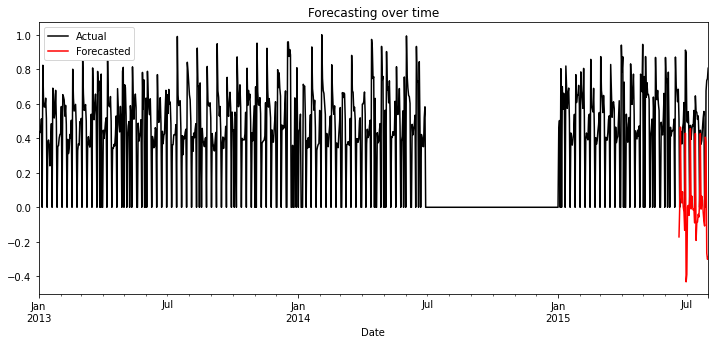

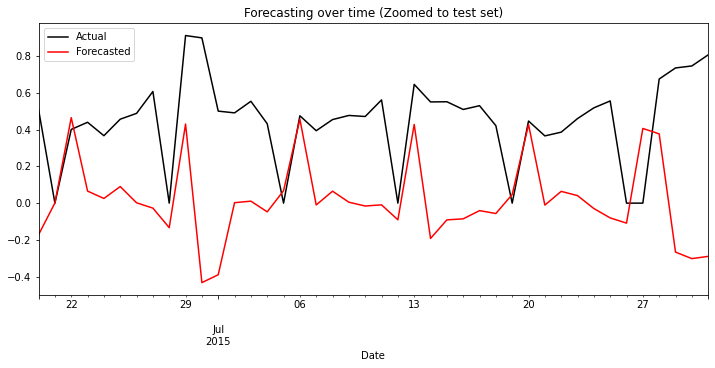

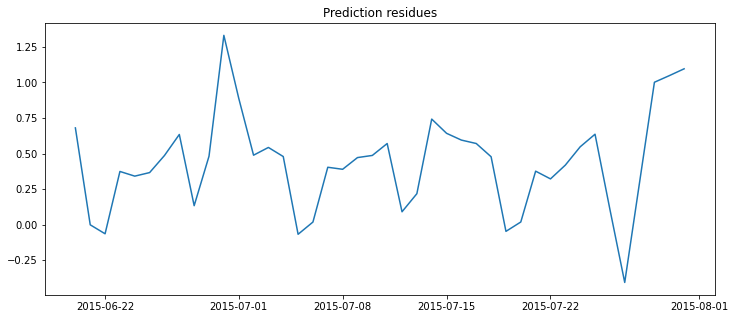

,y,pred,rel_err
Date,,,
2015-07-01,0.500211,-0.389307,1.778285
2015-06-30,0.898542,-0.432261,1.481070
2015-07-30,0.745825,-0.301656,1.404459
2015-07-29,0.735045,-0.266126,1.362054
2015-07-31,0.806172,-0.289494,1.359097
2015-07-14,0.550201,-0.192078,1.349105
2015-06-20,0.508561,-0.171699,1.337619
2015-07-16,0.509300,-0.085287,1.167460
2015-07-15,0.551258,-0.091009,1.165093


Attempt SARIMA model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


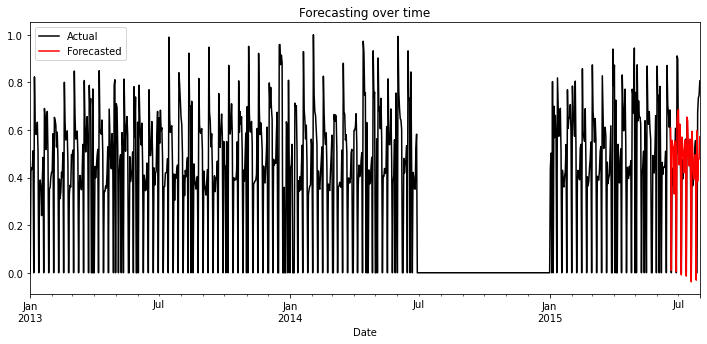

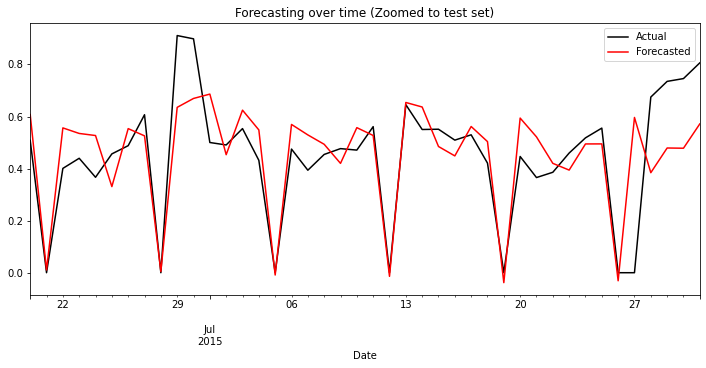

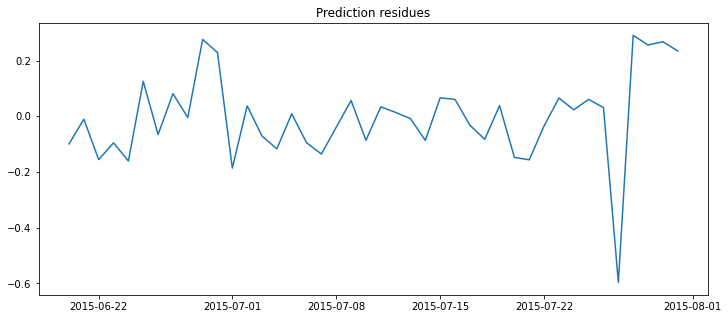

,y,pred,rel_err
Date,,,
2015-07-27,0.000000,0.596477,1.656868
2015-06-24,0.366624,0.527013,0.437475
2015-07-28,0.674804,0.384246,0.430582
2015-07-21,0.365568,0.521843,0.427488
2015-06-22,0.400761,0.556348,0.388229
2015-07-01,0.500211,0.686183,0.371786
2015-07-30,0.745825,0.478250,0.358764
2015-07-29,0.735045,0.479127,0.348166
2015-07-07,0.393786,0.529414,0.344421


Attempt VAR model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:157: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


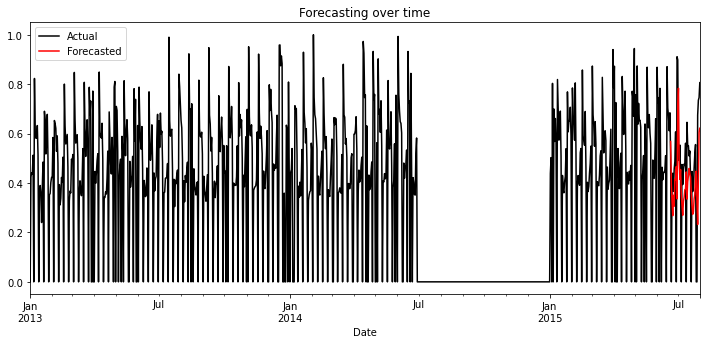

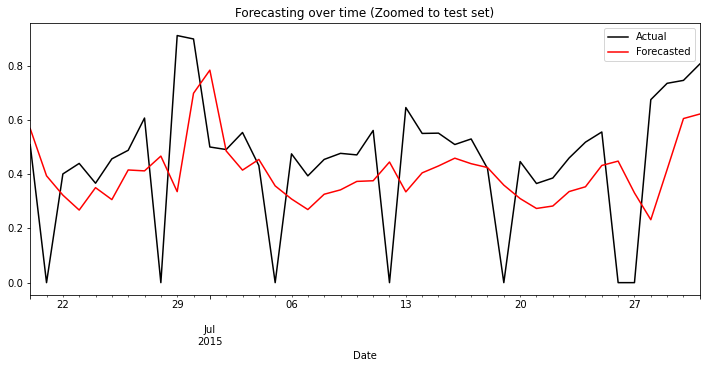

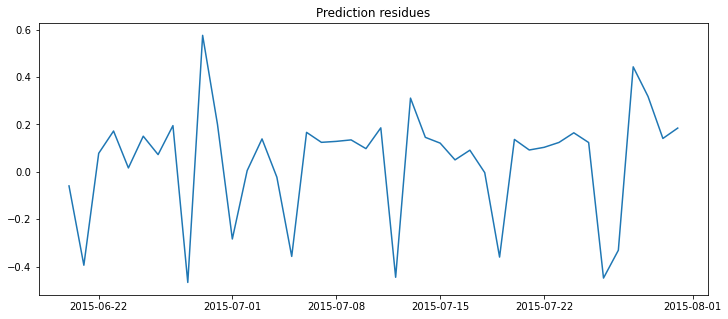

,y,pred,rel_err
Date,,,
2015-06-28,0.000000,0.466621,1.296160
2015-07-26,0.000000,0.448151,1.244854
2015-07-12,0.000000,0.444843,1.235666
2015-06-21,0.000000,0.393947,1.094288
2015-07-19,0.000000,0.359643,0.999002
2015-07-05,0.000000,0.356784,0.991060
2015-07-27,0.000000,0.330796,0.918871
2015-07-28,0.674804,0.232032,0.656150
2015-06-29,0.911118,0.335568,0.631696


Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Promo2_Subscribed'],
      dtype='object')

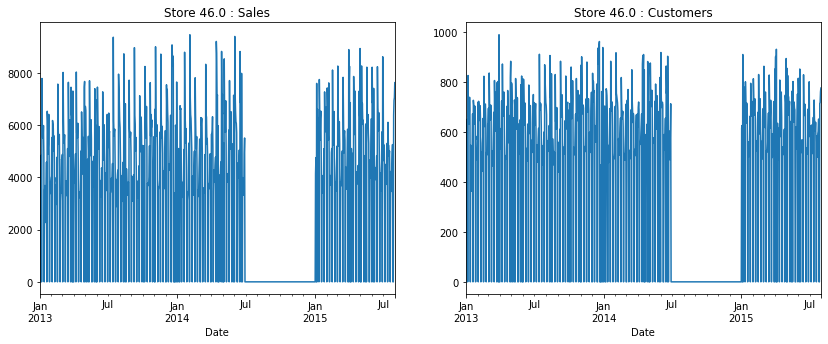

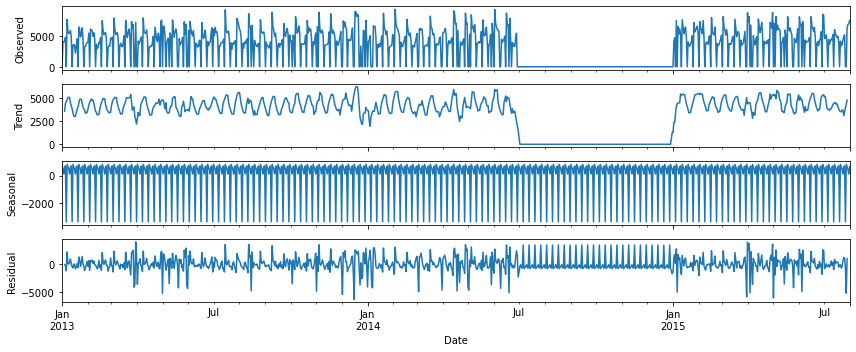

C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


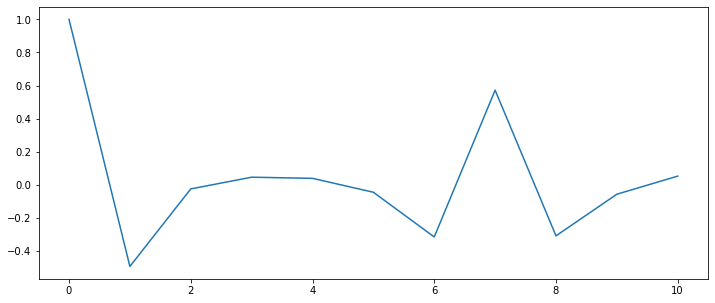

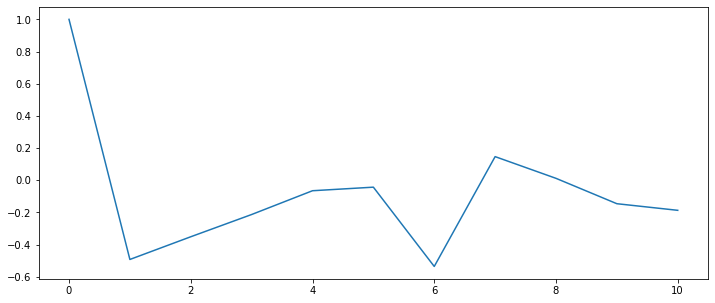

Attempt ARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


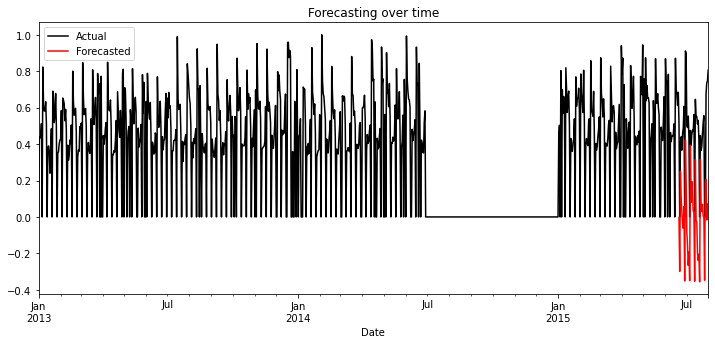

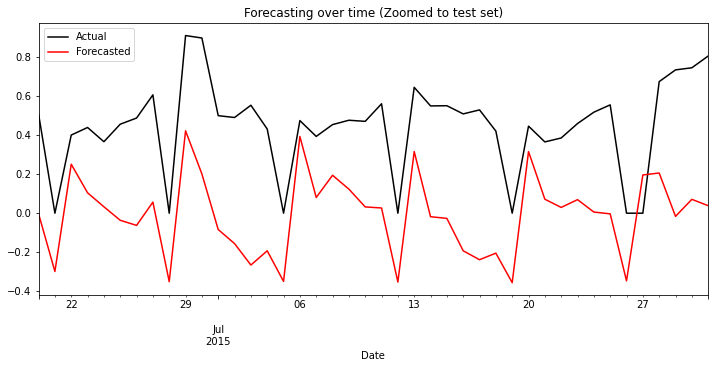

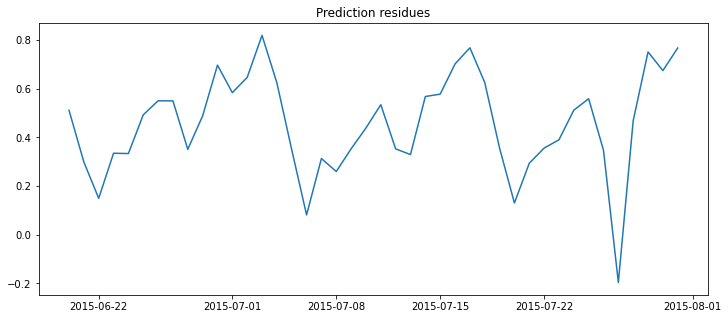

,y,pred,rel_err
Date,,,
2015-07-18,0.421053,-0.204934,1.486719
2015-07-03,0.553688,-0.265913,1.480257
2015-07-17,0.529803,-0.238628,1.450408
2015-07-04,0.431727,-0.192897,1.446804
2015-07-16,0.509300,-0.192872,1.378700
2015-07-02,0.490805,-0.155814,1.317466
2015-07-01,0.500211,-0.084004,1.167937
2015-06-26,0.488057,-0.062574,1.128211
2015-06-25,0.456457,-0.036390,1.079723


Attempt SARIMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


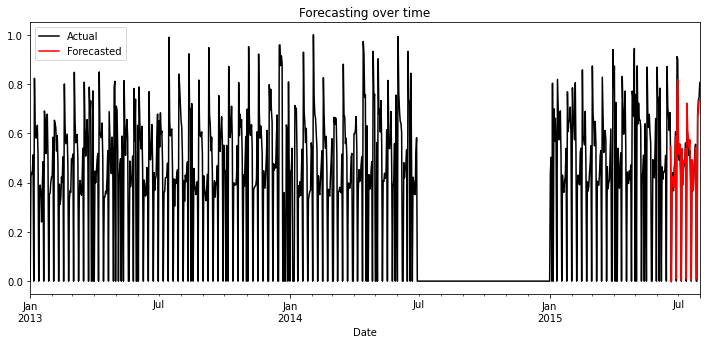

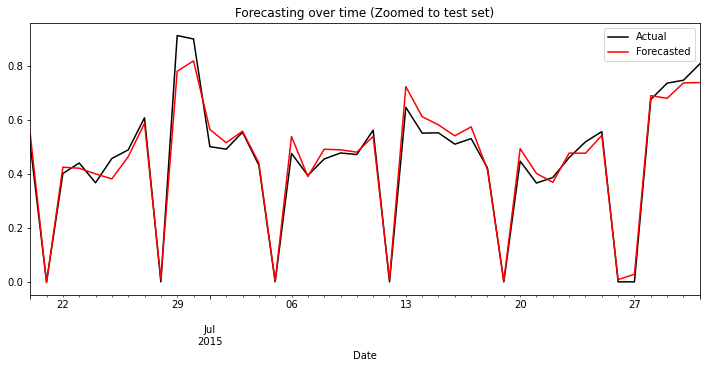

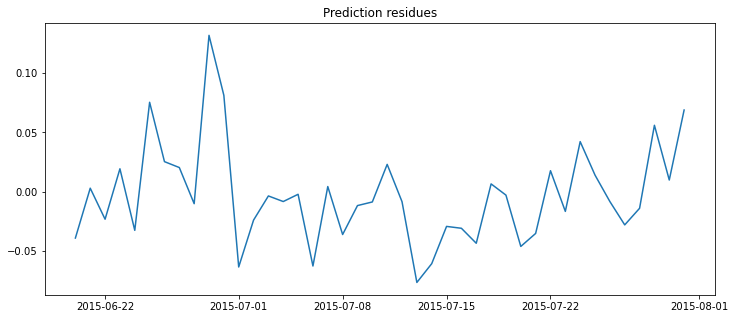

,y,pred,rel_err
Date,,,
2015-06-25,0.456457,0.380979,0.165357
2015-06-29,0.911118,0.779127,0.144867
2015-07-06,0.474952,0.537736,0.132189
2015-07-01,0.500211,0.563817,0.127157
2015-07-13,0.645635,0.722296,0.118737
2015-07-14,0.550201,0.611013,0.110528
2015-07-20,0.446523,0.492776,0.103586
2015-07-21,0.365568,0.400845,0.096501
2015-06-30,0.898542,0.817225,0.090498


Attempt VARMAX model


C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:157: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\syadati\Anaconda3\lib\site-packages\statsmodels\base\model.py:511: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


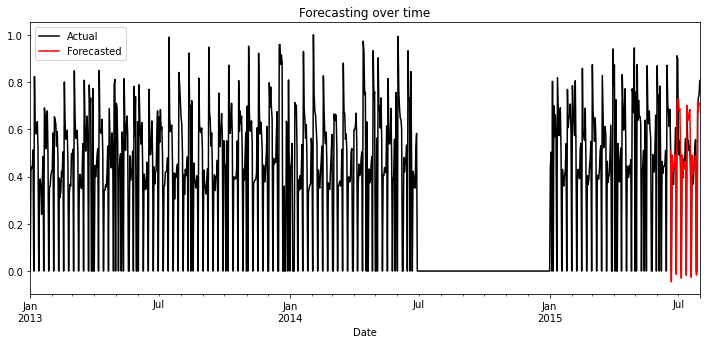

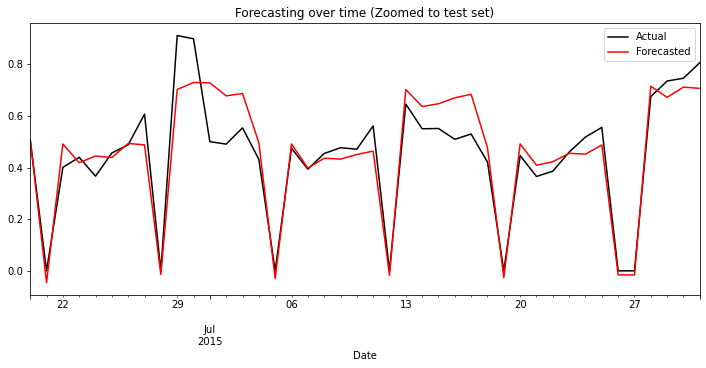

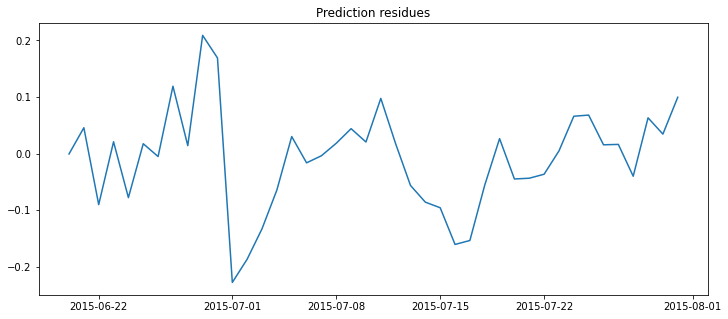

,y,pred,rel_err
Date,,,
2015-07-01,0.500211,0.728135,0.455655
2015-07-02,0.490805,0.677533,0.380452
2015-07-16,0.509300,0.670022,0.315573
2015-07-17,0.529803,0.683533,0.290164
2015-07-03,0.553688,0.686680,0.240193
2015-06-29,0.911118,0.702038,0.229477
2015-06-22,0.400761,0.491057,0.225311
2015-06-24,0.366624,0.444554,0.212558
2015-06-27,0.606954,0.487789,0.196333


,ModelName,RMSE,MAPE,Store
0,ARIMA,0.21,27.506467,1
1,SARIMA,0.09,13.035615,1
2,VAR,0.20,24.108001,1
3,ARIMAX,0.03,4.087525,1
4,SARIMAX,0.03,3.574527,1
5,VARMAX,0.07,11.087628,1
6,ARIMA,0.23,33.680553,3
7,SARIMA,0.13,14.498954,3
8,VAR,0.25,34.086577,3
9,ARIMAX,0.04,5.826962,3


In [57]:
results_compare = pd.DataFrame();

for store_id in store_ids:
    print("-------------------------------------------- ", store_id, "----------------------------------------------------")
    df_store = df[df.Store == store_id];
    result_df = forecast_tsa(df_store, "Sales", 42)
    result_df["Store"] = store_id;
    results_compare = results_compare.append(result_df, ignore_index=True) 
    
    result_df = forecast_tsa(df_store, "Sales", 42, exog_var=["Open", "Promo", "DayOfWeek", "Customers"])
    result_df["Store"] = store_id;
    results_compare = results_compare.append(result_df, ignore_index=True)
    display(results_compare)
    

#### Plot error stats for each model for each store

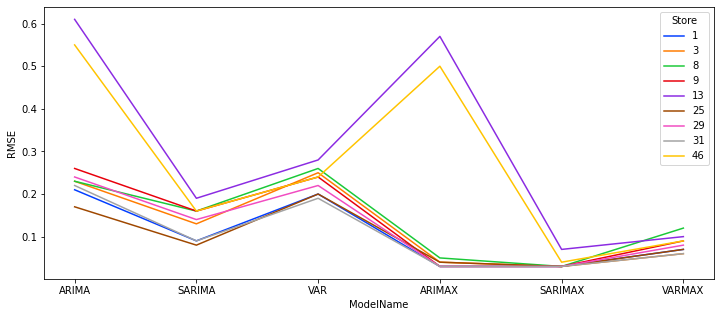

In [58]:
models = results_compare.ModelName.unique();
ax = sb.lineplot(data=results_compare, x = "ModelName", y = "RMSE", hue="Store", palette="bright")

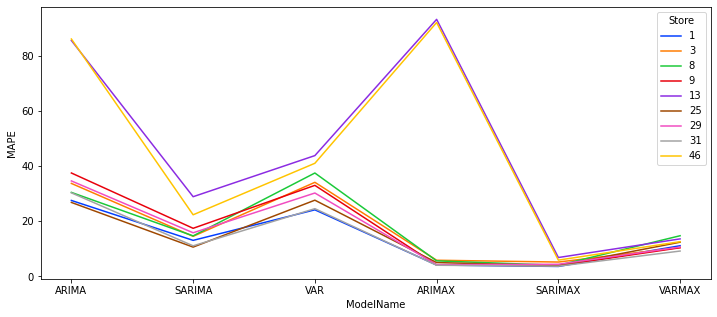

In [59]:
ax = sb.lineplot(data=results_compare, x = "ModelName", y = "MAPE", hue="Store", palette="bright")

# Conclusions

The best model for each store is:
> Store 1: SARIMAX </br>
> Store 3: SARIMAX </br>
> Store 8: SARIMAX </br>
> Store 9: SARIMAX </br>
> Store 13: SARIMAX </br>
> Store 25: SARIMAX </br>
> Store 29: ARIMAX </br>
> Store 31: SARIMAX </br>
> Store 46: SARIMAX </br>

As we can see, almost all the stores have better MAPE with SARIMAX, which is understandable. We use seasonality and the contribution of external factors such as store being Open/Closed, if it is a holiday or not, etc. 